<a href="https://colab.research.google.com/github/iotanalytics/IoTTutorial/blob/main/Song's_IoTStreamAI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **IoT stream data analytics: techniques and comparisons**
---

> **Outlines**

> This article examines the taxonomy of IoT stream data analytics techniques and compares their advantages and disadvantages. We only survey the time series sensor data applicable methods. For each method, the runnable code examples are included. The included source code always starts with a synthetic/real time series sensor data and can run alone with all customerized library included. The  generic or image related methods are not in our scope.



Some python libararies for stream data analytics:
* time series analysis: https://www.statsmodels.org/stable/examples/index.html#time-series-analysis
* audio analysis: https://github.com/tyiannak/pyAudioAnalysis/tree/master/pyAudioAnalysis
* vibration analysis: https://github.com/saran87/Vibration-Signal-Analysis/blob/master/Vibration%20Analysis.ipynb
* speech recognition: https://pypi.org/project/SpeechRecognition/
* machine learning for time series: https://github.com/alan-turing-institute/sktime sktime is a Python machine learning toolbox for time series with a unified interface for multiple learning tasks. It currently support:
  Forecasting,
  Time series classification,
  Time series regression.
  sktime provides dedicated time series algorithms and scikit-learn compatible tools for building, tuning, and evaluating composite models.
For deep learning methods, see our companion package: sktime-dl: https://github.com/sktime/sktime-dl

Machine learning pros and cons:
* https://towardsdatascience.com/pros-and-cons-of-various-classification-ml-algorithms-3b5bfb3c87d6
* https://elitedatascience.com/machine-learning-algorithms

Data science interview questions: https://towardsdatascience.com/over-100-data-scientist-interview-questions-and-answers-c5a66186769a

Some related books or articles
* A Tour of Machine Learning Algorithms
https://machinelearningmastery.com/a-tour-of-machine-learning-algorithms/
* Machine learning in manufacturing: advantages, challenges, and applications https://www.tandfonline.com/doi/pdf/10.1080/21693277.2016.1192517
* The Complete Guide to Machine Learning for Sensors and Signal Data: https://reality.ai/machine-learning-for-sensors-and-signal-data/

#Introduction



## Code Framework Setup

https://docs.google.com/document/d/1QJXuj7QSSELJS6csDXWaFfo6WzOwoyIRQ-uOSiPae6E/edit

## Environment setup

Colab already comes with most common data science libraries such as numpy, scipy, skilearn, etc. For the additional libraries, please run the following code one time to set up a virtual disk with your google account, then you can install the required python packages in there. For example, to install influxdb python lib, just insert "!pip3 install influxdb". 

Colab file can also be run locally just like a local python program. This is recommended for more efficient learning and test.

In [ ]:
import os, sys
from google.colab import drive
drive.mount('/content/mnt')
nb_path = '/content/notebooks'
os.symlink('/content/mnt/My Drive/Colab Notebooks', nb_path)
sys.path.insert(5, nb_path)

!pip3 install influxdb

Mounted at /content/mnt
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 77 kB 4.1 MB/s 


## Data Preparation

### Read vibration data of a false OnBed

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/urllib3/connectionpool.py:986: InsecureRequestWarning: Unverified HTTPS request is being made to host 'sensorweb.us'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning,


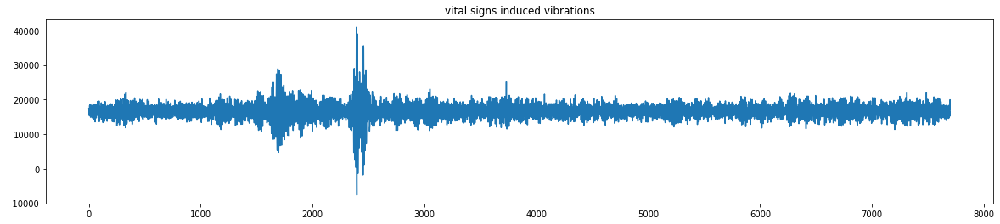

In [ ]:
# b8:27:eb:80:1c:cf	2020-10-22T10:37:43.000000Z	2020-10-22T10:42:00.000000Z
# https://homedots.us:3000/d/o2RBARGMz/bed-dashboard-algtest?var-mac=b8:27:eb:80:1c:cf&orgId=1&from=1603363063000&to=1603363320000

import numpy as np
import csv
import matplotlib.pyplot as plt
import pywt
from influxdb import InfluxDBClient
import operator
import scipy.signal as sg
import scipy as sp

ip = "sensorweb.us" 
unit = "b8:27:eb:80:1c:cf" # BedJ
stampIni = "2020-10-22T14:38:43.000000Z" # UTC time = EST time + 4
stampEnd = "2020-10-22T14:40:00.000000Z"
client = InfluxDBClient(ip, "8086", "test", "sensorweb", "shake", True)

query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\')  and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\'   '
result = client.query(query)
points = list(result.get_points())
values =  map(operator.itemgetter('value'), points)
times  =  map(operator.itemgetter('time'),  points)
data = np.array(list(values))
fs = 100 # for vibration data

if(len(data) == 0):
  print("No data in the chosen time range!")
  quit()
plt.figure(figsize=(20, 4))
plt.title("vital signs induced vibrations")
plt.plot(data)

### Read vibration data of vital signs

2021-01-11T14:41:10.000000
Start: 1610394070.0 1610394070000000000 End: 1610394080.0 1610394080000000000
2020-11-24T14:49:20.000000
Start: 1606247360.0 1606247360000000000 End: 1606247370.0 1606247370000000000
2020-12-10T10:34:00.000000
Start: 1607614440.0 1607614440000000000 End: 1607614450.0 1607614450000000000
2021-02-02T15:25:52.000000
Start: 1612297552.0 1612297552000000000 End: 1612297562.0 1612297562000000000


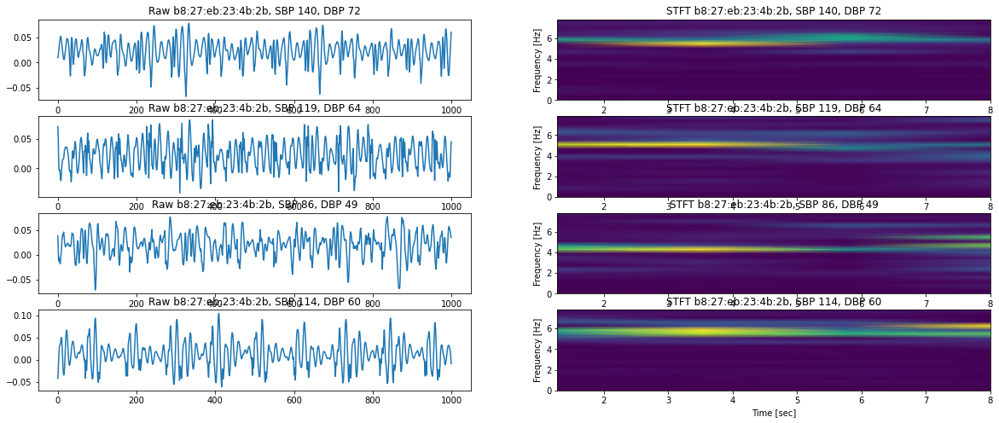

In [ ]:
#!/usr/bin/env python3

from scipy import signal
import numpy as np
import matplotlib.pyplot as plt
from scipy import fft
from sklearn import preprocessing

import csv
import matplotlib.pyplot as plt
import pywt
from influxdb import InfluxDBClient
import operator
import scipy.signal as sg
import scipy as sp
import pytz
from datetime import datetime
import warnings
warnings.filterwarnings("ignore")

# This function converts the time string to epoch time xxx.xxx (second.ms).
# Example: time = "2020-08-13T02:03:00.200", zone = "UTC" or "America/New_York"
# If time = "2020-08-13T02:03:00.200Z" in UTC time, then call timestamp = local_time_epoch(time[:-1], "UTC"), which removes 'Z' in the string end
def local_time_epoch(time, zone):
    local_tz = pytz.timezone(zone)
    localTime = datetime.strptime(time, "%Y-%m-%dT%H:%M:%S.%f")
    local_dt = local_tz.localize(localTime, is_dst=None)
    # utc_dt = local_dt.astimezone(pytz.utc)
    epoch = local_dt.timestamp()
    # print("epoch time:", epoch) # this is the epoch time in seconds, times 1000 will become epoch time in milliseconds
    # print(type(epoch)) # float
    return epoch 

# This function converts the epoch time xxx.xxx (second.ms) to time string.
# Example: time = "2020-08-13T02:03:00.200", zone = "UTC" or "America/New_York"
# If time = "2020-08-13T02:03:00.200Z" in UTC time, then call timestamp = local_time_epoch(time[:-1], "UTC"), which removes 'Z' in the string end
def epoch_time_local(epoch, zone):
    local_tz = pytz.timezone(zone)
    time = datetime.fromtimestamp(epoch).astimezone(local_tz).strftime("%Y-%m-%dT%H:%M:%S.%f")
    return time 

# This function converts the grafana URL time to epoch time. For exmaple, given below URL
# https://sensorweb.us:3000/grafana/d/OSjxFKvGk/caretaker-vital-signs?orgId=1&var-mac=b8:27:eb:6c:6e:22&from=1612293741993&to=1612294445244
# 1612293741993 means epoch time 1612293741.993; 1612294445244 means epoch time 1612294445.244
def grafana_time_epoch(time):
    return time/1000

# We use epoch time in the InfluxDB query. Any other time format may be converted to epoch time.
# Two options below: (1) local time - advantage: human understandable; (2) grafana time - advantage: shown in URL 

# the time string may be converted to epoch time with local_time_epoch()
# do not use "Z" in the end, because that means UTC time
# info_list = [
#             ['b8:27:eb:23:4b:2b', '2021-01-11T14:41:10.000'],  # 141.,  73.
#             ['b8:27:eb:23:4b:2b', '2020-11-24T14:49:20.000'], # 119.,  64
#             ['b8:27:eb:23:4b:2b', '2020-12-10T10:34:00.000'],  # 88., 50
#             ['b8:27:eb:23:4b:2b', '2021-02-02T15:25:52.000'],
#             ]

# the grafana time may be converted to epoch time with grafana_time_epoch()
info_list = [
            ['b8:27:eb:23:4b:2b', 1610394070000],  # 141.,  73.
            ['b8:27:eb:23:4b:2b', 1606247360000], # 119.,  64
            ['b8:27:eb:23:4b:2b', 1607614440000],  # 88., 50
            ['b8:27:eb:23:4b:2b', 1612297552000],
            ]

duration = 10 # seconds


plt.figure(figsize=(20, 8))

for ind, info in enumerate(info_list):

    ip = "sensorweb.us"
    unit = info[0] # BedJ
    # start_epoch = local_time_epoch(info[1], "America/New_York") 
    start_epoch = grafana_time_epoch(info[1]) 
    print(epoch_time_local(start_epoch, "America/New_York"))

    end_epoch = start_epoch + duration # info[2]

    stampIni = str(int(start_epoch*10e8))
    stampEnd = str(int(end_epoch*10e8))
    print("Start:",  start_epoch,  stampIni, "End:", end_epoch, stampEnd)

    client = InfluxDBClient(ip, "8086", "test", "sensorweb", "shake_ctru", True)
    query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\')  and time >= '+stampIni+' and time <= '+stampEnd
    # query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\') and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\''

    result = client.query(query)
    points = list(result.get_points())
    values =  map(operator.itemgetter('value'), points)
    times  =  map(operator.itemgetter('time'),  points)
    data = np.array(list(values))

    client = InfluxDBClient(ip, "8086", "test", "sensorweb", "caretaker4_ctru", True)
    unit = "ca:re:ta:ke:r0:00"
    query = 'SELECT mean("systolic") FROM caretaker4 WHERE ("location" = \''+unit+'\') and time >= ' +stampIni+' and time <= '+stampEnd
    # query = 'SELECT mean("systolic") FROM caretaker4 WHERE ("location" = \''+unit+'\') and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\''
    result = client.query(query)
    points = list(result.get_points())
    values =  map(operator.itemgetter('mean'), points)
    times  =  map(operator.itemgetter('time'),  points)
    # import pdb; pdb.set_trace()
    systolic = int(np.array(list(values)))
    # info[3] = systolic
    # print(systolic)

    client = InfluxDBClient(ip, "8086", "test", "sensorweb", "caretaker4_ctru", True)
    unit = "ca:re:ta:ke:r0:00"
    query = 'SELECT mean("diastolic") FROM caretaker4 WHERE ("location" = \''+unit+'\') and time >= ' +stampIni+' and time <= '+stampEnd
    result = client.query(query)
    points = list(result.get_points())
    values =  map(operator.itemgetter('mean'), points)
    times  =  map(operator.itemgetter('time'),  points)
    # import pdb; pdb.set_trace()
    diastolic = int(np.array(list(values)))
    # info[4] = diastolic
    # print(diastolic)


    # fs = 100
    # N = fs * duration
    # amp = 2 * np.sqrt(2)
    # noise_power = 0.01 * fs / 2
    # time = np.arange(N)/float(fs)
    # # mod = 500 * np.cos(2*np.pi*0.25*time)
    # carrier = amp * np.sin(2*np.pi*5*time) + amp * np.sin(2*np.pi*3*time) #+mod) # 3Hz + 5Hz signals
    # # noise = np.random.normal(scale=np.sqrt(noise_power), size=time.shape)
    # # noise *= np.exp(-time/5)
    # data = carrier # + noise

    # use seismic data
    x = data/np.linalg.norm(data)
    fs = 100
    fmin = 0
    fmax = 10
    npseg = 200
    slidingstep=20

    # plt.figure(figsize=(20, 4))
    plt.subplot(len(info_list),2,2*ind+1)
    plt.plot(x)
    plt.title(f'Raw {info[0]}, SBP {systolic}, DBP {diastolic}')

    # f, t, Zxx = signal.stft(x, fs, nperseg=npseg, noverlap = npseg-slidingstep)
    f, t, Zxx = signal.spectrogram(x, fs)
    
    plt.subplot(len(info_list),2,2*ind+2)
    plt.pcolormesh(t, f[int(fmin*npseg/fs):int(fmax*npseg/fs)+1], np.abs(Zxx[int(fmin*npseg/fs):int(fmax*npseg/fs)+1,:]), shading='gouraud')
    #plt.pcolormesh(t, f, np.abs(Zxx), shading='gouraud')
    plt.title(f'STFT {info[0]}, SBP {systolic}, DBP {diastolic}')
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time [sec]')
    
plt.show()


epoch time: 1603908780.0
epoch time: 1603908810.0
Click here to see the results in Grafana:

https://sensorweb.us:3000/d/o2RBARGMz/bed-dashboard-algtest?var-mac=b8:27:eb:6c:6e:22&from=1603908780000&to=1603908810000&orgId=1&refresh=3s


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/urllib3/connectionpool.py:986: InsecureRequestWarning: Unverified HTTPS request is being made to host 'sensorweb.us'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning,


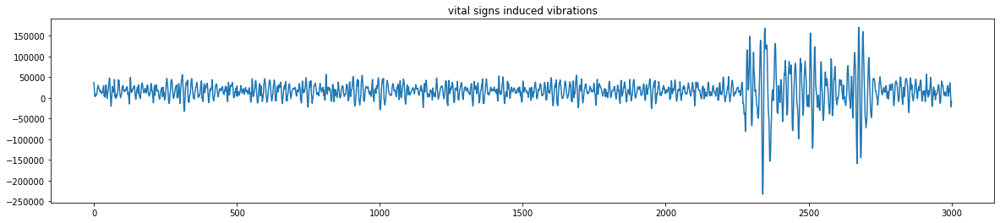

In [ ]:
import numpy as np
import csv
import matplotlib.pyplot as plt
import pywt
from influxdb import InfluxDBClient
import operator
import scipy.signal as sg
import scipy as sp

unit = "b8:27:eb:6c:6e:22"
stampIni = "2020-10-28T18:13:00.000Z" # UTC time = EST time + 4
stampEnd = "2020-10-28T18:13:30.000Z"
# stampIni = "2020-10-30T14:30:00.000" # EST time
# stampEnd = "2020-10-30T14:31:00.000"

startEpoch = timeToEpoch(stampIni, "Etc/UTC") #"America/New_York") # "
endEpoch = timeToEpoch(stampEnd, "Etc/UTC") #"America/New_York") #

url = "https://" + ip + ":3000/d/o2RBARGMz/bed-dashboard-algtest?var-mac=" + str(unit)
url = url + "&from=" + str(int(startEpoch*1000)) #+ "000" 
url = url + "&to=" + str(int(endEpoch*1000)) #+ "000"
url = url + "&orgId=1&refresh=3s"
print("Click here to see the results in Grafana:\n\n" + url)
#  input("Press any key to continue")
# webbrowser.open(url, new=2)

# query2
query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\') and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\''
result = client.query(query)
points = list(result.get_points())
values = map(operator.itemgetter('value'), points)
times = map(operator.itemgetter('time'), points)
data = np.array(list(values))
plt.figure(figsize=(20, 4))
plt.title("vital signs induced vibrations")
plt.plot(data)

### Read vibration data of footsteps


In [ ]:
import numpy as np
import csv
import matplotlib.pyplot as plt
import pywt
from influxdb import InfluxDBClient
import operator
import scipy.signal as sg
import scipy as sp

ip = "sensorweb.us" 
unit = "b8:27:eb:76:15:20" # FloorB
stampIni = "2020-07-07T19:18:14.000Z" # UTC time = EST time + 4
stampEnd = "2020-07-07T19:18:22.000Z"
client = InfluxDBClient(ip, "8086", "test", "sensorweb", "shake",  True)
# Check FloorB at http://3.136.84.223:3000/d/3HdIpxGMz/s-house-dashboard-raw-data-only?orgId=1&from=1594149493945&to=1594149503005

query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\')  and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\'   '
result = client.query(query)
points = list(result.get_points())
values =  map(operator.itemgetter('value'), points)
times  =  map(operator.itemgetter('time'),  points)
data = np.array(list(values))
fs = 100 # for vibration data

if(len(data) == 0):
  print("No data in the chosen time range!")
  quit()
plt.figure(figsize=(20, 4))
plt.title("footstep induced vibrations")
plt.plot(data)

ModuleNotFoundError: ignored

### Read electrical waveform data under attack

readme: https://drive.google.com/file/d/1xvjaf0fd9wb_qca0XiZ5MG1hvfQNy70R/view?usp=sharing

data: https://www.sensorweb.us:3000/d/OmPkx0wZz/waveform?orgId=1 (guest/sensoreb_guest)

len: 20001


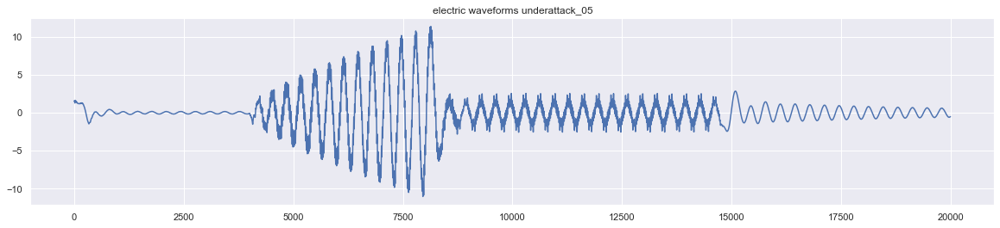

In [ ]:
import operator
import numpy as np
import matplotlib.pyplot as plt
from influxdb import InfluxDBClient
from statsmodels.tsa.seasonal import seasonal_decompose

ip_addr = "sensorweb.us"
user_name = "test"
user_pwd = "sensorweb"
db = "waveform"

client = InfluxDBClient(host=ip_addr, port=8086, username=user_name, password=user_pwd, database=db, ssl=True)

#tag_list = ["attack_01", "attack_07", "attack_08"]
tag_list = ["attack_05"]
# influxdb query data command
measurement = "sensor_04"
field_key = "Ib"
tag_key = "case"
#tag_value = "attack_08"
start_time = "" 
end_time = ""

for tag_value in tag_list:
  query_command = 'SELECT "'+ field_key + '"::field,"' + tag_key +'"::tag FROM "' + measurement + '" WHERE time >= \'' + start_time + '\' and time <= \'' + end_time + '\''
  if start_time:
      query_command = 'SELECT "'+ field_key + '"::field,"' + tag_key +'"::tag FROM "' + measurement + \
          '" WHERE ("'+ tag_key +'" = \''+tag_value+'\') and time >= \''+start_time+'\' and time <= \''+end_time+'\' '
  else:
      query_command = 'SELECT "'+ field_key + '"::field,"' + tag_key +'"::tag FROM "' + measurement + \
          '" WHERE ("'+ tag_key +'" = \''+tag_value+'\') ' 


  query_result = client.query(query_command)

  # points is a list of dictionary
  points = list(query_result.get_points())
  values =  map(operator.itemgetter(field_key), points)
  data = np.array(list(values))

  fs = 20000 # for electric waveform data, 20KHz

  if(len(data) == 0):
    print("No data in the chosen time range!")
    quit()
  else:
    print("len:", len(data))

  plt.figure(figsize=(20, 4))
  plt.title("electric waveforms under" + tag_value)
  plt.plot(data)
  plt.show()


# Preprocessing and Decomposition

Removing noises or decomposing the interested signals are the important first step of stream data analytics. Also, extracting meaningful time and frequency features are critically important to machine leanring algorithms.
Time series involves the use of data that are indexed by equally spaced increments of time (minutes, hours, days, weeks, etc.). Due to the discrete nature of time series data, many time series data sets have a seasonal and/or trend element built into the data. The first step in time series modeling is to account for existing seasons (a recurring pattern over a fixed period of time) and/or trends (upward or downward movement in the data). Accounting for these embedded patterns is what we call making the data stationary. 

A Comparative Study of Four Kinds of Adaptive Decomposition Algorithms and Their Applications
https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6068995/

During the late 1990s, Huang introduced the algorithm called Empirical Mode Decomposition (EMD), which is widely used today to recursively decompose a signal into different modes of unknown but separate spectral bands. EMD is known for limitations like sensitivity to noise and sampling. These limitations could only partially be addressed by more mathematical attempts to this decomposition problem, like synchrosqueezing, empirical wavelets or recursive variational decomposition. Variational Mode Decomposition (VMD) proposes an entirely non-recursive variational mode decomposition model, where the modes are extracted concurrently. The model looks for an ensemble of modes and their respective center frequencies, such that the modes collectively reproduce the input signal, while each being smooth after demodulation into baseband. In Fourier domain, this corresponds to a narrow-band prior. The VMD method is a generalization of the classic Wiener filter into multiple, adaptive bands. 

* Linear
  * Orthogonal decomposition: Fourier, SST, Wavelet, PCA (data-driven basis)
  * Non-orthogonal decompositions: frames 
  * algorithms: FFT, short-time Fourier transform, OMP (MP), convex optimization based method (demixing), dictionary learning
  * Ref: spectrum analysis: https://www.amazon.com/Spectral-Analysis-Signals-Petre-Stoica/dp/0131139568
* Non-linear 
  * envolope detector: https://en.wikipedia.org/wiki/Envelope_detector
  * ICA (independent), maximal correlation

* Seasonality in time series data: https://www.statsmodels.org/stable/examples/notebooks/generated/statespace_seasonal.html

## Feature extraction

(1) TSFRESH: automatically extracts 100s of features from time series. Those features describe basic characteristics of the time series such as the number of peaks, the average or maximal value or more complex features such as the time reversal symmetry statistic.
https://arxiv.org/pdf/1610.07717.pdf and https://pypi.org/project/tsfresh/

(2) Autoencoder:
Discover how to use autoencoder feature extraction for classification in this tutorial:
>> [Autoencoder Feature Extraction for Classification](https://t.dripemail2.com/c/eyJhY2NvdW50X2lkIjoiOTU1NjU4OCIsImRlbGl2ZXJ5X2lkIjoiaTI1aWY3anVydjR3bmJyMzE5ZGYiLCJ1cmwiOiJodHRwczovL21hY2hpbmVsZWFybmluZ21hc3RlcnkuY29tL2F1dG9lbmNvZGVyLWZvci1jbGFzc2lmaWNhdGlvbi8_X19zPWplZjRkamNvMzZ1d2tsemxzcjg2In0)

Discover how to use autoencoder feature extraction for regression in this tutorial:
>> [Autoencoder Feature Extraction for Regression](https://t.dripemail2.com/c/eyJhY2NvdW50X2lkIjoiOTU1NjU4OCIsImRlbGl2ZXJ5X2lkIjoiaTI1aWY3anVydjR3bmJyMzE5ZGYiLCJ1cmwiOiJodHRwczovL21hY2hpbmVsZWFybmluZ21hc3RlcnkuY29tL2F1dG9lbmNvZGVyLWZvci1yZWdyZXNzaW9uP19fcz1qZWY0ZGpjbzM2dXdrbHpsc3I4NiJ9)

Discover how to use the Perceptron algorithm for classification in this tutorial:
>> [Perceptron Algorithm for Classification in Python](https://t.dripemail2.com/c/eyJhY2NvdW50X2lkIjoiOTU1NjU4OCIsImRlbGl2ZXJ5X2lkIjoiaTI1aWY3anVydjR3bmJyMzE5ZGYiLCJ1cmwiOiJodHRwczovL21hY2hpbmVsZWFybmluZ21hc3RlcnkuY29tL3BlcmNlcHRyb24tYWxnb3JpdGhtLWZvci1jbGFzc2lmaWNhdGlvbi1pbi1weXRob24_X19zPWplZjRkamNvMzZ1d2tsemxzcjg2In0)

## Signal Filters

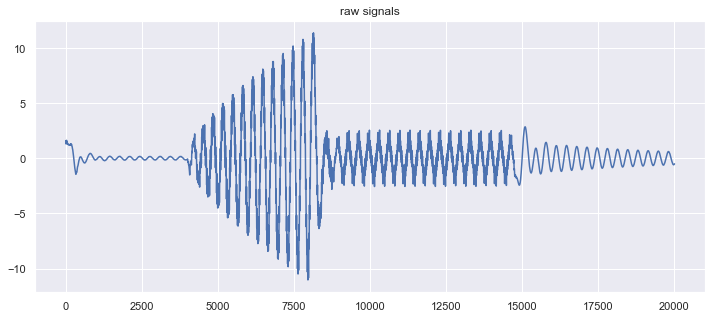

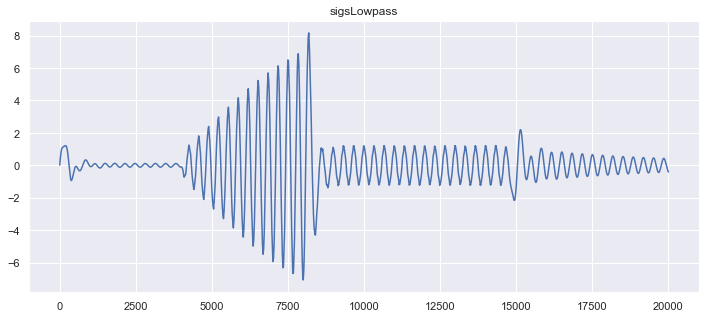

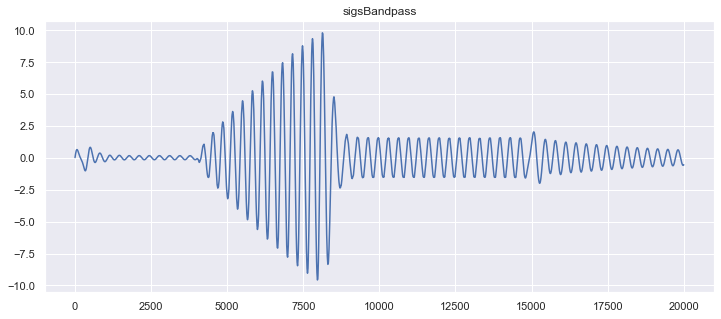

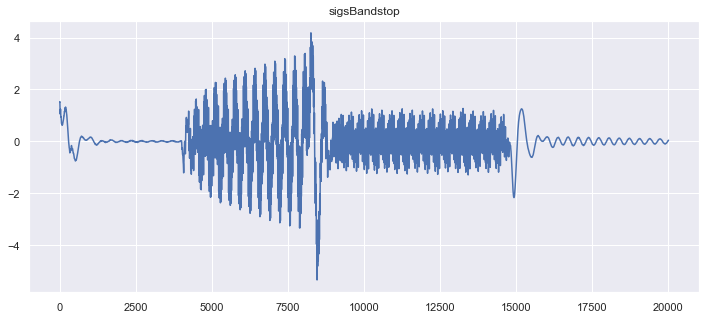

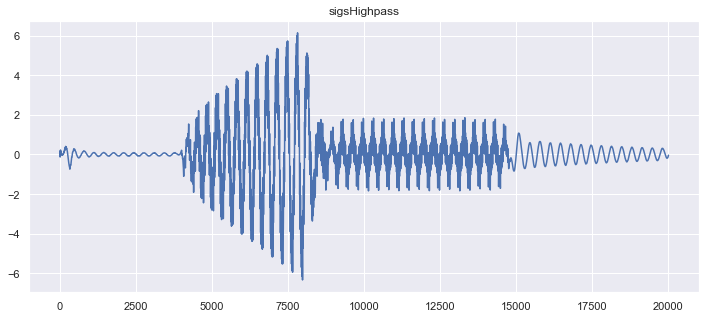

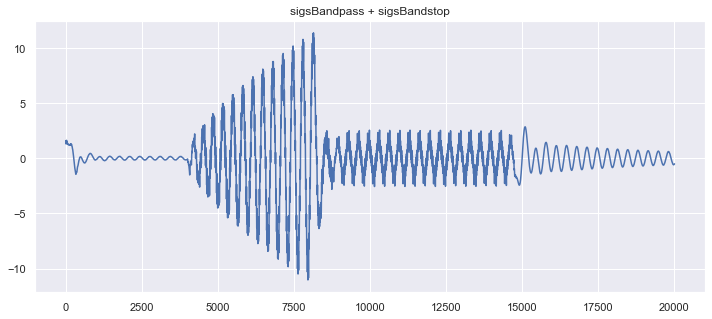

In [ ]:
import numpy as np
from scipy import signal
from scipy.signal import butter, lfilter
from numpy import array
import matplotlib.pyplot as plt
import pandas as pd

def butter_bandpass(lowcut, highcut, fs, order):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a


def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data)
    return y

def butter_bandstop_filter(data, lowcut, highcut, fs, order=5):
        nyq = 0.5 * fs
        low = lowcut / nyq
        high = highcut / nyq

        i, u = butter(order, [low, high], btype='bandstop')
        y = lfilter(i, u, data)
        return y

def butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def butter_lowpass_filter(data, cutoff, fs, order=5):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = lfilter(b, a, data)
    return y

def butter_highpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = signal.butter(order, normal_cutoff, btype='high', analog=False)
    return b, a

def butter_highpass_filter(data, cutoff, fs, order=5):
    b, a = butter_highpass(cutoff, fs, order=order)
    y = signal.filtfilt(b, a, data)
    return y


def sine_generator(fs, sinefreq, duration):
    T = duration
    nsamples = fs * T
    w = 2. * np.pi * sinefreq
    t_sine = np.linspace(0, T, nsamples, endpoint=False)
    y_sine = np.sin(w * t_sine)
    result = pd.DataFrame({ 
        'data' : y_sine} ,index=t_sine)
    return result

# # generate synthetic data
# #. Time Domain 0 to T  
# T = 100  
# fs = 1/T  
# t = np.arange(1,T+1)/T  
# freqs = 2*np.pi*(t-0.5-fs)/(fs)  
# #. center frequencies of components  
# f1 = 0.5  
# f2 = 6  
# f3 = 10  
# #. modes  
# v1 = (np.cos(2*np.pi*f1*t))  
# v2 = 1/4*(np.cos(2*np.pi*f2*t))  
# v3 = 1/16*(np.cos(2*np.pi*f3*t))  
# sigs = v1 + v2 + v3 + 0.1*np.random.randn(v1.size)
# plt.plot(v1)
# plt.plot(v2)
# plt.plot(v3)
# plt.show()


fs = 30
sine_fq = 5 #Hz
duration = 10 #seconds
sine_5Hz = sine_generator(fs,sine_fq,duration)
sine_fq = 1 #Hz
duration = 10 #seconds
sine_1Hz = sine_generator(fs,sine_fq,duration)
sine_fq = 10 #Hz
duration = 10 #seconds
sine_10Hz = sine_generator(fs,sine_fq,duration)
sine = sine_10Hz + sine_5Hz + sine_1Hz

sigs = sine.data
sigsLowpass = butter_lowpass_filter(sigs, 1, fs, order=5)
sigsBandpass = butter_bandpass_filter(sigs, 3, 7, fs, order=5)
sigsBandstop = butter_bandstop_filter(sigs, 3, 7, fs, order=5)
sigsHighpass = butter_highpass_filter(sigs, 10, fs, order=5)
sigsRecover = sigsBandpass + sigsBandstop

sigs = data
fs = 20000 # for electric waveform data, 20KHz
sigsLowpass = butter_lowpass_filter(sigs, 60, fs, order=1)
sigsBandpass = butter_bandpass_filter(sigs, 40, 80, fs, order=1)
sigsBandstop = butter_bandstop_filter(sigs, 40, 80, fs, order=1)
sigsHighpass = butter_highpass_filter(sigs, 60, fs, order=1)
sigsRecover = sigsBandpass + sigsBandstop
#sigsRecover = sigsLowpass + sigsHighpass


plt.figure(figsize=(12,5))
plt.title('raw signals')
plt.plot(sigs)
plt.show()

plt.figure(figsize=(12,5))
plt.title('sigsLowpass')
plt.plot(sigsLowpass)
plt.show()

plt.figure(figsize=(12,5))
plt.title('sigsBandpass')
plt.plot(sigsBandpass)
plt.show()

plt.figure(figsize=(12,5))
plt.title('sigsBandstop')
plt.plot(sigsBandstop)
plt.show()

plt.figure(figsize=(12,5))
plt.title('sigsHighpass')
plt.plot(sigsHighpass)
plt.show()

plt.figure(figsize=(12,5))
plt.title('sigsBandpass + sigsBandstop')
plt.plot(sigsRecover)
plt.show()

# sigsMatchFilter = np.convolve(sine_5Hz[::-1], sigs, mode='valid')
# plt.figure(figsize=(12,5))
# plt.title('sigsMatchFilter')
# plt.plot(sigsMatchFilter)
# plt.show()

# data = sigsBandpass


## FFT Denoising

In [ ]:
def denoising_using_fft(signal, threshold):
  n = 1000
  dt = 100
  fhat = np.fft.fft(signal, n) 
  psd = fhat * np.conjugate(fhat)/n
  freq = (1/(dt*n)) * np.arange(n)
  L = np.arange(1, np.floor(n/2), dtype = 'int')
  indices = psd > threshold
  pdsclean = psd * indices
  fhat= indices * fhat
  ffilt = np.fft.ifft(fhat)
  ffilt = ffilt.real
  return ffilt


## Wavelet Denoising


In any in-door place exists background noise due to constant building shaking.  This back-ground noise tends to obscure the different events we need to detect, especially the footsteps.To enhance the signal, we attempt to remove the background noise by applying a wavelet
denoising technique on the data to suppress non-stationary noises. 

In [ ]:
import numpy as np
import csv
import matplotlib.pyplot as plt
import pywt
from influxdb import InfluxDBClient
import operator
import scipy.signal as sg
import scipy as sp

def wdenoise(data, method, threshold):
    # Create wavelet object and define parameters
    w = pywt.Wavelet(method)
    maxlev = pywt.dwt_max_level(len(data), w.dec_len)
    # maxlev = 2 # Override if desired
    print("maximum level is " + str(maxlev))
    # Decompose into wavelet components, to the level selected:
    coeffs = pywt.wavedec(data, method, level=maxlev)  
    #cA = 0.0
    #cA = pywt.threshold(cA, threshold*max(cA))
    # plt.figure()
    for i in range(1, len(coeffs)):
        # plt.subplot(maxlev, 1, i)
        # plt.plot(coeffs[i])
        coeffs[i] = pywt.threshold(coeffs[i], threshold*max(coeffs[i]))
        # plt.plot(coeffs[i])
    datarec = pywt.waverec(coeffs, method)
    return datarec

## Matched Filter

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


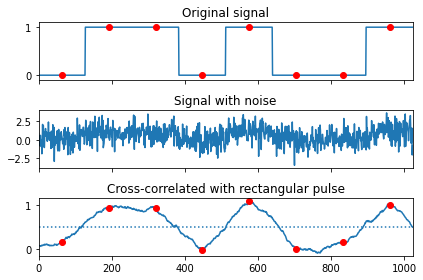

In [ ]:
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt

sig = np.repeat([0., 1., 1., 0., 1., 0., 0., 1.], 128)
sig_noise = sig + np.random.randn(len(sig))
corr = signal.correlate(sig_noise, np.ones(128), mode='same') / 128

#corr = signal.correlate(sig_noise, np.ones(128), mode='valid') / 128

clock = np.arange(64, len(sig), 128)
# print(clock)
fig, (ax_orig, ax_noise, ax_corr) = plt.subplots(3, 1, sharex=True)
ax_orig.plot(sig)
ax_orig.plot(clock, sig[clock], 'ro')
ax_orig.set_title('Original signal')
ax_noise.plot(sig_noise)
ax_noise.set_title('Signal with noise')
ax_corr.plot(corr)
ax_corr.plot(clock, corr[clock], 'ro')
ax_corr.axhline(0.5, ls=':')
ax_corr.set_title('Cross-correlated with rectangular pulse')
ax_orig.margins(0, 0.1)
fig.tight_layout()
fig.show()

### Real example with vital sign data

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/urllib3/connectionpool.py:986: InsecureRequestWarning: Unverified HTTPS request is being made to host 'sensorweb.us'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning,
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/urllib3/connectionpool.py:986: InsecureRequestWarning: Unverified HTTPS request is being made to host 'sensorweb.us'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning,


maximum level is 10
maximum level is 10
(100, 240)
0.218 --> 0.207 --> 0.202 --> 0.201 --> 0.200 --> 0.200 --> 0.200 --> 


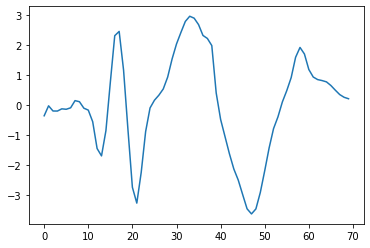

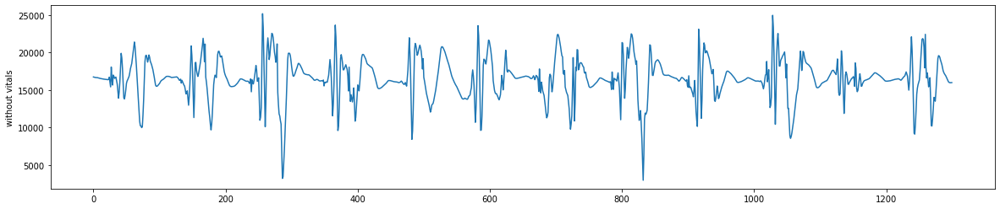

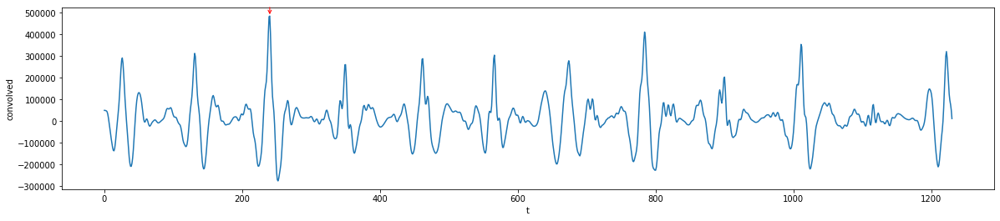

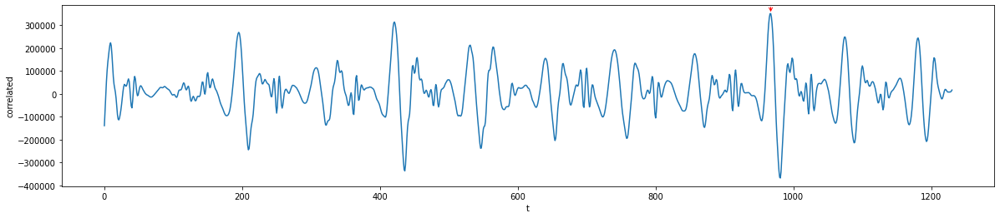

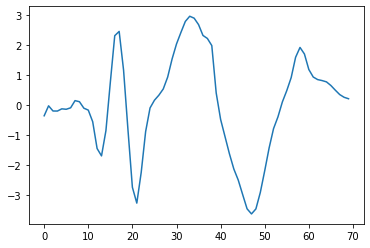

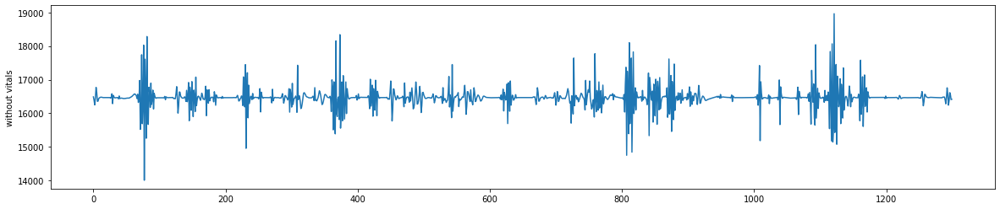

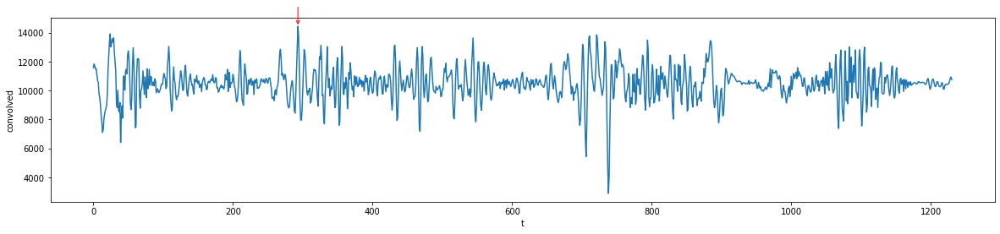

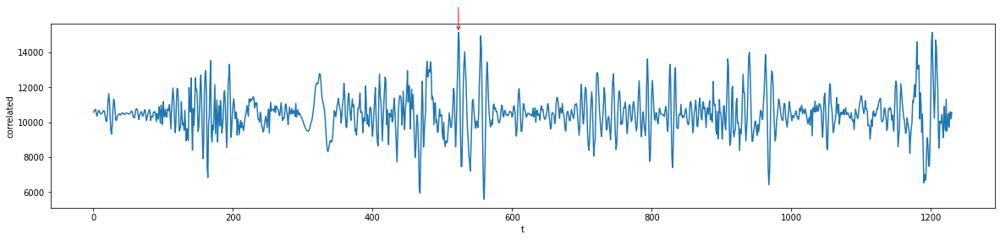

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
# !pip install pymc3
# !pip install tslearn
# import pymc3 as pymc
import math
import csv
import pywt
from influxdb import InfluxDBClient
import operator
import scipy.signal as sg
import scipy as sp
# from dic.stl_decon import decomposing
from tslearn.clustering import KShape
from tslearn.datasets import CachedDatasets
from tslearn.preprocessing import TimeSeriesScalerMeanVariance

def wdenoise(data, method, threshold):
    # Create wavelet object and define parameters
    w = pywt.Wavelet(method)
    maxlev = pywt.dwt_max_level(len(data), w.dec_len)
    # maxlev = 2 # Override if desired
    print("maximum level is " + str(maxlev))
    # Decompose into wavelet components, to the level selected:
    coeffs = pywt.wavedec(data, method, level=maxlev)
    #cA = 0.0
    #cA = pywt.threshold(cA, threshold*max(cA))
    # plt.figure()
    for i in range(1, len(coeffs)):
        # plt.subplot(maxlev, 1, i)
        # plt.plot(coeffs[i])
        coeffs[i] = pywt.threshold(coeffs[i], threshold*max(coeffs[i]))
        # plt.plot(coeffs[i])
    datarec = pywt.waverec(coeffs, method)
    return datarec

ip = "sensorweb.us"

# unit = "b8:27:eb:a1:89:49"
unit1 = "b8:27:eb:f3:41:db" #shake1 with vitals https://www.sensorweb.us:3000/d/VmjKXrXWz/bed-dashboard?orgId=1&var-mac=b8:27:eb:f3:41:db&from=1598124954752&to=1598129162971
unit2 = "b8:27:eb:ed:53:36" #shake2 without vitals https://www.sensorweb.us:3000/d/VmjKXrXWz/bed-dashboard?orgId=1&var-mac=b8:27:eb:ed:53:36&from=1598118642423&to=1598135475299
# the other one: b8:27:eb:63:da:62
stampIni = "2020-08-22T20:00:00.000Z" # UTC time = EST time + 4
stampEnd = "2020-08-22T20:02:00.000Z"
client = InfluxDBClient(ip, "8086", "test", "sensorweb", "shake", ssl=True)


# query1
query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit1+'\') and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\''
result = client.query(query)
points = list(result.get_points())
values = map(operator.itemgetter('value'), points)
times = map(operator.itemgetter('time'), points)

data1 = np.array(list(values))

# query2

query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit2+'\') and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\''
result = client.query(query)
points = list(result.get_points())
values = map(operator.itemgetter('value'), points)
times = map(operator.itemgetter('time'), points)

data2 = np.array(list(values))
fs = 100 # for vibration data

if(len(data1) == 0 or len(data2) == 0):

    print("No data in the chosen time range!")

    quit()

datarec1 = wdenoise(data1, 'sym4', 0.4)
datarec2 = wdenoise(data2, 'sym4', 0.4)

# datarec1 = data1
# datarec2 = data2

# decon = decomposing(datarec)
# exit()
#### kshape

X_train1 = np.split(datarec1, 50, axis=0)
X_train2 = np.split(datarec2, 50, axis=0)
x_train = X_train1 + X_train2
print(np.asarray(x_train).shape)
# exit()


### kshape
seed = 0
np.random.seed(seed)

np.random.shuffle(x_train)

# For this method to operate properly, prior scaling is required
x_train = TimeSeriesScalerMeanVariance().fit_transform(x_train)
sz = x_train.shape[1]

# kShape clustering
ks = KShape(n_clusters=3, verbose=True, random_state=seed)
y_pred = ks.fit_predict(x_train)


tem = ks.cluster_centers_[0].ravel()[100:170]


''' Matched Filter '''

# Applying the filter to data with vital signs
data = datarec1[500:1800]
conv = np.convolve(tem[::-1], data, mode='valid')

corr = signal.correlate(tem[::-1], data, mode='valid') 

# And then we want to know where the maximum value of this convolution is
plt.figure()
plt.plot(tem)

plt.figure(figsize=(20, 4))
plt.plot(data)
plt.ylabel("without vitals")

# plot the convolved result
filtered = conv
plt.figure(figsize=(20, 4))
plt.plot(filtered)
pos = np.argmax(filtered)

# # And have an arrow point at the maximum
plt.annotate("", xytext=(pos, 1.1*max(filtered)), xy=(pos, max(filtered)),
    arrowprops=dict(arrowstyle="->", edgecolor='red'))

plt.xlabel("t")
plt.ylabel("convolved")
plt.show()

# plot the correlated result
filtered = corr
plt.figure(figsize=(20, 4))
plt.plot(filtered)
pos = np.argmax(filtered)

# # And have an arrow point at the maximum
plt.annotate("", xytext=(pos, 1.1*max(filtered)), xy=(pos, max(filtered)),
    arrowprops=dict(arrowstyle="->", edgecolor='red'))

plt.xlabel("t")
plt.ylabel("correlated")
plt.show()


# Applying the filter to data without vital signs
data = datarec2[500:1800]
conv = np.convolve(tem[::-1], data, mode='valid')

corr = signal.correlate(tem[::-1], data, mode='valid') 

# And then we want to know where the maximum value of this convolution is
plt.figure()
plt.plot(tem)

plt.figure(figsize=(20, 4))
plt.plot(data)
plt.ylabel("without vitals")

# plot the convolved result
filtered = conv
plt.figure(figsize=(20, 4))
plt.plot(filtered)
pos = np.argmax(filtered)

# # And have an arrow point at the maximum
plt.annotate("", xytext=(pos, 1.1*max(filtered)), xy=(pos, max(filtered)),
    arrowprops=dict(arrowstyle="->", edgecolor='red'))

plt.xlabel("t")
plt.ylabel("convolved")
plt.show()

# plot the correlated result
filtered = corr
plt.figure(figsize=(20, 4))
plt.plot(filtered)
pos = np.argmax(filtered)

# # And have an arrow point at the maximum
plt.annotate("", xytext=(pos, 1.1*max(filtered)), xy=(pos, max(filtered)),
    arrowprops=dict(arrowstyle="->", edgecolor='red'))

plt.xlabel("t")
plt.ylabel("correlated")
plt.show()

##Autocorrelation

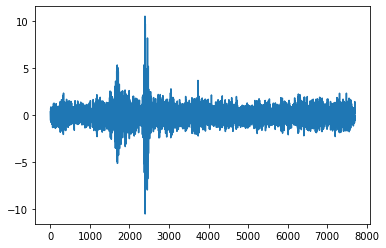

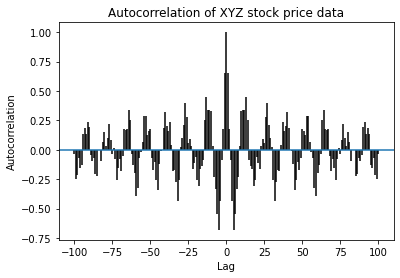

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:572: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning


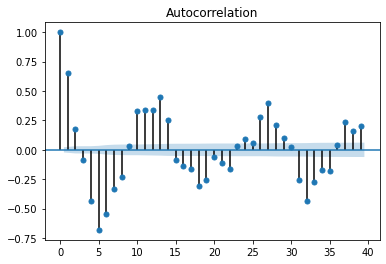

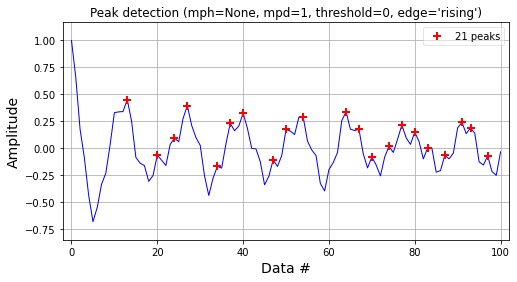

# of peaks 21


In [ ]:
import matplotlib.pyplot as plot
import numpy as np
import pandas as pd
from statsmodels.graphics.tsaplots import plot_pacf   
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import acf
from numpy import array
from scipy import stats

def detect_peaks(x, mph=None, mpd=1, threshold=0, edge='rising',
                 kpsh=False, valley=False, show=False, ax=None):

    x = np.atleast_1d(x).astype('float64')
    if x.size < 3:
        return np.array([], dtype=int)
    if valley:
        x = -x
        if mph is not None:
            mph = -mph
    # find indices of all peaks
    dx = x[1:] - x[:-1]
    # handle NaN's
    indnan = np.where(np.isnan(x))[0]
    if indnan.size:
        x[indnan] = np.inf
        dx[np.where(np.isnan(dx))[0]] = np.inf
    ine, ire, ife = np.array([[], [], []], dtype=int)
    if not edge:
        ine = np.where((np.hstack((dx, 0)) < 0) & (np.hstack((0, dx)) > 0))[0]
    else:
        if edge.lower() in ['rising', 'both']:
            ire = np.where((np.hstack((dx, 0)) <= 0) & (np.hstack((0, dx)) > 0))[0]
        if edge.lower() in ['falling', 'both']:
            ife = np.where((np.hstack((dx, 0)) < 0) & (np.hstack((0, dx)) >= 0))[0]
    ind = np.unique(np.hstack((ine, ire, ife)))
    # handle NaN's
    if ind.size and indnan.size:
        # NaN's and values close to NaN's cannot be peaks
        ind = ind[np.in1d(ind, np.unique(np.hstack((indnan, indnan-1, indnan+1))), invert=True)]
    # first and last values of x cannot be peaks
    if ind.size and ind[0] == 0:
        ind = ind[1:]
    if ind.size and ind[-1] == x.size-1:
        ind = ind[:-1]
    # remove peaks < minimum peak height
    if ind.size and mph is not None:
        ind = ind[x[ind] >= mph]
    # remove peaks - neighbors < threshold
    if ind.size and threshold > 0:
        dx = np.min(np.vstack([x[ind]-x[ind-1], x[ind]-x[ind+1]]), axis=0)
        ind = np.delete(ind, np.where(dx < threshold)[0])
    # detect small peaks closer than minimum peak distance
    if ind.size and mpd > 1:
        ind = ind[np.argsort(x[ind])][::-1]  # sort ind by peak height
        idel = np.zeros(ind.size, dtype=bool)
        for i in range(ind.size):
            if not idel[i]:
                # keep peaks with the same height if kpsh is True
                idel = idel | (ind >= ind[i] - mpd) & (ind <= ind[i] + mpd) \
                    & (x[ind[i]] > x[ind] if kpsh else True)
                idel[i] = 0  # Keep current peak
        # remove the small peaks and sort back the indices by their occurrence
        ind = np.sort(ind[~idel])

    if show:
        if indnan.size:
            x[indnan] = np.nan
        if valley:
            x = -x
            if mph is not None:
                mph = -mph
        plot_peaks(x, mph, mpd, threshold, edge, valley, ax, ind)

    return ind

def plot_peaks(x, mph, mpd, threshold, edge, valley, ax, ind):
        """Plot results of the detect_peaks function, see its help."""
#    else:
        if ax is None:
            _, ax = plt.subplots(1, 1, figsize=(8, 4))

        ax.plot(x, 'b', lw=1)
        if ind.size:
            label = 'valley' if valley else 'peak'
            label = label + 's' if ind.size > 1 else label
            ax.plot(ind, x[ind], '+', mfc=None, mec='r', mew=2, ms=8,
                    label='%d %s' % (ind.size, label))
            ax.legend(loc='best', framealpha=.5, numpoints=1)
        ax.set_xlim(-.02*x.size, x.size*1.02-1)
        ymin, ymax = x[np.isfinite(x)].min(), x[np.isfinite(x)].max()
        yrange = ymax - ymin if ymax > ymin else 1
        ax.set_ylim(ymin - 0.1*yrange, ymax + 0.1*yrange)
        ax.set_xlabel('Data #', fontsize=14)
        ax.set_ylabel('Amplitude', fontsize=14)
        mode = 'Valley detection' if valley else 'Peak detection'
        ax.set_title("%s (mph=%s, mpd=%d, threshold=%s, edge='%s')"
                     % (mode, str(mph), mpd, str(threshold), edge))
        plt.grid()
        plt.show()

# Time series data

# data = np.array([24.40,10.25,20.05,22.00,16.90,7.80,15.00,22.80,34.90,13.30])
# Plot autocorrelation
def sine_generator(fs, sinefreq, duration):
    T = duration
    nsamples = fs * T
    w = 2. * np.pi * sinefreq
    t_sine = np.linspace(0, T, nsamples, endpoint=False)
    y_sine = np.sin(w * t_sine)
    result = pd.DataFrame({ 
        'data' : y_sine} ,index=t_sine)
    return result

# data = sine_generator(100, 10, 5).data #+ sine_generator(100, 5, 5).data 
# data = sine_generator(100, 5, 30).data

data = stats.zscore(data)

plot.plot(data)
plot.show()

plot.acorr(data, maxlags=100)
# Add labels to autocorrelation plot
plot.title('Autocorrelation of XYZ stock price data')
plot.xlabel('Lag')
plot.ylabel('Autocorrelation')
# Display the autocorrelation plot
plot.show()

plot_acf(data) #autocorrelation plot
# plot_pacf(data)


arrSignal = array(data)
auto = acf(arrSignal, unbiased=False, nlags=100, qstat=False, fft=None)

peaks = detect_peaks(auto, show=True)
correpk = len(peaks)
print("# of peaks", correpk)


*italicized text*## Singular Spectrum Analysis (SSA)

Source: https://pyts.readthedocs.io/en/stable/auto_examples/decomposition/plot_ssa.html

Lecture: https://www.kaggle.com/jdarcy/introducing-ssa-for-time-series-decomposition

Signals such as time series can be seen as a sum of different signals such as trends and noise. Decomposing time series into several time series can be useful in order to keep the most important information. One decomposition algorithm is Singular Spectrum Analysis. This example illustrates the decomposition of a time series into several subseries using this algorithm and visualizes the different subseries extracted. It is implemented as pyts.decomposition.SingularSpectrumAnalysis.


Singular spectrum analysis (SSA) is a technique of time series analysis and forecasting \cite{broomhead1986extracting}. It combines elements of classical time series analysis, multivariate statistics, multivariate geometry, dynamical systems and signal processing. SSA aims at decomposing the original series into a sum of a small number of interpretable components such as a slowly varying trend, oscillatory components and a ‘structureless’ noise. It is based on the singular-value decomposition of a specific matrix constructed upon time series. Neither a parametric model nor stationarity-type conditions have to be assumed for the time series; this makes SSA a model-free technique. Nowadays SSA is becoming more and more popular, especially in applications. SSA has proved to be very successful, and has already become a standard tool in the analysis of climatic, meteorological and geophysical time series~\cite{vatuard1992singular,allen1996monte}.

In time series analysis, singular spectrum analysis (SSA) is a nonparametric spectral estimation method. It combines elements of classical time series analysis, multivariate statistics, multivariate geometry, dynamical systems and signal processing. The name "singular spectrum analysis" relates to the spectrum of eigenvalues in a singular value decomposition of a covariance matrix, and not directly to a frequency domain decomposition.


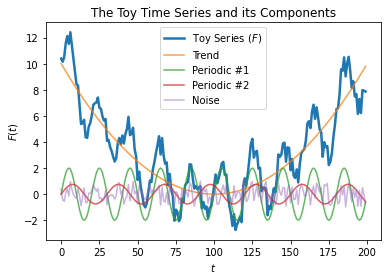

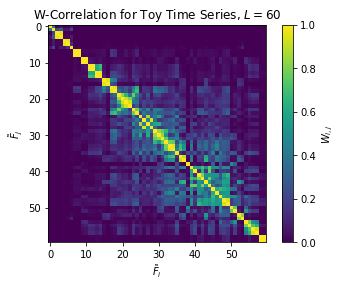

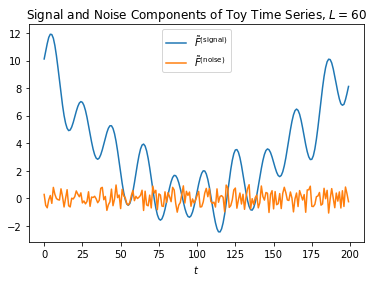

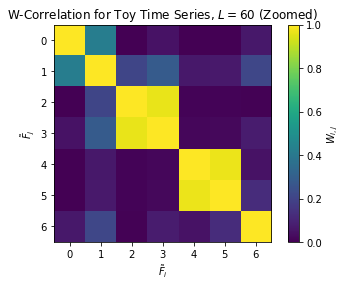

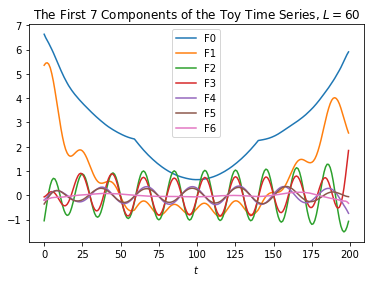

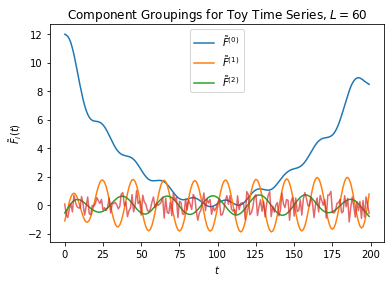

In [ ]:
# Cite from https://www.kaggle.com/jdarcy/introducing-ssa-for-time-series-decomposition
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from pyts.decomposition import SingularSpectrumAnalysis

class SSA(object):
    
    __supported_types = (pd.Series, np.ndarray, list)
    
    def __init__(self, tseries, L, save_mem=True):
        """
        Decomposes the given time series with a singular-spectrum analysis. Assumes the values of the time series are
        recorded at equal intervals.
        
        Parameters
        ----------
        tseries : The original time series, in the form of a Pandas Series, NumPy array or list. 
        L : The window length. Must be an integer 2 <= L <= N/2, where N is the length of the time series.
        save_mem : Conserve memory by not retaining the elementary matrices. Recommended for long time series with
            thousands of values. Defaults to True.
        
        Note: Even if an NumPy array or list is used for the initial time series, all time series returned will be
        in the form of a Pandas Series or DataFrame object.
        """
        
        # Tedious type-checking for the initial time series
        if not isinstance(tseries, self.__supported_types):
            raise TypeError("Unsupported time series object. Try Pandas Series, NumPy array or list.")
        
        # Checks to save us from ourselves
        self.N = len(tseries)
        if not 2 <= L <= self.N/2:
            raise ValueError("The window length must be in the interval [2, N/2].")
        
        self.L = L
        self.orig_TS = pd.Series(tseries)
        self.K = self.N - self.L + 1
        
        # Embed the time series in a trajectory matrix
        self.X = np.array([self.orig_TS.values[i:L+i] for i in range(0, self.K)]).T
        
        # Decompose the trajectory matrix
        self.U, self.Sigma, VT = np.linalg.svd(self.X)
        self.d = np.linalg.matrix_rank(self.X)
        
        self.TS_comps = np.zeros((self.N, self.d))
        
        if not save_mem:
            # Construct and save all the elementary matrices
            self.X_elem = np.array([ self.Sigma[i]*np.outer(self.U[:,i], VT[i,:]) for i in range(self.d) ])

            # Diagonally average the elementary matrices, store them as columns in array.           
            for i in range(self.d):
                X_rev = self.X_elem[i, ::-1]
                self.TS_comps[:,i] = [X_rev.diagonal(j).mean() for j in range(-X_rev.shape[0]+1, X_rev.shape[1])]
            
            self.V = VT.T
        else:
            # Reconstruct the elementary matrices without storing them
            for i in range(self.d):
                X_elem = self.Sigma[i]*np.outer(self.U[:,i], VT[i,:])
                X_rev = X_elem[::-1]
                self.TS_comps[:,i] = [X_rev.diagonal(j).mean() for j in range(-X_rev.shape[0]+1, X_rev.shape[1])]
            
            self.X_elem = "Re-run with save_mem=False to retain the elementary matrices."
            
            # The V array may also be very large under these circumstances, so we won't keep it.
            self.V = "Re-run with save_mem=False to retain the V matrix."
        
        # Calculate the w-correlation matrix.
        self.calc_wcorr()
            
    def components_to_df(self, n=0):
        """
        Returns all the time series components in a single Pandas DataFrame object.
        """
        if n > 0:
            n = min(n, self.d)
        else:
            n = self.d
        
        # Create list of columns - call them F0, F1, F2, ...
        cols = ["F{}".format(i) for i in range(n)]
        return pd.DataFrame(self.TS_comps[:, :n], columns=cols, index=self.orig_TS.index)
            
    
    def reconstruct(self, indices):
        """
        Reconstructs the time series from its elementary components, using the given indices. Returns a Pandas Series
        object with the reconstructed time series.
        
        Parameters
        ----------
        indices: An integer, list of integers or slice(n,m) object, representing the elementary components to sum.
        """
        if isinstance(indices, int): indices = [indices]
        
        ts_vals = self.TS_comps[:,indices].sum(axis=1)
        return pd.Series(ts_vals, index=self.orig_TS.index)
    
    def calc_wcorr(self):
        """
        Calculates the w-correlation matrix for the time series.
        """
             
        # Calculate the weights
        w = np.array(list(np.arange(self.L)+1) + [self.L]*(self.K-self.L-1) + list(np.arange(self.L)+1)[::-1])
        
        def w_inner(F_i, F_j):
            return w.dot(F_i*F_j)
        
        # Calculated weighted norms, ||F_i||_w, then invert.
        F_wnorms = np.array([w_inner(self.TS_comps[:,i], self.TS_comps[:,i]) for i in range(self.d)])
        F_wnorms = F_wnorms**-0.5
        
        # Calculate Wcorr.
        self.Wcorr = np.identity(self.d)
        for i in range(self.d):
            for j in range(i+1,self.d):
                self.Wcorr[i,j] = abs(w_inner(self.TS_comps[:,i], self.TS_comps[:,j]) * F_wnorms[i] * F_wnorms[j])
                self.Wcorr[j,i] = self.Wcorr[i,j]
    
    def plot_wcorr(self, min=None, max=None):
        """
        Plots the w-correlation matrix for the decomposed time series.
        """
        if min is None:
            min = 0
        if max is None:
            max = self.d
        
        if self.Wcorr is None:
            self.calc_wcorr()
        
        ax = plt.imshow(self.Wcorr)
        plt.xlabel(r"$\tilde{F}_i$")
        plt.ylabel(r"$\tilde{F}_j$")
        plt.colorbar(ax.colorbar, fraction=0.045)
        ax.colorbar.set_label("$W_{i,j}$")
        plt.clim(0,1)
        
        # For plotting purposes:
        if max == self.d:
            max_rnge = self.d-1
        else:
            max_rnge = max
        
        plt.xlim(min-0.5, max_rnge+0.5)
        plt.ylim(max_rnge+0.5, min-0.5)
      
N = 200 # The number of time 'moments' in our toy series
t = np.arange(0,N)
trend = 0.001 * (t - 100)**2
p1, p2 = 20, 30
periodic1 = 2 * np.sin(2*np.pi*t/p1)
periodic2 = 0.75 * np.sin(2*np.pi*t/p2)

np.random.seed(123) # So we generate the same noisy time series every time.
noise = 2 * (np.random.rand(N) - 0.5)
F = trend + periodic1 + periodic2 + noise

# Plot everything
plt.plot(t, F, lw=2.5)
plt.plot(t, trend, alpha=0.75)
plt.plot(t, periodic1, alpha=0.75)
plt.plot(t, periodic2, alpha=0.75)
plt.plot(t, noise, alpha=0.5)
plt.legend(["Toy Series ($F$)", "Trend", "Periodic #1", "Periodic #2", "Noise"])
plt.xlabel("$t$")
plt.ylabel("$F(t)$")
plt.title("The Toy Time Series and its Components");
plt.show()

# F_ssa_L5 = SSA(F, 5)
# F_ssa_L5.components_to_df().plot()
# F_ssa_L5.orig_TS.plot(alpha=0.4)
# plt.xlabel("$t$")
# plt.ylabel(r"$\tilde{F}_i(t)$")
# plt.title(r"$L=5$ for the Toy Time Series");
# plt.show()

# # use real data
# F = data[0:200]
# # N = len(data)
# # t = np.arange(0,N)
# plt.plot(F)
# plt.show()

F_ssa_L60 = SSA(F, 60)
F_ssa_L60.plot_wcorr()
plt.title("W-Correlation for Toy Time Series, $L=60$");
plt.show()

F_ssa_L60.reconstruct(slice(0,7)).plot()
F_ssa_L60.reconstruct(slice(7,60)).plot()
plt.legend([r"$\tilde{F}^{\mathrm{(signal)}}$", r"$\tilde{F}^{\mathrm{(noise)}}$"])
plt.title("Signal and Noise Components of Toy Time Series, $L = 60$")
plt.xlabel(r"$t$");
plt.show()
F_ssa_L60.plot_wcorr(max=6)
plt.title("W-Correlation for Toy Time Series, $L=60$ (Zoomed)");
plt.show()

F_ssa_L60.components_to_df(n=7).plot()
plt.title(r"The First 7 Components of the Toy Time Series, $L=60$")
plt.xlabel(r"$t$");
plt.show()


F_ssa_L60.reconstruct([0,1]).plot()
F_ssa_L60.reconstruct([2,3]).plot()
F_ssa_L60.reconstruct([4,5]).plot()
F_ssa_L60.reconstruct(slice(6,60)).plot(alpha=0.7)
plt.title("Component Groupings for Toy Time Series, $L=60$")
plt.xlabel("$t$")
plt.ylabel(r"$\tilde{F}_i(t)$")
plt.legend([r"$\tilde{{F}}^{{({0})}}$".format(i) for i in range(3)]);

In [ ]:
F = stats.zscore(data[1800:2000])
# N = len(data)
# t = np.arange(0,N)
plt.plot(F)
plt.show()

F_ssa_L60 = SSA(F, 60)
F_ssa_L60.plot_wcorr()
plt.title("W-Correlation for Toy Time Series, $L=60$");
plt.show()

F_ssa_L60.reconstruct(slice(0,7)).plot()
F_ssa_L60.reconstruct(slice(7,60)).plot()
plt.legend([r"$\tilde{F}^{\mathrm{(signal)}}$", r"$\tilde{F}^{\mathrm{(noise)}}$"])
plt.title("Signal and Noise Components of Toy Time Series, $L = 60$")
plt.xlabel(r"$t$");
plt.show()
F_ssa_L60.plot_wcorr(max=6)
plt.title("W-Correlation for Toy Time Series, $L=60$ (Zoomed)");
plt.show()

# F_ssa_L60.components_to_df(n=7).plot()
# plt.title(r"The First 7 Components of the Toy Time Series, $L=60$")
# plt.xlabel(r"$t$");
# plt.show()


F_ssa_L60.reconstruct([0,1]).plot()
F_ssa_L60.reconstruct([2,3]).plot()
F_ssa_L60.reconstruct([4,6]).plot()
# F_ssa_L60.reconstruct([5,6]).plot()
# F_ssa_L60.reconstruct([5,6]).plot()
F_ssa_L60.reconstruct(slice(7,60)).plot(alpha=0.7)
plt.title("Component Groupings for Toy Time Series, $L=60$")
plt.xlabel("$t$")
plt.ylabel(r"$\tilde{F}_i(t)$")
plt.legend([r"$\tilde{{F}}^{{({0})}}$".format(i) for i in range(4)]);

NameError: ignored

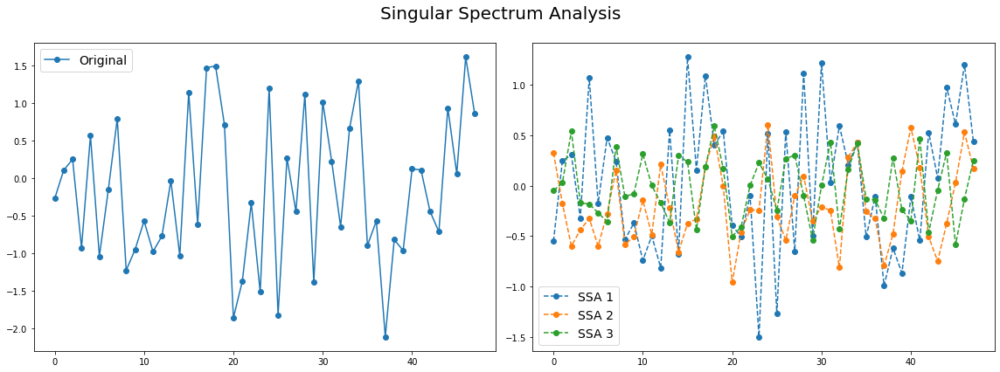

In [ ]:
# Author: Johann Faouzi <johann.faouzi@gmail.com>
# License: BSD-3-Clause

import numpy as np
import matplotlib.pyplot as plt
from pyts.decomposition import SingularSpectrumAnalysis

# Parameters
n_samples, n_timestamps = 100, 48

# Toy dataset
rng = np.random.RandomState(41)
X = rng.randn(n_samples, n_timestamps)

# print(X)
# X = array(data)

# We decompose the time series into three subseries
window_size = 15
groups = [np.arange(i, i + 5) for i in range(0, 11, 5)]

# Singular Spectrum Analysis
ssa = SingularSpectrumAnalysis(window_size=15, groups=groups)
X_ssa = ssa.fit_transform(X)

# Show the results for the first time series and its subseries
plt.figure(figsize=(16, 6))

ax1 = plt.subplot(121)
ax1.plot(X[0], 'o-', label='Original')
ax1.legend(loc='best', fontsize=14)

ax2 = plt.subplot(122)
for i in range(len(groups)):
    ax2.plot(X_ssa[0, i], 'o--', label='SSA {0}'.format(i + 1))
ax2.legend(loc='best', fontsize=14)

plt.suptitle('Singular Spectrum Analysis', fontsize=20)

plt.tight_layout()
plt.subplots_adjust(top=0.88)
plt.show()

# The first subseries consists of the trend of the original time series.
# The second and third subseries consist of noise.

#### Multivariate Singular Spectrum Analysis (MSSA)

The pymssa package implements Multivariate Singular Spectrum Analysis in python. As of the time of this writing, I am not aware of any other implementation in python of multivariate SSA, though there are packages and implementations of univariate SSA. R on the other hand has the extremely comprehensive Rssa package for performing MSSA and its variants. See details at https://github.com/kieferk/pymssa

In [ ]:
https://github.com/kieferk/pymssa

## Principal Component Analysis (PCA)

https://jakevdp.github.io/PythonDataScienceHandbook/05.09-principal-component-analysis.html

Dimensionality Reduction using PCA on multivariate timeseries data:
https://medium.com/@ansjin/dimensionality-reduction-using-pca-on-multivariate-timeseries-data-b5cc07238dc4

Principal Components Analysis of a set of stocks price data
http://slendermeans.org/ml4h-ch8.html

SSA (Singular Spectrum Analysis) versus PCA (Principal Component Analysis)

http://karthur.org/2017/learning-for-time-series-ssa-vs-pca.html
You should immediately notice one similarity between PCA and SSA. They both can be computed through either a spectral decomposition of a covariance matrix or through an SVD of the data matrix, taking careful note that the data matrix in SSA is the trajectory matrix for a single time series record.

Elsner and Tsonis (1996) claim that aside from the difference between the composition of X, i.e., between the trajectory matrix (containing lagged windows of a univariate time series) in SSA and the data matrix of PCA (containing multivariate time series records), "there is no difference between the expansion [of the data set] used in classical PCA and the expansion [of the data set] in SSA." More specifically, PCA can be defined as the spectral decomposition of the covariance matrix XTX whereas SSA can be defined as the spectral decomposition of the (normalized) lagged-covariance matrix, which is also designated XTX; however, in PCA, X is the data matrix while in SSA X is the trajectory matrix.

The difference between the structure of the matrix X in PCA versus SSA is precisely what contributes to their different behaviors.

In **PCA**, the matrix consists of a single variable observed at multiple locations (a multivariate time series dataset, where the variables are different spatial locations) and the resuling components are termed **spatial principal components** [3]. In SSA, the matrix consists of a single time series (a single variable observed in a single location) "observed" at different time windows; the resulting components derived through **SSA could be termed temporal principal components**.

In the digital signal processing community, PCA (as a spectral decomposition of the correlation, not covariance, matrix) is also known as Karhunen–Loève (K-L) expansion.

In [ ]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
from sklearn.decomposition import PCA
from sklearn.datasets import load_digits
digits = load_digits()
digits.data.shape

pca = PCA(2)  # project from 64 to 2 dimensions
projected = pca.fit_transform(digits.data)
print(digits.data.shape)
print(projected.shape)

plt.scatter(projected[:, 0], projected[:, 1],
            c=digits.target, edgecolor='none', alpha=0.5,
            cmap=plt.cm.get_cmap('spectral', 10))
plt.xlabel('component 1')
plt.ylabel('component 2')
plt.colorbar();

(1797, 64)
(1797, 2)


ValueError: ignored

## Seasonality Decomposition

Code from Jason Brownlee



###Additive Decomposition

We can create a time series comprised of a linearly increasing trend from 1 to 99 and some random noise and decompose it as an additive model.

Because the time series was contrived and was provided as an array of numbers, we must specify the frequency of the observations (the freq=1 argument). If a Pandas Series object is provided, this argument is not required.

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning: the 'freq'' keyword is deprecated, use 'period' instead
  


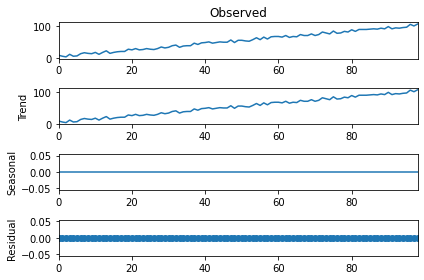

In [ ]:

from random import randrange
from pandas import Series
from matplotlib import pyplot
from statsmodels.tsa.seasonal import seasonal_decompose
series = [i+randrange(10) for i in range(1,100)]
result = seasonal_decompose(series, model='additive', freq=1)
result.plot()
pyplot.show()


###Multiplicative Decomposition
We can contrive a quadratic time series as a square of the time step from 1 to 99, and then decompose it assuming a multiplicative model.

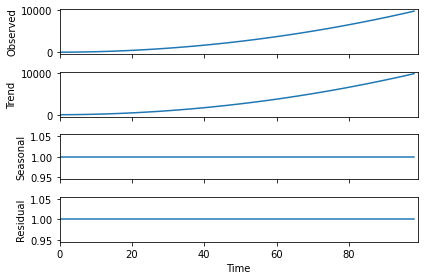

In [ ]:

from pandas import Series
from matplotlib import pyplot
from statsmodels.tsa.seasonal import seasonal_decompose
series = [i**2.0 for i in range(1,100)]
result = seasonal_decompose(series, model='multiplicative', freq=1)
result.plot()
pyplot.show()

## Discrete Wavelet Transform:

In numerical analysis and functional analysis, a discrete wavelet transform (DWT) is any wavelet transform for which the wavelets are discretely sampled. As with other wavelet transforms, a key advantage it has over Fourier transforms is temporal resolution: it captures both frequency and location information (location in time).

Pros:

The DWT is good for analysis of systems due to the simple mapping of convolution sums in time to multiplication in frequency. Other types of DWT are used because they allow nice analysis of signals which are compact neither in time or frequency.

It has good result in non-linear system.

Cons:

The calculation is more complex than FFT.

It intruduce the infoamation of the wavelet. Hence it cannot repersent the original shape of the signal as good as other transforming method.



pthon: https://pywavelets.readthedocs.io/en/latest/

matlab: https://www.mathworks.com/help/wavelet/ref/wavedec.html

Discrete Wavelet Transform - Visualizing Relation between Decomposed Detail Coefficients and Signal:
https://dsp.stackexchange.com/questions/47437/discrete-wavelet-transform-visualizing-relation-between-decomposed-detail-coef

A guide for using the Wavelet Transform in Machine Learning
http://ataspinar.com/2018/12/21/a-guide-for-using-the-wavelet-transform-in-machine-learning/

B. N. Singh et al., “Optimal selection of wavelet basis function applied to ECG signal denoising,” Digital Signal Process., vol. 16, no. 3, pp. 275–287, 2006

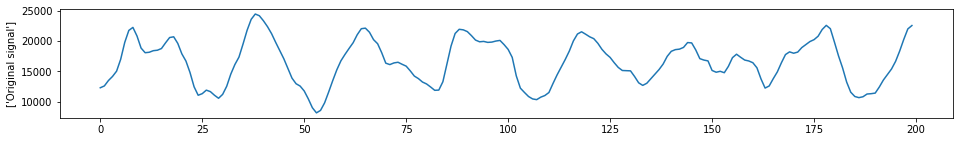

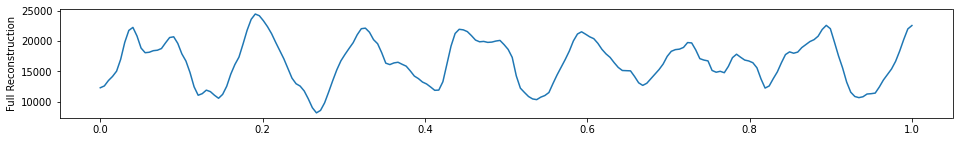

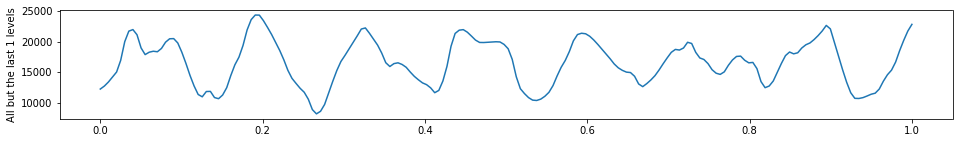

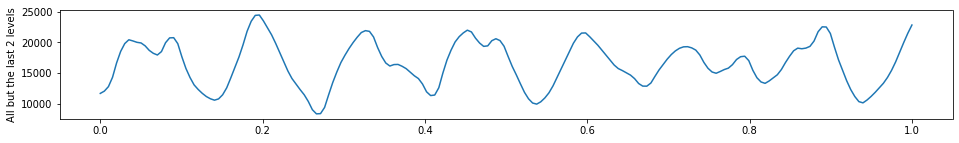

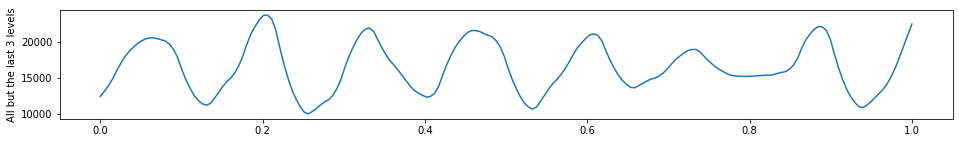

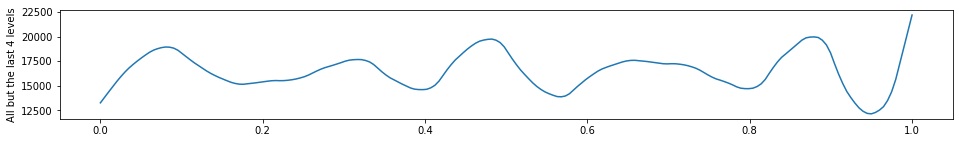

ValueError: ignored

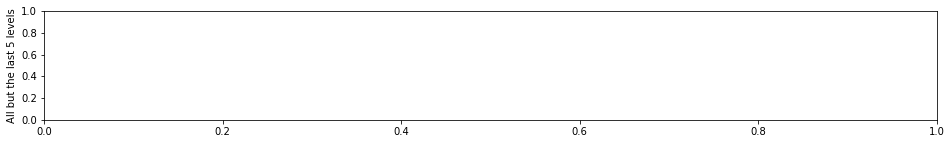

In [ ]:
# cite from Discrete Wavelet Transform - Visualizing Relation between Decomposed Detail Coefficients and Signal: 
# https://dsp.stackexchange.com/questions/47437/discrete-wavelet-transform-visualizing-relation-between-decomposed-detail-coef
import pywt
import pywt.data
import numpy as np
import matplotlib.pyplot as plt

def reconstruction_plot(yyy, **kwargs):
    """Plot signal vector on x [0,1] independently of amount of values it contains."""
    plt.plot(np.linspace(0, 1, len(yyy)), yyy, **kwargs)

# x = pywt.data.ecg()
x = data[0:200]

plt.figure(figsize=(16,2))
plt.plot(x)
plt.ylabel(['Original signal'])
plt.show()

w = pywt.Wavelet('sym5')
# plt.plot(w.dec_lo)

level = 8
coeffs = pywt.wavedec(x, w, level)

# print(coeffs)

#plt.subplot(n,1,1)

plt.figure(figsize=(16,2))
plt.ylabel('Full Reconstruction')
reconstruction_plot(pywt.waverec(coeffs, w)) # full reconstruction 
plt.show()

for i in range(1,level-1):
  plt.figure(figsize=(16,2))
  plt.ylabel('All but the last %i levels'%(i))
  # print(coeffs[:-i])
  reconstruction_plot(pywt.waverec(coeffs[:-i] + [None] * i, w)) # leaving out detail coefficients up to lvl level-i
  plt.show()


/usr/local/lib/python3.6/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning: Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning)


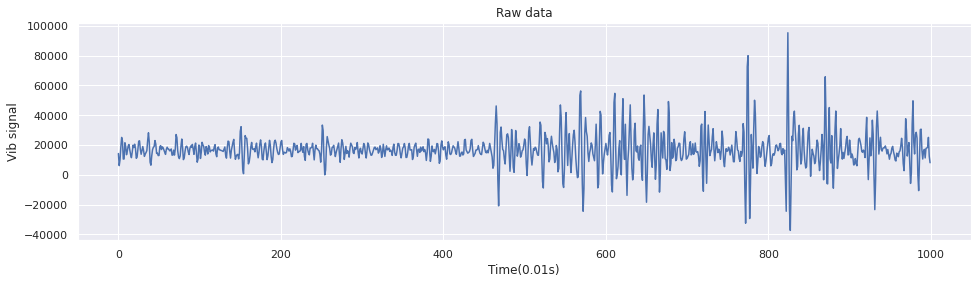

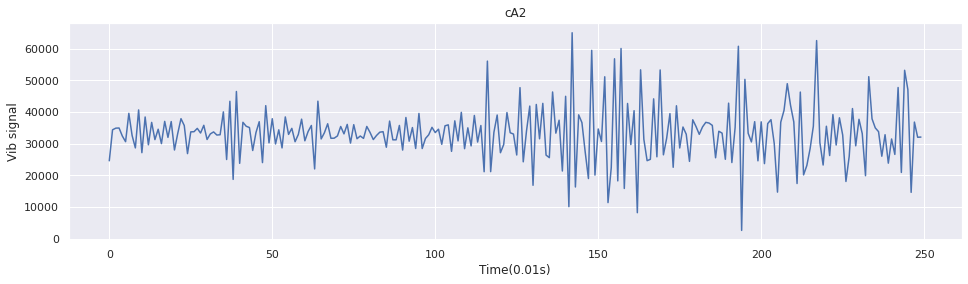

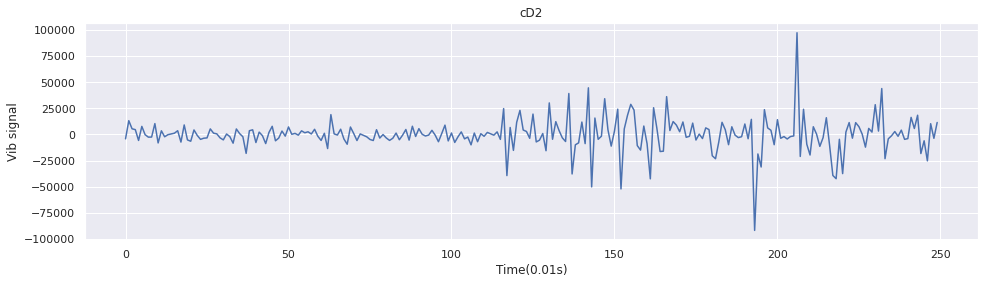

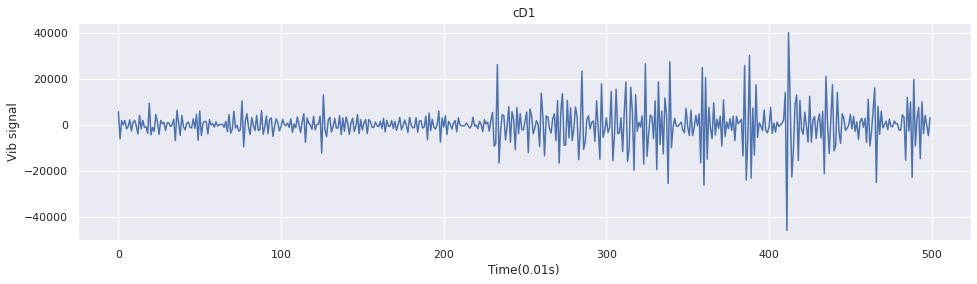

In [ ]:
import pywt
import numpy as np
import pandas as pd
import csv
import matplotlib.pyplot as plt
import pywt
from influxdb import InfluxDBClient
import operator
import scipy.signal as sg
import scipy as sp

def wdenoise(data, method, threshold):
    # Create wavelet object and define parameters
    w = pywt.Wavelet(method)
    maxlev = pywt.dwt_max_level(len(data), w.dec_len)
    # maxlev = 2 # Override if desired
    print("maximum level is " + str(maxlev))
    # Decompose into wavelet components, to the level selected:
    coeffs = pywt.wavedec(data, method, level=maxlev)  
    #cA = 0.0
    #cA = pywt.threshold(cA, threshold*max(cA))
    # plt.figure()
    for i in range(1, len(coeffs)):
        # plt.subplot(maxlev, 1, i)
        # plt.plot(coeffs[i])
        coeffs[i] = pywt.threshold(coeffs[i], threshold*max(coeffs[i]))
        # plt.plot(coeffs[i])
    datarec = pywt.waverec(coeffs, method)
    return datarec

ip = "sensorweb.us" 
unit = "b8:27:eb:48:68:fa" # FloorB
stampIni = "2020-08-22T00:41:41.000Z" # UTC time = EST time + 4
stampEnd = "2020-08-22T00:46:40.000Z"
client = InfluxDBClient(ip, "8086", "sili", "sensorweb", "floorseis",   True)
# Check FloorB at http://3.136.84.223:3000/d/3HdIpxGMz/s-house-dashboard-raw-data-only?orgId=1&from=1594149493945&to=1594149503005

query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\')  and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\'   '
result = client.query(query)
points = list(result.get_points())
values =  map(operator.itemgetter('value'), points)
times  =  map(operator.itemgetter('time'),  points)
data = np.array(list(values))
if(len(data) == 0):
  print("No data in the chosen time range!")
  quit()
coeffs = pywt.wavedec(data[1000:2000], 'db1', level=2)
cA2, cD2, cD1 = coeffs

plt.figure(figsize=(16, 4))
plt.xlabel('Time(0.01s)')
plt.ylabel('Vib signal')
plt.title("Raw data")
plt.plot(data[1000:2000]) # [mintime:maxtime-1])
plt.show()

plt.figure(figsize=(16, 4))
plt.xlabel('Time(0.01s)')
plt.ylabel('Vib signal')
plt.title("cA2")
plt.plot(cA2) # [mintime:maxtime-1])
plt.show()
plt.figure(figsize=(16, 4))
plt.xlabel('Time(0.01s)')
plt.ylabel('Vib signal')
plt.title("cD2")
plt.plot(cD2) # [mintime:maxtime-1])
plt.show()

plt.figure(figsize=(16, 4))
plt.xlabel('Time(0.01s)')
plt.ylabel('Vib signal')
plt.title("cD1")
plt.plot(cD1) # [mintime:maxtime-1])
plt.show()

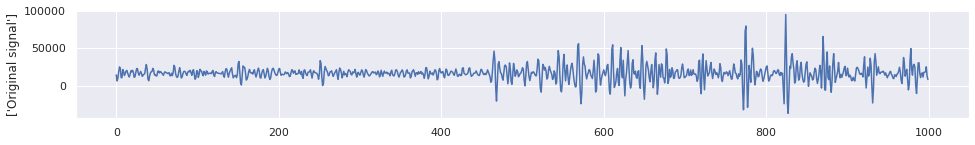

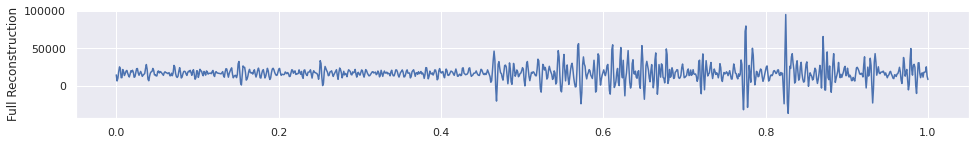

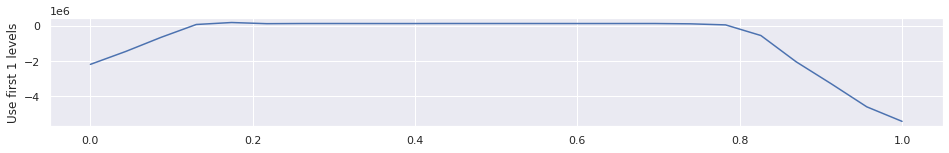

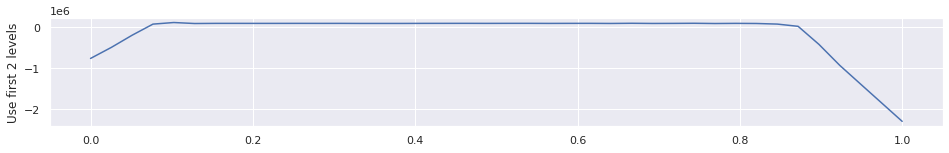

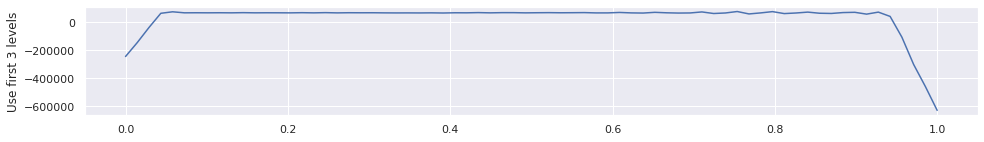

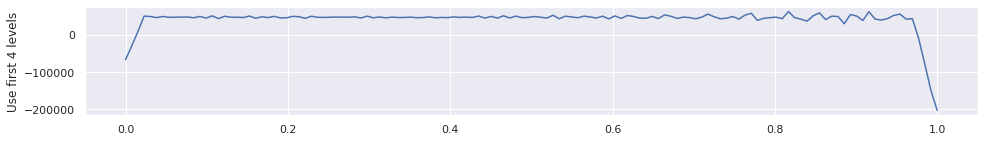

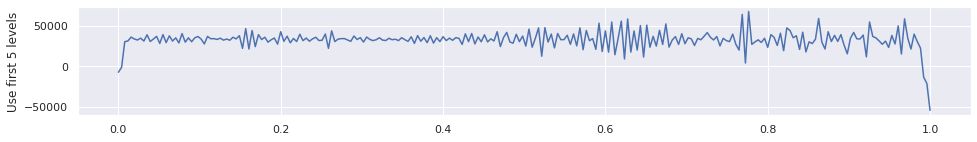

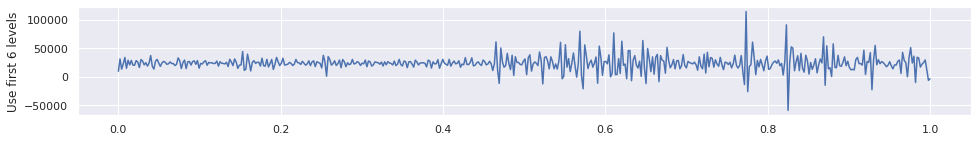

In [ ]:
import pywt
import pywt.data
import numpy as np
import matplotlib.pyplot as plt

def reconstruction_plot(yyy, **kwargs):
    """Plot signal vector on x [0,1] independently of amount of values it contains."""
    plt.plot(np.linspace(0, 1, len(yyy)), yyy, **kwargs)

x = data[1000:2000]
# x = data

plt.figure(figsize=(16,2))
plt.plot(x)
plt.ylabel(['Original signal'])
plt.show()

w = pywt.Wavelet('sym5')
# plt.plot(w.dec_lo)

level = 8
coeffs = pywt.wavedec(x, w, level)

# print(coeffs)

#plt.subplot(n,1,1)

plt.figure(figsize=(16,2))
plt.ylabel('Full Reconstruction')
reconstruction_plot(pywt.waverec(coeffs, w)) # full reconstruction 
plt.show()

for i in range(1,level-1):
  plt.figure(figsize=(16,2))
  plt.ylabel('Use first %i levels'%(i))
  # print(coeffs[:-i])
  #reconstruction_plot(pywt.waverec(coeffs[:-i] + [None] * i, w)) # leaving out detail coefficients up to lvl level-i
  reconstruction_plot(pywt.waverec(coeffs[0:i], w))
  plt.show()

Discrete Wavelet Transform: The DWT as a filter-bank

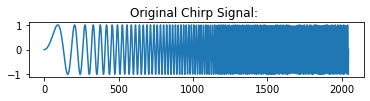

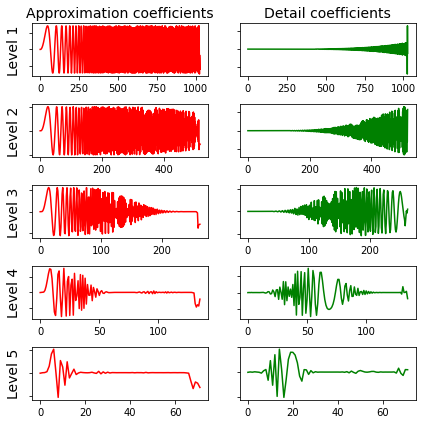

In [ ]:
# Cite from A guide for using the Wavelet Transform in Machine Learning
# http://ataspinar.com/2018/12/21/a-guide-for-using-the-wavelet-transform-in-machine-learning/

import pywt
import numpy as np
# # Define signal

x = np.linspace(0, 1, num=2048)
signal = np.sin(250 * np.pi * x**2)

fig, ax = plt.subplots(figsize=(6,1))
ax.set_title("Original Chirp Signal: ")
ax.plot(signal)
plt.show()
    
data = signal
waveletname = 'sym5' 

fig, axarr = plt.subplots(nrows=5, ncols=2, figsize=(6,6))
for ii in range(5):
    (data, coeff_d) = pywt.dwt(data, waveletname)
    axarr[ii, 0].plot(data, 'r')
    axarr[ii, 1].plot(coeff_d, 'g')
    axarr[ii, 0].set_ylabel("Level {}".format(ii + 1), fontsize=14, rotation=90)
    axarr[ii, 0].set_yticklabels([])
    if ii == 0:
        axarr[ii, 0].set_title("Approximation coefficients", fontsize=14)
        axarr[ii, 1].set_title("Detail coefficients", fontsize=14)
    axarr[ii, 1].set_yticklabels([])
plt.tight_layout()
plt.show()

## Blind source separation

Source separation, blind signal separation (BSS) or blind source separation, is the separation of a set of source signals from a set of mixed signals, without the aid of information (or with very little information) about the source signals or the mixing process. It is most commonly applied in digital signal processing and involves the analysis of mixtures of signals; the objective is to recover the original component signals from a mixture signal. The classical example of a source separation problem is the cocktail party problem, where a number of people are talking simultaneously in a room (for example, at a cocktail party), and a listener is trying to follow one of the discussions. The human brain can handle this sort of auditory source separation problem, but it is a difficult problem in digital signal processing.

Several approaches have been proposed for the solution of this problem but development is currently still very much in progress. Some of the more successful approaches are **principal components analysis and independent component analysis, which work well when there are no delays or echoes present**; that is, the problem is simplified a great deal. The field of computational auditory scene analysis attempts to achieve auditory source separation using an approach that is based on human hearing.

Independent component analysis (ICA) is used to estimate sources given noisy measurements. Imagine 3 instruments playing simultaneously and 3 microphones recording the mixed signals. ICA is used to recover the sources ie. what is played by each instrument. Importantly, PCA fails at recovering our instruments since the related signals reflect non-Gaussian processes.

https://scikit-learn.org/stable/auto_examples/decomposition/plot_ica_blind_source_separation.html#sphx-glr-auto-examples-decomposition-plot-ica-blind-source-separation-py


<Figure size 432x288 with 0 Axes>

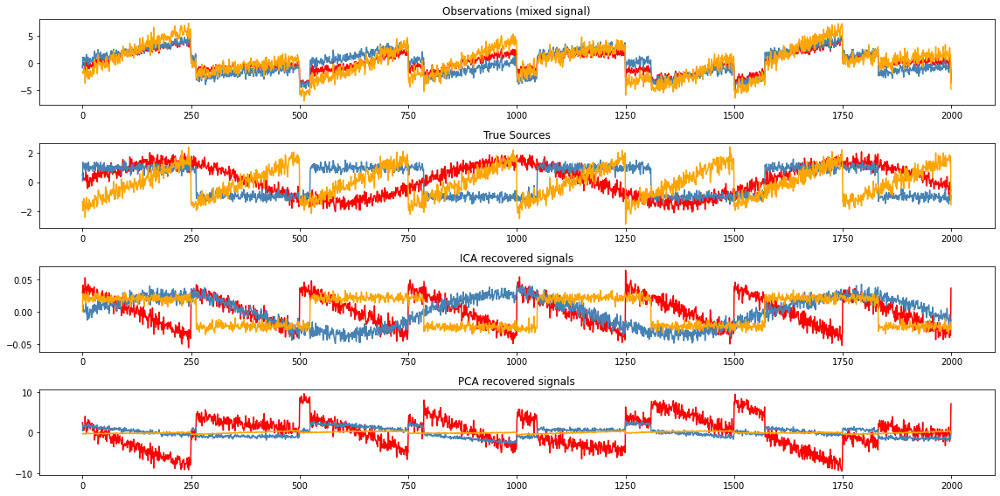

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

from sklearn.decomposition import FastICA, PCA

# #############################################################################
# Generate sample data
np.random.seed(0)
n_samples = 2000
time = np.linspace(0, 8, n_samples)

s1 = np.sin(2 * time)  # Signal 1 : sinusoidal signal
s2 = np.sign(np.sin(3 * time))  # Signal 2 : square signal
s3 = signal.sawtooth(2 * np.pi * time)  # Signal 3: saw tooth signal

S = np.c_[s1, s2, s3]
S += 0.2 * np.random.normal(size=S.shape)  # Add noise

S /= S.std(axis=0)  # Standardize data
# Mix data
A = np.array([[1, 1, 1], [0.5, 2, 1.0], [1.5, 1.0, 2.0]])  # Mixing matrix
X = np.dot(S, A.T)  # Generate observations

# X = data
# Compute ICA
ica = FastICA(n_components=3)
S_ = ica.fit_transform(X)  # Reconstruct signals
A_ = ica.mixing_  # Get estimated mixing matrix

# We can `prove` that the ICA model applies by reverting the unmixing.
assert np.allclose(X, np.dot(S_, A_.T) + ica.mean_)

# For comparison, compute PCA
pca = PCA(n_components=3)
H = pca.fit_transform(X)  # Reconstruct signals based on orthogonal components

# #############################################################################
# Plot results

plt.figure()

models = [X, S, S_, H]
names = ['Observations (mixed signal)',
         'True Sources',
         'ICA recovered signals',
         'PCA recovered signals']
colors = ['red', 'steelblue', 'orange']

plt.figure(figsize=(16,8))
for ii, (model, name) in enumerate(zip(models, names), 1):
    plt.subplot(4, 1, ii)
    plt.title(name)
    for sig, color in zip(model.T, colors):
        plt.plot(sig, color=color)

plt.tight_layout()
plt.show()

## Empirical wavelet transform (EWT)

The Empirical Wavelet Transform (EWT) aims to decompose a signal or an image on wavelet tight frames which are built adaptively. In 1D, the procedure consists in detecting the supports of some "modes" in the Fourier spectrum and then using these supports to build Littlewood-Paley type wavelets. The advantage of this empirical approach is to keep together some information that otherwise would be split in the case of dyadic filters. 

https://jegilles.sdsu.edu/ewt.html

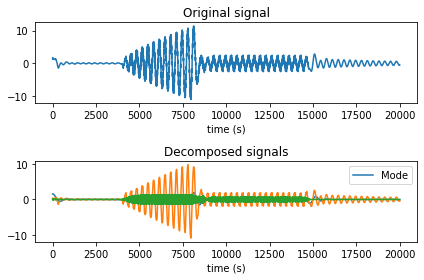

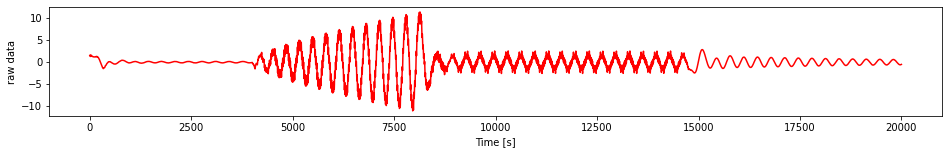

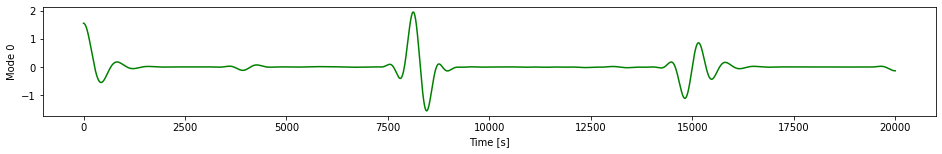

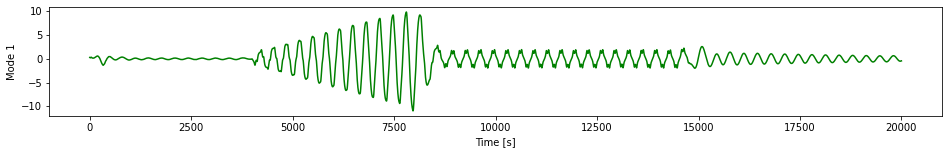

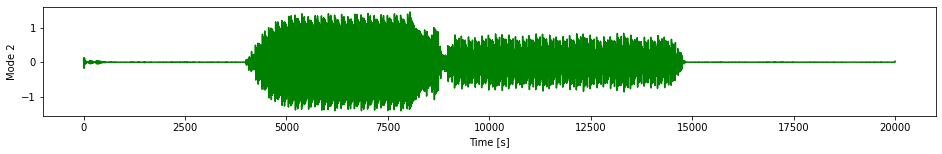

In [ ]:
#%% Example script
import numpy as np
import matplotlib.pyplot as plt
import ewtpy

T = 1000
t = np.arange(1,T+1)/T
f = np.cos(2*np.pi*0.8*t) + 2*np.cos(2*np.pi*10*t)+0.8*np.cos(2*np.pi*100*t)

#T = 100
f = data

# #. Time Domain 0 to T  
# T = 1000  
# fs = 1/T  
# t = np.arange(1,T+1)/T  
# freqs = 2*np.pi*(t-0.5-fs)/(fs)  

# #. center frequencies of components  
# f_1 = 2  
# f_2 = 24  
# f_3 = 288  

# #. modes  
# v_1 = (np.cos(2*np.pi*f_1*t))  
# v_2 = 1/4*(np.cos(2*np.pi*f_2*t))  
# v_3 = 1/16*(np.cos(2*np.pi*f_3*t))  

# f = v_1 + v_2 + v_3 + 0.1*np.random.randn(v_1.size)  

ewt,  mfb ,boundaries = ewtpy.EWT1D(f, N = 3)
# plt.plot(f)
# plt.plot(ewt)

plt.figure()
plt.subplot(2,1,1)
plt.plot(f)
plt.title('Original signal')
plt.xlabel('time (s)')
plt.subplot(2,1,2)
plt.plot(ewt)
plt.title('Decomposed signals')
plt.xlabel('time (s)')
plt.legend(['Mode'])
plt.tight_layout()


# Plot raw
plt.figure(figsize=(16,2))
plt.plot(f, 'r')
plt.xlabel("Time [s]")
plt.ylabel("raw data")
plt.show()

# Plot results
for i in range(ewt.shape[1]):
 #   plt.subplot(nIMFs+1, 1, n+2)
    plt.figure(figsize=(16,2))
    plt.plot(ewt[:,i], 'g')
    plt.xlabel("Time [s]")
    plt.ylabel("Mode %i" %(i))
    plt.locator_params(axis='y', nbins=5)
    plt.show()

## Vold–Kalman filter order tracking (VKF_OT)

https://www.researchgate.net/publication/335329652_Numerical_Implementation_of_High-Order_Vold-Kalman_Filter_Using_Python_Arbitrary-Precision_Arithmetic_Library

## EMD vs EEMD

EMD is an adaptive and efficient method applied to decompose nonlinear and non-stationary signals. It extracts a series of intrinsic mode functions (IMFs) from the analyzed signal by sifting stage by stage. Each of these IMFs must satisfy the following conditions:

* The first condition is that the number of extrema and the number of zero crossings must be equal or differ at most by one.

* The other is that at any point the mean value of the envelope defined by the local maxima and the envelope defined by the local minima must
be zero.

EMD has one significant drawback, and this is called the mode mixing problem. Mode mixing refers to the situation when an IMF resulting from EMD decomposition has components of different frequencies. Later on, Wu and Huang (2005) proposed a new noise assisted analysis method, called ensemble EMD (EEMD), to eliminate the mode mixing phenomenon and obtain the actual time–frequency distribution of the seismic signal.

The principle of EEMD is simple: adding white noise to the data, which distributes uniformly in the whole time–frequency space, the bits of signals of different scales can be automatically designed onto proper scales of  reference established by the white noise. Also its algorithm is straightforward as described below:

* Add a white noise series to the original signal.
* Decompose the signal with added white noise into IMFs using EMD.

Wu and Huang (2005): "*White noise is necessary to force the ensemble to exhaust all possible solutions in the sifting process, thus making the different scale signals to collate in the proper intrinsic mode functions (IMF) dictated by the dyadic filter banks. As the EMD is a time space analysis method, the white noise is averaged out with sufficient number of trials; the only persistent part that survives the averaging process is the signal, which is then treated as the true and more physical meaningful answer.*"

References:

Wu, Z.H., Huang, N.E., 2005. Ensemble empirical mode decomposition: a noise-assisted data analysis method. Center for Ocean–Land–Atmosphere Studies Technical Report, pp. 155–156.

Tong, W., Z. Mingcai, Y. Qihao, and Z. Huyuan (2012), Comparing the applications of EMD and EEMD on time-frequency analysis of seismic signal, J. Appl. Geophys., 83, 29–34, doi:10.1016/j.jappgeo.2012.05.002.


## EMD/EEMD vs VMD

Both the methods are used to decompose a signal into various time domain signals called modes. The main difference is that EMD decomposes the signal adaptively and in a data-driven way whereas VMD method is non-recursive decomposition technique, where the modes are decomposed simultaneously about their center frequency.

*VMD*

* VMD decomposes a multicomponent signal into a series of sub-signals (mono-component) that have specific sparsity properties. 
* For a precise filter operation, it is necessary that the different mono-components are well isolated in the frequency spectrum of the raw signal. Otherwise, decomposition cannot be successful. 
* The sparsity property employed in VMD is that the mono-component should be mostly compact around a center pulsation in the frequency spectrum. In practical problems, these terms may not be universal in all cases. 
* For rough filter operation, VMD can work in most cases. The goal of extracting the interesting component from the raw signal can also be obtained, when different mono-components overlap in the corresponding frequency spectrum useless components are inevitable.

*EMD/EEMD*

* EMD/EEMD can work when the instantaneous frequencies (IFs) of different mono-components are distinct enough at each time point. 
* It is necessary for the ratio between a relatively low IF and a relatively high IF to be smaller than 0.75, and an ideal decomposition result can be obtained when the ratio is smaller than 0.5, for reasonable number of sifting iterations. 
* For a precise filtering operation, this necessary condition of the frequency resolution should be met; otherwise, a relatively large calculation error may be introduced. 
* Algorithms deriving from EMD can be employed in conjunction with other decomposition methods such as wavelet transforms, principal component analysis and adaptive multiscale morphological analysis to further remove color noise and highlight the specific characteristics of the valuable component.

In a study conducted by Hadiyoso et al (2020), they found that EEMD and VMD both outperformed EMD, as expected. However, the interesting finding was that the EEMD and VMD were very close in performance. 

In their comparative study, Maji and Pal (2016) observed that EMD method is more sensitive towards the lowest frequency present in the signal, but VMD was less sensitive. However, VMD showed the inverse characteristics towards the higher frequencies present in the signal. Another thing, the same features were tested on the different signals containing low and high frequency noises. Here it was noticed that VMD method more efficiently eliminated the high frequency noises keeping all characteristics of signal almost unchanged. Whereas EMD did the same but diminished the signal amplitude. Similarly in processing of low frequency signal EMD method shows comparatively better performance.

References:

Liu, Tao, et al. "A comparative study of four kinds of adaptive decomposition algorithms and their applications." Sensors 18.7 (2018): 2120.

U. Maji and S. Pal, "Empirical mode decomposition vs. variational mode decomposition on ECG signal processing: A comparative study," 2016 International Conference on Advances in Computing, Communications and Informatics (ICACCI), Jaipur, 2016, pp. 1129-1134, doi: 10.1109/ICACCI.2016.7732196.

S Hadiyoso et al, "Comparison of EMD, VMD and EEMD Methods in Respiration Wave Extraction Based on PPG Waves," 2020 J. Phys.: Conf. Ser. 1577 012040


## Variational mode decomposition (VMD)

Code: https://pypi.org/project/vmdpy/

Spectrum-based decomposition of a 1D input signal into k band-separated modes. Here, we propose an entirely non-recursive variational mode decomposition model, where the modes are extracted concurrently. The model looks for an ensemble of modes and their respective center frequencies, such that the modes collectively reproduce the (1D) input signal, while each being smooth after demodulation into baseband. The variational model is efficiently optimized using an alternating direction method of multipliers approach.

Applications: signal decomposition in audio engineering, climate analysis, various flux and neuromuscular signal analysis in medicine and biology, etc.

This is a variational alternative to the empirical mode decomposition (EMD; Huang et al. 1998), or the empirical wavelet transform (EWT; Gilles 2013).

See: K. Dragomiretskiy and D. Zosso, Variational Mode Decomposition, IEEE Trans. Signal Processing (in press). http://dx.doi.org/10.1109/TSP.2013.2288675

Vinícius R. Carvalho, Márcio F.D. Moraes, Antônio P. Braga, Eduardo M.A.M. Mendes, Evaluating five different adaptive decomposition methods for EEG signal seizure detection and classification, Biomedical Signal Processing and Control, Volume 62, 2020, 102073, ISSN 1746-8094, https://doi.org/10.1016/j.bspc.2020.102073.

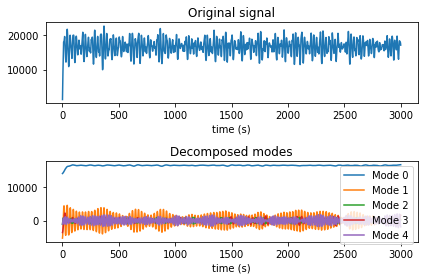

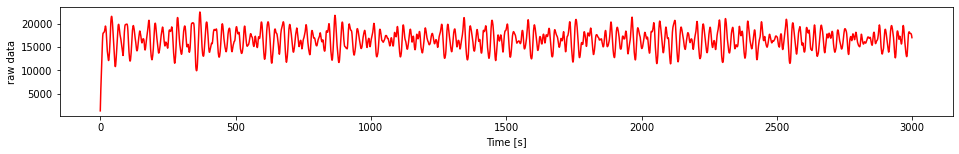

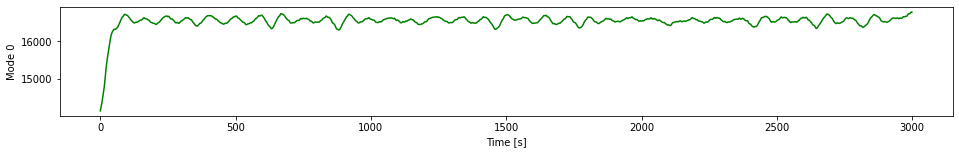

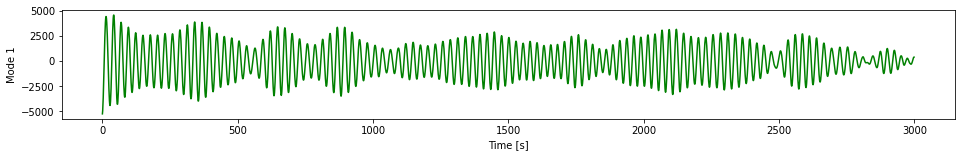

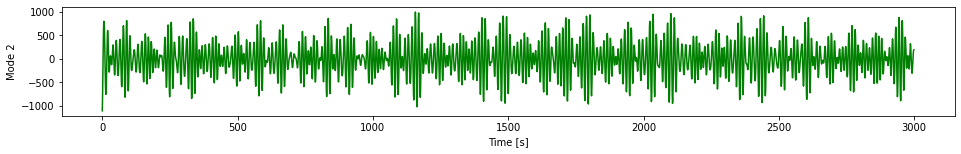

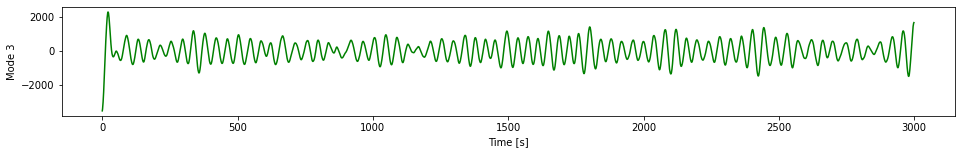

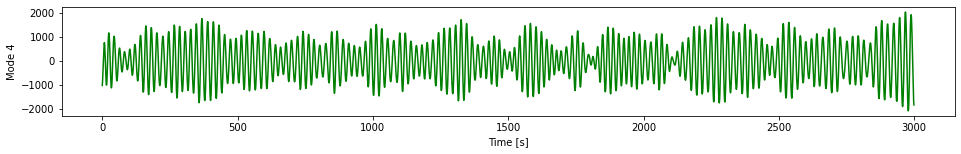

In [ ]:
#%% Simple example: generate signal with 3 components + noise  
import numpy as np  
import matplotlib.pyplot as plt  
from vmdpy import VMD  

#. Time Domain 0 to T  
T = 1000  
fs = 1/T  
t = np.arange(1,T+1)/T  
freqs = 2*np.pi*(t-0.5-fs)/(fs)  

#. center frequencies of components  
f_1 = 2  
f_2 = 24  
f_3 = 288  

#. modes  
v_1 = (np.cos(2*np.pi*f_1*t))  
v_2 = 1/4*(np.cos(2*np.pi*f_2*t))  
v_3 = 1/16*(np.cos(2*np.pi*f_3*t))  

f = v_1 + v_2 + v_3 + 0.1*np.random.randn(v_1.size)  

# T = 1000
# t = np.arange(1,T+1)/T
# f = np.cos(2*np.pi*0.8*t) + 2*np.cos(2*np.pi*10*t)+0.8*np.cos(2*np.pi*100*t)

#. some sample parameters for VMD  
alpha = 2000       # moderate bandwidth constraint  
tau = 0.            # noise-tolerance (no strict fidelity enforcement)  
K = 3              # 3 modes  
DC = 0             # no DC part imposed  
init = 1           # initialize omegas uniformly  
tol = 1e-7  

# use seismic data
f = data
T = 100
K = 5

#. Run VMD 
u, u_hat, omega = VMD(f, alpha, tau, K, DC, init, tol)  

#. Visualize decomposed modes
plt.figure()
plt.subplot(2,1,1)
plt.plot(f)
plt.title('Original signal')
plt.xlabel('time (s)')
plt.subplot(2,1,2)
plt.plot(u.T)
plt.title('Decomposed modes')
plt.xlabel('time (s)')
plt.legend(['Mode %d'%m_i for m_i in range(u.shape[0])])
plt.tight_layout()

# Plot raw
plt.figure(figsize=(16,2))
plt.plot(f, 'r')
plt.xlabel("Time [s]")
plt.ylabel("raw data")
plt.show()

# Plot results
for i in range(u.shape[0]):
    plt.figure(figsize=(16,2))
    plt.plot(u[i], 'g')
    plt.xlabel("Time [s]")
    plt.ylabel("Mode %i" %(i))
    plt.locator_params(axis='y', nbins=5)
    plt.show()

## Empirical Mode Decomposition (EMD) and its variations

Cite: https://www.clear.rice.edu/elec301/Projects02/empiricalMode/

EMD is a method of breaking down a signal without leaving the time domain. It can be compared to other analysis methods like Fourier Transforms and wavelet decomposition. The process is useful for analyzing natural signals, which are most often non-linear and non-stationary. This parts from the assumptions of the methods we have thus far learned (namely that the systems in question be LTI, at least in approximation).

EMD filters out functions which form a complete and nearly orthogonal basis for the original signal. Completeness is based on the method of the EMD; the way it is decomposed implies completeness. The functions, known as Intrinsic Mode Functions (IMFs), are therefore sufficient to describe the signal, even though they are not necessarily orthogonal. The reasons are described in Huang et al., published in the Royal Society Proceedings on Math, Physical, and Engineering Sciences: "...the real meaning here applies only locally. For some special data, the neighbouring components could certainly have sections of data carrying the same frequency at different time durations. But locally, any two components should be orthogonal for all practical purposes" (927).

This article with colab code (https://towardsdatascience.com/decomposing-signal-using-empirical-mode-decomposition-algorithm-explanation-for-dummy-93a93304c541) explains EMD in a step by step example.

Pros:

In EMD, the frequency is derived by differentiation rather than by convolution, as for the wavelet analysis; this allows to overcome the uncertainty principle limitations.

EMD is a specialized analysis. It works well on some types of time series data.

Cons:

The drawback for EMD is related on the deﬁciency of a theoretical basis, but it is ground just on an empirical basis.

EMD is very sensitive to noise and runs into the problem of mode mixing.

Source: https://github.com/laszukdawid/PyEMD

EMD variations:
* Ensemble EMD (EEMD),
* "Complete Ensemble EMD" (CEEMDAN)
* different settings and configurations of vanilla EMD.
* Image decomposition (EMD2D & BEMD) (experimental, no support)

PyEMD allows to use different splines for envelopes, stopping criteria and extrema interpolation.

### EMD

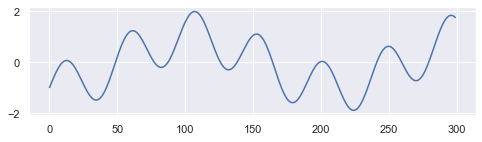

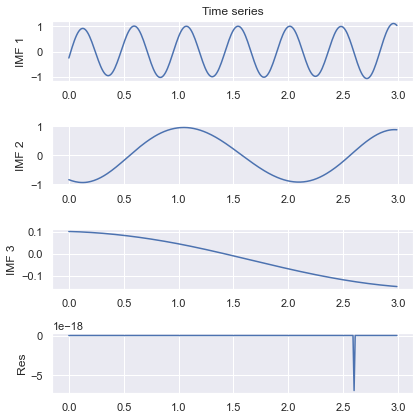

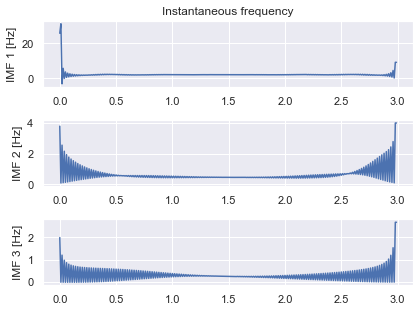

In [ ]:
import numpy as np
from PyEMD import EMD, Visualisation

t = np.arange(0, 3, 0.01)
S = np.sin(13*t + 0.2*t**1.4) - np.cos(3*t)

# S = data
# t = range(len(S))

# Extract imfs and residue
# In case of EMD
emd = EMD()
emd.emd(S)
imfs, res = emd.get_imfs_and_residue()

# In general:
#components = EEMD()(S)
#imfs, res = components[:-1], components[-1]
plt.figure(figsize=(8,2))
plt.plot(S)
vis = Visualisation()
vis.plot_imfs(imfs=imfs, residue=res, t=t, include_residue=True)
vis.plot_instant_freq(t, imfs=imfs)
vis.show()

### EEMD

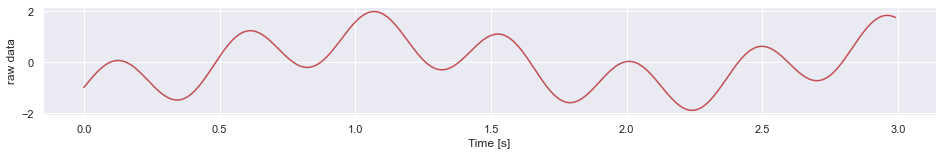

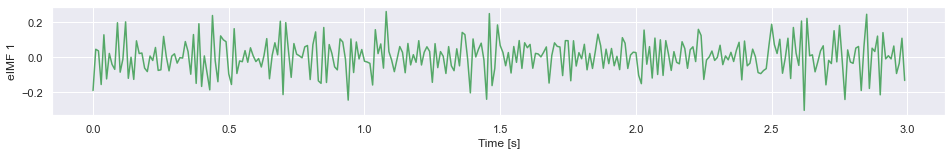

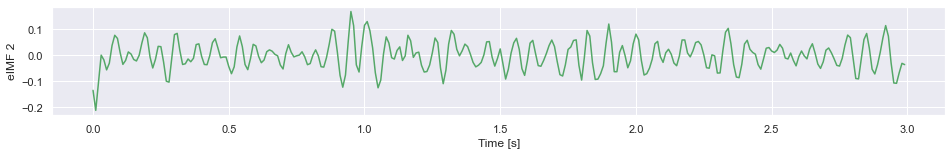

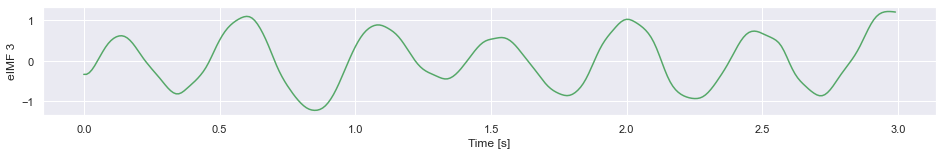

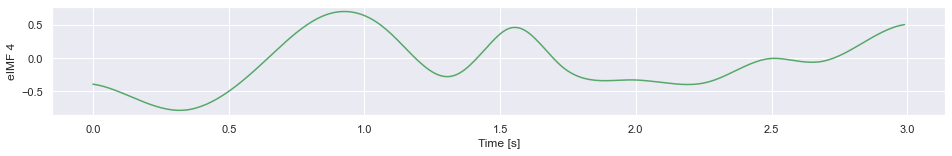

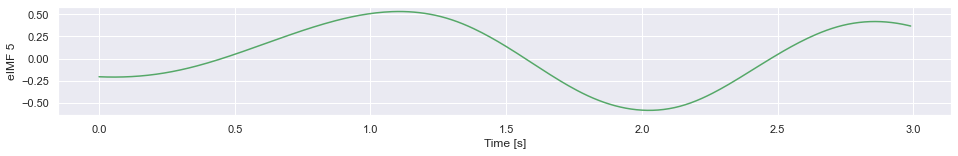

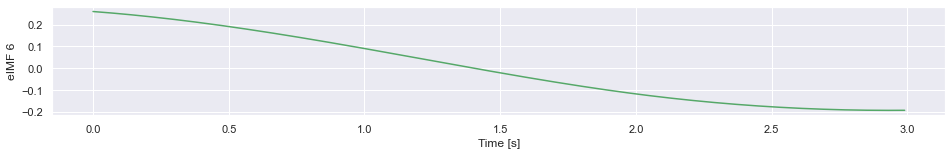

In [ ]:
# Author: Dawid Laszuk
# Last update: 7/07/2017
#from __future__ import division, print_function

from PyEMD import EEMD
import numpy as np
import pylab as plt
# import matplotlib.pyplot as plt  

# S = data
# t = np.linspace(0, 1, len(S))

# Define signal for EEMD
# t = np.linspace(0, 1, 200)
# sin = lambda x,p: np.sin(2*np.pi*x*t+p)
# S = 3*sin(18,0.2)*(t-0.2)**2
# S += 5*sin(11,2.7)
# S += 3*sin(14,1.6)
# S += 1*np.sin(4*2*np.pi*(t-0.8)**2)
# S += t**2.1 -t

# the signal used in EMD
t = np.arange(0, 3, 0.01)
S = np.sin(13*t + 0.2*t**1.4) - np.cos(3*t)

# Assign EEMD to `eemd` variable
eemd = EEMD()

# # Say we want detect extrema using parabolic method
# emd = eemd.EMD
# emd.extrema_detection="parabol"

# Execute EEMD on S
eIMFs = eemd.eemd(S, t)
nIMFs = eIMFs.shape[0]

# Plot results
plt.figure(figsize=(16,2))
# plt.plot(S)

# plt.figure(figsize=(12,9))
# plt.subplot(nIMFs+1, 1, 1)
plt.plot(t, S, 'r')
plt.xlabel("Time [s]")
plt.ylabel("raw data")
plt.show()

for n in range(nIMFs):
 #   plt.subplot(nIMFs+1, 1, n+2)
    plt.figure(figsize=(16,2))
    plt.plot(t, eIMFs[n], 'g')
    plt.xlabel("Time [s]")
    plt.ylabel("eIMF %i" %(n+1))
    plt.locator_params(axis='y', nbins=5)
    plt.show()


#plt.tight_layout()
#plt.savefig('eemd_example', dpi=120)


## Signal decomposition with Fast Fourier Transforms

DEPRECATION: Python 2.7 reached the end of its life on January 1st, 2020. Please upgrade your Python as Python 2.7 is no longer maintained. pip 21.0 will drop support for Python 2.7 in January 2021. More details about Python 2 support in pip, can be found at https://pip.pypa.io/en/latest/development/release-process/#python-2-support
Defaulting to user installation because normal site-packages is not writeable


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/urllib3/connectionpool.py:986: InsecureRequestWarning: Unverified HTTPS request is being made to host 'sensorweb.us'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning,


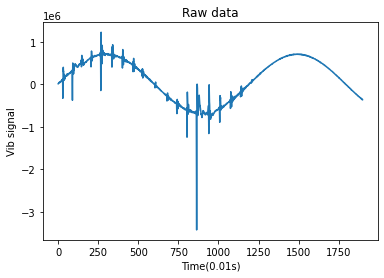

In [ ]:
!pip install influxdb
import numpy as np
import pandas as pd
import csv
import matplotlib.pyplot as plt
import pywt
from influxdb import InfluxDBClient
import operator
import scipy.signal as sg
import scipy as sp

from numpy.fft import rfft, irfft, rfftfreq
from scipy import fftpack
import pandas as pd

ip = "sensorweb.us" 
unit = "b8:27:eb:48:68:fa" # FloorB
stampIni = "2020-08-22T00:42:41.000Z" # UTC time = EST time + 4
stampEnd = "2020-08-22T00:43:00.000Z"
client = InfluxDBClient(ip, "8086", "sili", "sensorweb", "floorseis",   True)
# Check FloorB at http://3.136.84.223:3000/d/3HdIpxGMz/s-house-dashboard-raw-data-only?orgId=1&from=1594149493945&to=1594149503005

query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\')  and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\'   '
result = client.query(query)
points = list(result.get_points())
values =  map(operator.itemgetter('value'), points)
times  =  map(operator.itemgetter('time'),  points)
data = np.array(list(values))
if(len(data) == 0):
  print("No data in the chosen time range!")
  quit()
time        = np.arange(0, 10, 10/len(data));
data   = data + np.sin(time)*max(data)



plt.xlabel('Time(0.01s)')
plt.ylabel('Vib signal')
plt.title("Raw data")
plt.plot(data) # [mintime:maxtime-1])
plt.show()


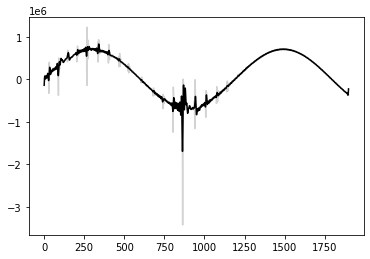

In [ ]:
import matplotlib.pyplot as plt

def low_pass(s, threshold=1e4):
    fourier = rfft(s)
    frequencies = rfftfreq(s.size, d=2e-2 / s.size)
    fourier[frequencies > threshold] = 0
    return irfft(fourier)

lf_signal_1 = low_pass(data)
plt.plot(data, color='lightgray')
plt.plot(lf_signal_1, color='black')



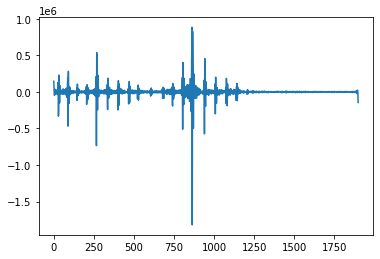

In [ ]:
def high_pass(s, threshold=1e7):
    fourier = rfft(s)
    frequencies = rfftfreq(s.size, d=2e-2/s.size)
    fourier[frequencies < threshold] = 0
    return irfft(fourier)

hf_signal_1 = high_pass(data, threshold=1e4)

plt.plot(hf_signal_1)

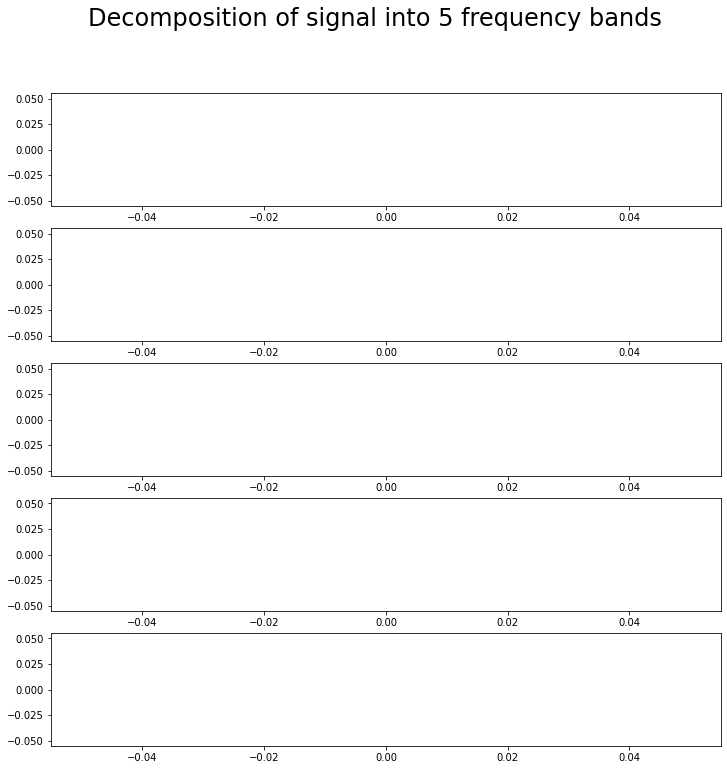

In [ ]:
import numpy as np
from numpy.fft import rfft, irfft, rfftfreq
from scipy import fftpack

def decompose_into_n_signals(srs, n):
    fourier = rfft(srs)
    frequencies = rfftfreq(srs.size, d=2e-2/srs.size)
    out = []
    for vals in np.array_split(frequencies, n):
        ft_threshed = fourier.copy()
        ft_threshed[(vals.min() > frequencies)] = 0
        ft_threshed[(vals.max() < frequencies)] = 0        
        out.append(irfft(ft_threshed))
    return out

def plot_n_signals(sigs):
    fig, axarr = plt.subplots(len(sigs), figsize=(12, 12))
    for i, sig in enumerate(sigs):
        plt.sca(axarr[i])
        plt.plot(sig[3000:-3000])
    plt.gcf().suptitle(f"Decomposition of signal into {len(sigs)} frequency bands", fontsize=24)

plot_n_signals(decompose_into_n_signals(data, 5))

## FFT, STFT and PSD analysis
The FFT is a discrete version of the continuous Fourier Transform. A single FFT is used when you want to understand the frequency spectrum of a signal. The STFT is used when you want to know at what time a particular frequency event occurs in the signal.
Refer better plot examples at https://www.oreilly.com/library/view/elegant-scipy/9781491922927/ch04.html

The FFT is a discrete version of the continuous Fourier Transform.

PSD vs FFT: https://blog.endaq.com/why-the-power-spectral-density-psd-is-the-gold-standard-of-vibration-analysis (Why the Power Spectral Density (PSD) Is the Gold Standard of Vibration Analysis)


The FFT produces a 1D vector of complex numbers. This complex vector is often used to calculate a 2D matrix of Frequency Magnitude versus Frequency, and represented as a 2D graph, like this one:

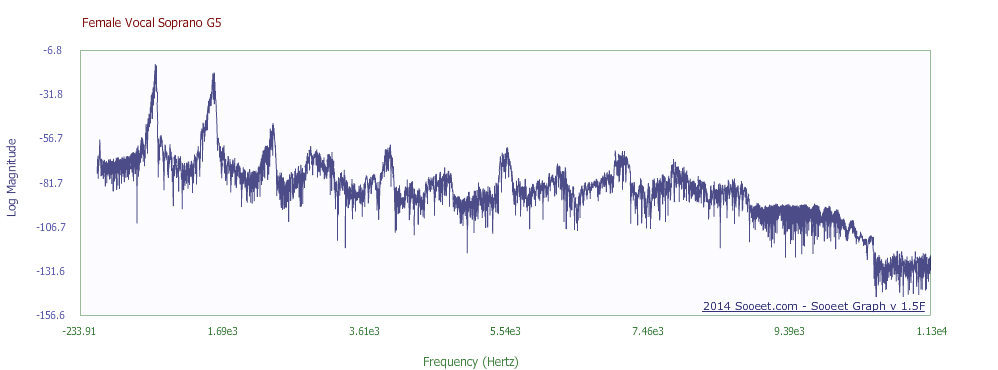
Frequency spectrum female vocal soprano, Sooeet FFT calculator

A single FFT is used when you want to understand the frequency spectrum of a signal. For example, from the above FFT graph we can say that most of the energy in this female soprano's G5 note is concentrated in the 784 Hz and 1572 Hz frequencies.

STFT or "Short-Time Fourier Transform" uses a sliding-frame FFT to produce a 2D matrix of Frequency versus Time, often represented as a graph called a Spectrogram, like this one:

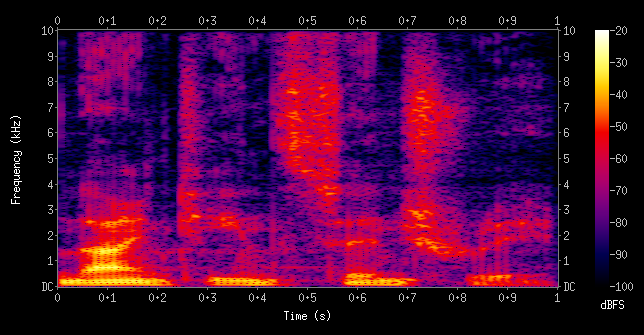

Spectrogram of a vocal phrase, Sooeet FFT calculator: https://sooeet.com/math/online-fft-calculator.php

The STFT is used when you want to know at what time a particular frequency event occurs in the signal. For example, from the above graph we can say that a large portion of the energy in this vocal phrase occurred between 0.05 and 0.15 seconds, in the frequency range of 100 Hz to 1500 Hz.

The workflow for the FFT is:

Sample the signal -> Window the entire sample frame -> FFT -> Calculate magnitude and phase -> Output something, usually a 2D graph



### Fast Fourier transform (FFT)

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:15: DeprecationWarning: Using scipy.fft as a function is deprecated and will be removed in SciPy 1.5.0, use scipy.fft.fft instead.
  from ipykernel import kernelapp as app


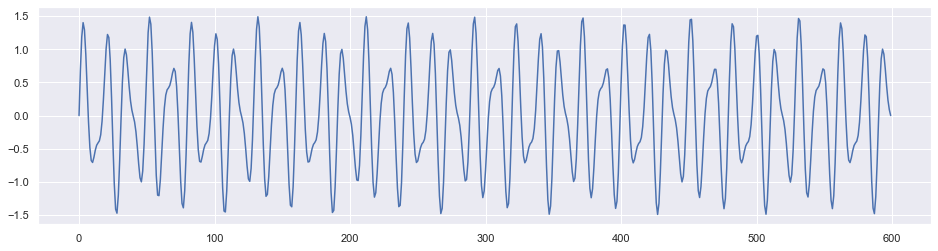

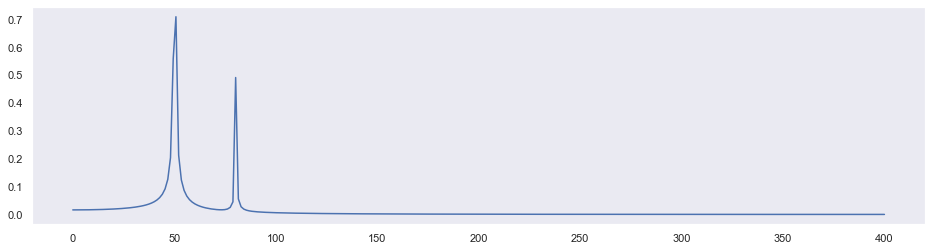

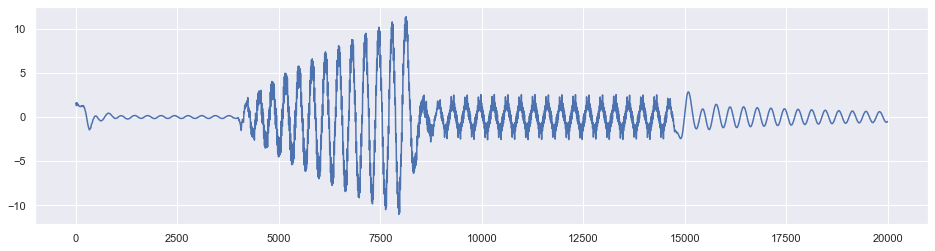

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:39: DeprecationWarning: Using scipy.fft as a function is deprecated and will be removed in SciPy 1.5.0, use scipy.fft.fft instead.


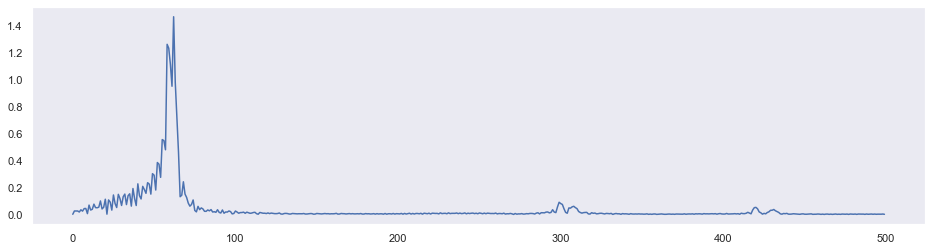

In [ ]:
from scipy import fft
import matplotlib.pyplot as plt
from scipy import fftpack
from scipy import signal
import numpy as np
import math

# synthetic data
# Number of sample points
N = 600
# sample spacing
T = 1.0 / 800.0
x = np.linspace(0.0, N*T, N)
y = np.sin(50.0 * 2.0*np.pi*x) + 0.5*np.sin(80.0 * 2.0*np.pi*x)

yf = fft(y)
xf = np.linspace(0.0, 1.0/(2.0*T), N//2)

plt.figure(figsize=(16, 4))
plt.plot(y)
plt.show()

plt.figure(figsize=(16, 4))
plt.plot(xf, 2.0/N * np.abs(yf[0:N//2]))
plt.grid()
plt.show()

# use e-wave data
y = data
fs = 20000
N = len(y)
x = np.linspace(0.0, N/fs, N)

plt.figure(figsize=(16, 4))
plt.plot(y)
plt.show()

maxf = 500
minf = 0

yf = fft(y)
xf = np.linspace(0.0, 1.0/(2.0/fs), N//2)
#pyf = np.log(2.0/N * np.abs(yf[0:N//2]))
pyf = 2.0/N * np.abs(yf[0:N//2])
l = len(xf)
plt.figure(figsize=(16, 4))

plt.plot(xf[int(minf*2*l/fs):int(maxf*2*l/fs)], pyf[int(minf*2*l/fs):int(maxf*2*l/fs)])
plt.grid()
plt.show()

# X = fftpack.fft(y)
# freqs = fftpack.fftfreq(len(y)) * fs

# fig, ax = plt.subplots()

# ax.stem(freqs, np.abs(X))
# ax.set_xlabel('Frequency in Hertz [Hz]')
# ax.set_ylabel('Frequency Domain (Spectrum) Magnitude')
# ax.set_xlim(-fs / 2, fs / 2)
# ax.set_ylim(-5, 110)

# M = 1024 # chop to slices with M samples per slice
# freqs, times, Sx = signal.spectrogram(x, fs, window='hanning',
#                                       nperseg=1024, noverlap=M - 100,
#                                       detrend=False, scaling='spectrum')

# f, ax = plt.subplots(figsize=(4.8, 2.4))
# ax.pcolormesh(times, freqs / 1000, 10 * np.log10(Sx), cmap='viridis')
# ax.set_ylabel('Frequency [kHz]')
# ax.set_xlabel('Time [s]');

### Short-time Fourier Transform (STFT)

author: Woody

The Short-time Fourier transform (STFT), is a Fourier-related transform used to determine the sinusoidal frequency and phase content of local sections of a signal as it changes over time. In practice, the procedure for computing STFTs is to divide a longer time signal into shorter segments of equal length and then compute the Fourier transform separately on each shorter segment. This reveals the Fourier spectrum on each shorter segment. One then usually plots the changing spectra as a function of time, known as a spectrogram or waterfall plot.

Pros:

FFT is a very efficient way to compute the DFT of a vector. 

It is linear and sometimes it is useful to use its matrix representation when analyzing it or when doing some theoretical analysis. 

It is a standard way to make frequency domain analysis of a time series data.

Cons:

Fourier transform does not work with nonstationary noise and signal with abrupt changes.

The resolution depends on the points per segmentation.

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/urllib3/connectionpool.py:986: InsecureRequestWarning: Unverified HTTPS request is being made to host 'sensorweb.us'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning,


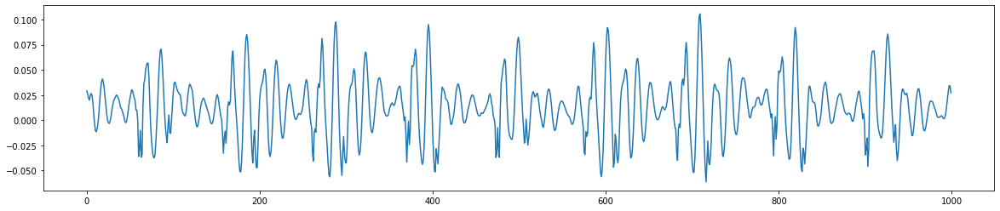

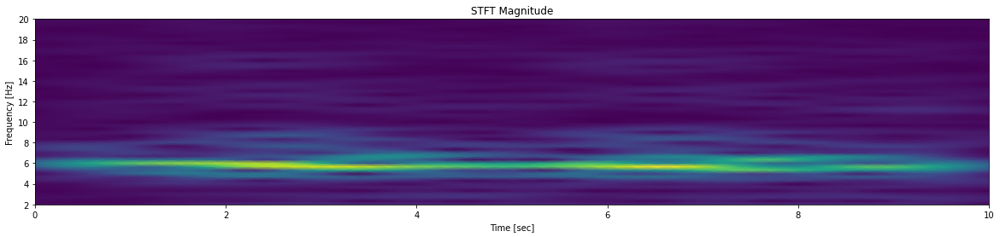

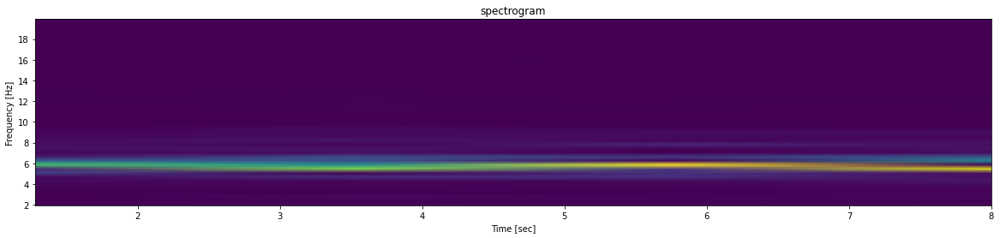

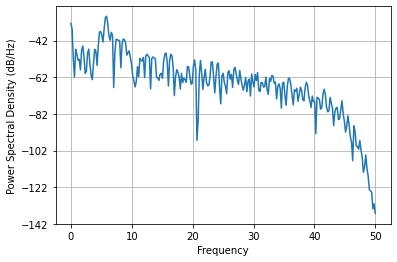

In [ ]:
from scipy import signal
import numpy as np
import matplotlib.pyplot as plt
from scipy import fft
from sklearn import preprocessing

import csv
import matplotlib.pyplot as plt
import pywt
from influxdb import InfluxDBClient
import operator
import scipy.signal as sg
import scipy as sp

ip = "sensorweb.us" 
unit = "b8:27:eb:23:4b:2b" 
stampIni = "2021-02-02T20:25:49.000000Z" # UTC time = EST time + 4
stampEnd = "2021-02-02T20:25:59.000000Z"

client = InfluxDBClient(ip, "8086", "test", "sensorweb", "shake_ctru", True)

query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\')  and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\'   '
result = client.query(query)
points = list(result.get_points())
values =  map(operator.itemgetter('value'), points)
times  =  map(operator.itemgetter('time'),  points)
data = np.array(list(values))
fs = 100 # for vibration data

if(len(data) == 0):
  print("No data in the chosen time range!")
  quit()

# # example with synthetic data
# # fs = 10e3
# # N = 1e5
# # amp = 2 * np.sqrt(2)
# # noise_power = 0.01 * fs / 2
# # time = np.arange(N) / float(fs)
# # mod = 500*np.cos(2*np.pi*0.25*time)
# # carrier = amp * np.sin(2*np.pi*3e3*time + mod)
# # noise = np.random.normal(scale=np.sqrt(noise_power),
# #                          size=time.shape)
# # noise *= np.exp(-time/5)
# # x = carrier + noise

# # plt.figure(figsize=(16, 4))
# # plt.plot(x)
# # plt.show()

# # synthetic data
# # Number of sample points
# N = 6000
# # sample spacing
# fs = 800.0
# npseg = 2000
# slidingstep=200
# fmin = 0
# fmax = 100

# T = 1.0 / fs
# x = np.linspace(0.0, N*T, N)
# y = np.sin(50.0 * 2.0*np.pi*x) + 0.5*np.sin(80.0 * 2.0*np.pi*x)

# plt.figure(figsize=(16, 4))
# plt.plot(y)
# plt.show()

# # plt.figure(figsize=(16, 4))
# # plt.plot(xf, 2.0/N * np.abs(yf[0:N//2]))
# # plt.grid()
# # plt.show()

# f, t, Zxx = signal.stft(y, fs, nperseg=npseg, noverlap = npseg-slidingstep)
# plt.figure(figsize=(16, 4))
# plt.pcolormesh(t, f[int(fmin*npseg/fs):int(fmax*npseg/fs)+1], np.abs(Zxx[int(fmin*npseg/fs):int(fmax*npseg/fs)+1,:]), shading='gouraud')
# #plt.pcolormesh(t, f, np.abs(Zxx), shading='gouraud')

# plt.title('STFT Magnitude')
# plt.ylabel('Frequency [Hz]')
# plt.xlabel('Time [sec]')
# plt.show()

# # use e-wave data
# x = data
# fs = 20000
# fmin = 0
# fmax = 500
# npseg = 2000

# use seismic data
x = data /np.linalg.norm(data)
fs = 100
fmin = 2
fmax = 20
npseg = 300

slidingstep=20

plt.figure(figsize=(20, 4))
plt.plot(x)
plt.show()

f, t, Zxx = signal.stft(x, fs, nperseg=npseg, noverlap = npseg-slidingstep)
plt.figure(figsize=(20, 4))
plt.pcolormesh(t, f[int(fmin*npseg/fs):int(fmax*npseg/fs)+1], np.abs(Zxx[int(fmin*npseg/fs):int(fmax*npseg/fs)+1,:]), shading='gouraud')
#plt.pcolormesh(t, f, np.abs(Zxx), shading='gouraud')

plt.title('STFT Magnitude')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.show()

# Compute and plot the spectrogram.
f, t, Zxx = signal.spectrogram(x, fs)
npseg = 256

plt.figure(figsize=(20, 4))
# plt.pcolormesh(t, f, Zxx, shading='gouraud')
plt.pcolormesh(t, f[int(fmin*npseg/fs):int(fmax*npseg/fs)+1], np.abs(Zxx[int(fmin*npseg/fs):int(fmax*npseg/fs)+1,:]), shading='gouraud')
plt.title('spectrogram')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.show()

# plt.plot(ax, s) 
# plt.subplot(212) 
plt.psd(x, 512, 100) 
plt.show() 


#### synthetic data examples

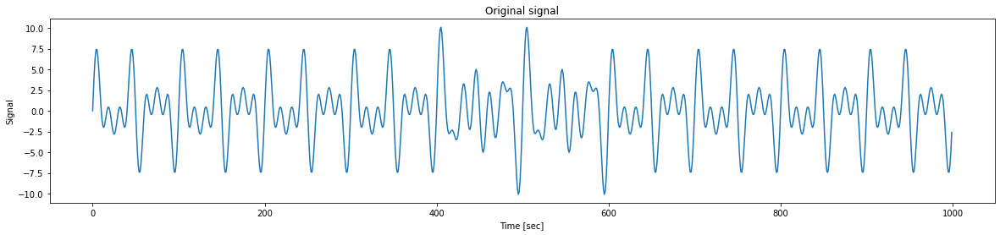

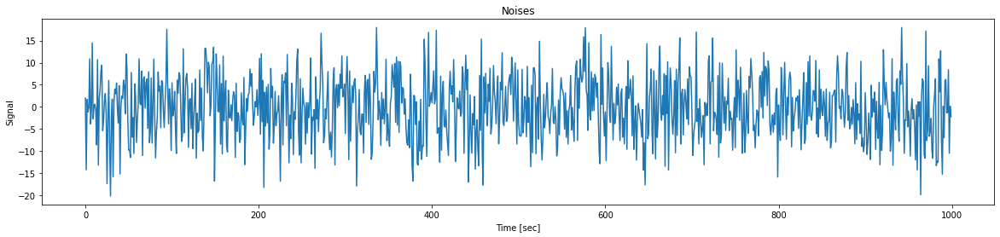

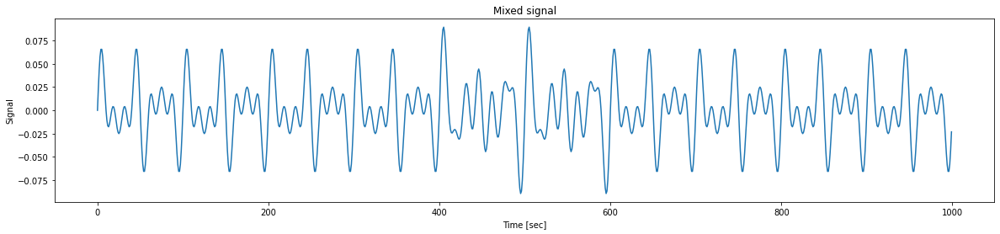

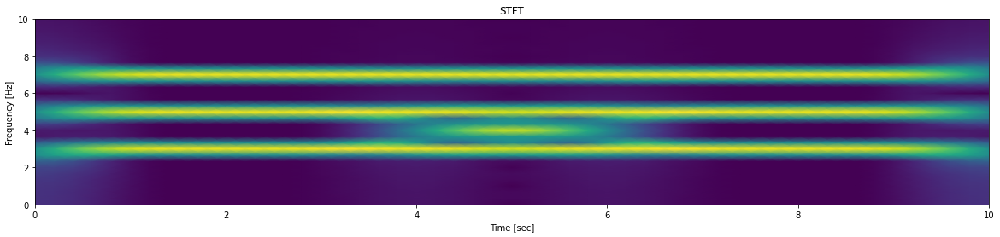

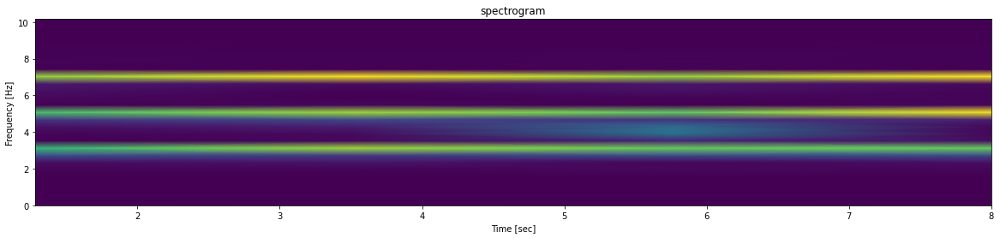

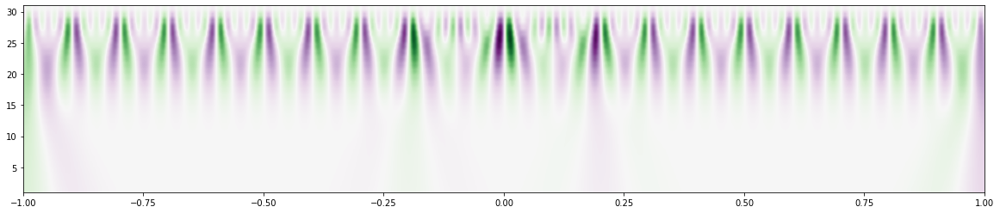

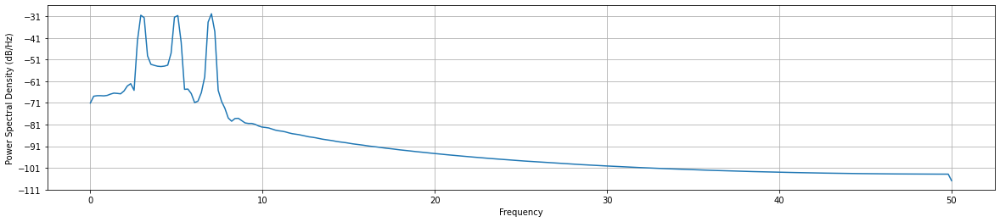

In [ ]:
from scipy import signal
import matplotlib.pyplot as plt
import numpy as np
# generate test signal

# x= data

# fs = 100 # 10e3
# N = fs * 10# 1e5
# amp = 2 * np.sqrt(2)
# noise_power = 0.01 * fs / 2
# time = np.arange(N)/float(fs)
# mod = 500 * np.cos(2*np.pi*0.25*time)
# carrier = amp * np.sin(2*np.pi*3e3*time+mod)
# noise = np.random.normal(scale=np.sqrt(noise_power), size=time.shape)
# noise *= np.exp(-time/5)
# x = carrier + noise

# simulate two sine waves
fs = 100
duration = 10 #seconds
N = fs * duration
amp = 2 * np.sqrt(2)
noise_power = 100* 0.01 * fs / 2
time = np.arange(N)/float(fs)
# print(time)
# mod = 500 * np.cos(2*np.pi*0.25*time)
carrier = amp * np.sin(2*np.pi*5*time) + amp * np.sin(2*np.pi*3*time) + amp * np.sin(2*np.pi*7*time) #+mod) # 3Hz + 5Hz signals
event = amp * np.sin(2*np.pi*4*time[400:600])
carrier[400:600] += event
# print(event)
noise = np.random.normal(scale=np.sqrt(noise_power), size=time.shape)
# noise *= np.exp(-time/5)
data = carrier #+ noise

plt.figure(figsize=(20, 4))
plt.plot(carrier)
plt.title('Original signal')
plt.ylabel('Signal')
plt.xlabel('Time [sec]')
plt.show()

plt.figure(figsize=(20, 4))
plt.title('Noises')
plt.ylabel('Signal')
plt.xlabel('Time [sec]')
plt.plot(noise)
plt.show()

# use seismic data
x = data/np.linalg.norm(data)

plt.figure(figsize=(20, 4))
plt.plot(x)
plt.title('Mixed signal')
plt.ylabel('Signal')
plt.xlabel('Time [sec]')
plt.show()

fmin = 0
fmax = 10
npseg = 300
slidingstep=20

# calculate and plot STFT
f, t, Zxx = signal.stft(x, fs, nperseg=npseg, noverlap = npseg-slidingstep)
# plt.pcolormesh(t, f, np.abs(Zxx), vmin = 0, vmax = amp)
plt.figure(figsize=(20, 4))
plt.pcolormesh(t, f[int(fmin*npseg/fs):int(fmax*npseg/fs)+1], np.abs(Zxx[int(fmin*npseg/fs):int(fmax*npseg/fs)+1,:]), shading='gouraud')
plt.title('STFT')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.show()

# Compute and plot the spectrogram.
f, t, Zxx = signal.spectrogram(x, fs)
npseg = 260

plt.figure(figsize=(20, 4))
# plt.pcolormesh(t, f, Zxx, shading='gouraud')
plt.pcolormesh(t, f[int(fmin*npseg/fs):int(fmax*npseg/fs)+1], np.abs(Zxx[int(fmin*npseg/fs):int(fmax*npseg/fs)+1,:]), shading='gouraud')
plt.title('spectrogram')
plt.ylabel('Frequency [Hz]')
plt.xlabel('Time [sec]')
plt.show()

plt.figure(figsize=(20, 4))
sig = x
widths = np.arange(1, 31)
cwtmatr = signal.cwt(sig, signal.ricker, widths)
plt.imshow(cwtmatr, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())
plt.show()

plt.figure(figsize=(20, 4))
plt.psd(x, 512, 100) 
plt.show() 



### Power Spectral Density (PSD)

Two main approaches (https://scipy-lectures.org/intro/scipy/auto_examples/plot_spectrogram.html): 

(1) Estimate power spectral density using Welch’s method. https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.welch.html matlabplot.psd() uses the power spectral density 𝑃𝑥𝑥 by Welch's average periodogram method. https://www.geeksforgeeks.org/plot-the-power-spectral-density-using-matplotlib-python/

(2) Estimate power spectral density using a periodogram. https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.periodogram.html

More approaches are listed in https://dsp.stackexchange.com/questions/2096/why-so-many-methods-of-computing-psd. For starters, there are two main methods of power spectral density estimation: non-parametric and parametric.

- Non-parametric methods are used when little is known about the signal ahead of time. They typically have less computational complexity than parametric models. Methods in this group are further divided into two categories: periodograms and correlograms. Periodograms are also sometimes referred to as direct methods, as they result in a direct transformation of the data . These include the sample spectrum, Bartlett's method, Welch's method, and the Daniell Periodogram. Correlograms are sometimes referred to as indirect methods, as they exploit the Wiener-Khinchin theorem. Therefore these methods are based on taking the Fourier transform of some sort of estimate of the autocorrelation sequence. Because of the high amount of variance associated with higher order lags (due to a small amount of data samples used in the correlations), windowing is used. The Blackman-Tukey method generalizes the correlogram methods.

- Parametric methods typically assume some sort of signal model prior to calculation of the power spectral density estimate. Therefore, it is assumed that some knowledge of the signal is known ahead of time. There are two main parametric method categories: autoregressive methods and subspace methods.


The paper below tries to combine periodogram and acf approach for better PSD: On Periodicity Detection and Structural Periodic Similarity: http://alumni.cs.ucr.edu/~mvlachos/pubs/sdm05.pdf   

The Yule-Walker Method block estimates the power spectral density (PSD) of the input using the Yule-Walker AR method. This method, also called the autocorrelation method, fits an autoregressive (AR) model to the windowed input data. It does so by minimizing the forward prediction error in the least squares sense. This formulation leads to the Yule-Walker equations, which the Levinson-Durbin recursion solves. Block outputs are always nonsingular.

The input must be a column vector. This input represents a frame of consecutive time samples from a single-channel signal. The block outputs a column vector containing the estimate of the power spectral density of the signal at $N_{fft}$ equally spaced frequency points. The frequency points are in the range [0,$F_s$), where $F_s$ is the sampling frequency of the signal.

When you select Inherit estimation order from input dimensions, the order of the all-pole model is one less that the input frame size. Otherwise, the Estimation order parameter value specifies the order. To guarantee a valid output, the Estimation order parameter must be less than or equal to half the input vector length. The block computes the spectrum from the FFT of the estimated AR model parameters.

Selecting the Inherit FFT length from estimation order parameter specifies that Nfft is one greater than the estimation order. Clearing the Inherit FFT length from estimation order parameter allows you to use the FFT length parameter to specify Nfft as a power of 2. The block zero-pads or wraps the input to $N_{fft}$ before computing the FFT.

When you select the Inherit sample time from input check box, the block computes the frequency data from the sample period of the input signal. For the block to produce valid output, the following conditions must hold:

The input to the block is the original signal, with no samples added or deleted (by insertion of zeros, for example).

The sample period of the time-domain signal in the simulation equals the sample period of the original time series.

If these conditions do not hold, clear the Inherit sample time from input check box. You can then specify a sample time using the Sample time of original time series parameter.


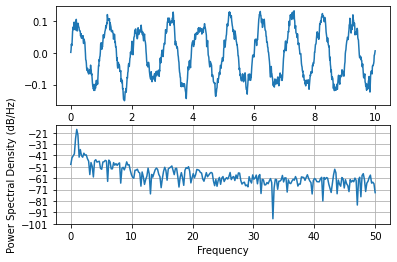

In [ ]:
import matplotlib.pyplot as plt 
import numpy as np 
import matplotlib.mlab as mlab 
import matplotlib.gridspec as gridspec 
  
# set random state for reproducibility 
np.random.seed(19695601) 
  
diff = 0.01
ax = np.arange(0, 10, diff) 
n = np.random.randn(len(ax)) 
by = np.exp(-ax / 0.05) 
  
cn = np.convolve(n, by) * diff 
cn = cn[:len(ax)] 
s = 0.1 * np.sin(2 * np.pi * ax) + cn 
  
plt.subplot(211) 
plt.plot(ax, s) 
plt.subplot(212) 
plt.psd(s, 512, 1 / diff) 
  
plt.show() 

Continuous Wavelet Transformation

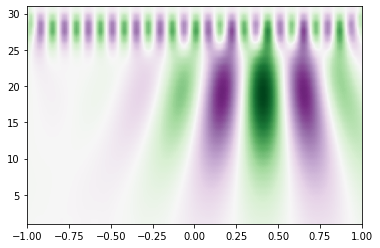

In [ ]:
from scipy import signal
import matplotlib.pyplot as plt
import numpy as np
t = np.linspace(-1, 1, 200, endpoint=False)
sig  = np.cos(2 * np.pi * 7 * t) + signal.gausspulse(t - 0.4, fc=2)
widths = np.arange(1, 31)
cwtmatr = signal.cwt(sig, signal.ricker, widths)
plt.imshow(cwtmatr, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())
plt.show()

## Multiscale decomposation with 1D morphology analysis
Author: Sili Wang

Morphology decomposation is a time domain signal processing techniqeu. It can extract the shape of the wave.

Structuring element
The basic idea in binary morphology is to probe an image with a simple, pre-defined shape, drawing conclusions on how this shape fits or misses the shapes in the image. This simple "probe" is called the structuring element, and is itself a binary image (i.e., a subset of the space or grid).

Basic operators
The basic operations are shift-invariant (translation invariant) operators strongly related to Minkowski addition.

Let E be an Euclidean space or an integer grid, and A a binary image in E.

Erosion

The erosion of the dark-blue square by a disk, resulting in the light-blue square.


When the structuring element B has a center (e.g., B is a disk or a square), and this center is located on the origin of E, then the erosion of A by B can be understood as the locus of points reached by the center of B when B moves inside A. For example, the erosion of a square of side 10, centered at the origin, by a disc of radius 2, also centered at the origin, is a square of side 6 centered at the origin.



Example application: Assume we have received a fax of a dark photocopy. Everything looks like it was written with a pen that is bleeding. Erosion process will allow thicker lines to get skinny and detect the hole inside the letter "o".

Dilation

The dilation of the dark-blue square by a disk, resulting in the light-blue square with rounded corners.


If B has a center on the origin, as before, then the dilation of A by B can be understood as the locus of the points covered by B when the center of B moves inside A. In the above example, the dilation of the square of side 10 by the disk of radius 2 is a square of side 14, with rounded corners, centered at the origin. The radius of the rounded corners is 2.



Example application: dilation is the dual operation of the erosion. Figures that are very lightly drawn get thick when "dilated". Easiest way to describe it is to imagine the same fax/text is written with a thicker pen.

Opening

The opening of the dark-blue square by a disk, resulting in the light-blue square with round corners.


Example application: Let's assume someone has written a note on a non-soaking paper and that the writing looks as if it is growing tiny hairy roots all over. Opening essentially removes the outer tiny "hairline" leaks and restores the text. The side effect is that it rounds off things. The sharp edges start to disappear.

Closing

The closing of the dark-blue shape (union of two squares) by a disk, resulting in the union of the dark-blue shape and the light-blue areas.

Look detials at: https://en.wikipedia.org/wiki/Mathematical_morphology


Pros:

It is a pure time domain analysis without domain transform.

It is a signal shape analysis tool, which is  sensitive to the upper or lower envalop of the signal on the given scale.

It has good performence to seperate the low frequency component of the signal.

The operater is simple and fast. 


Cons:

It is not suitable for high frequency component analysis.

The output is rely on the choose of structuring element.

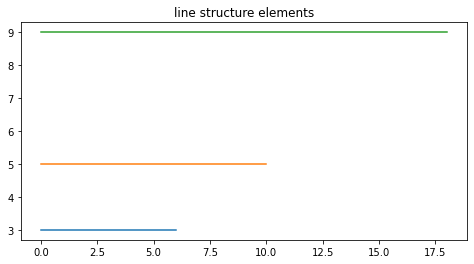

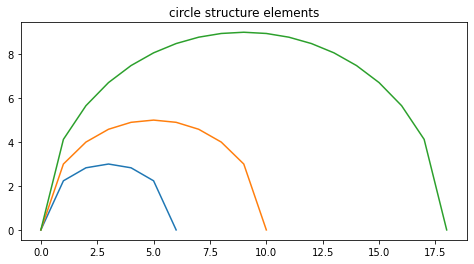

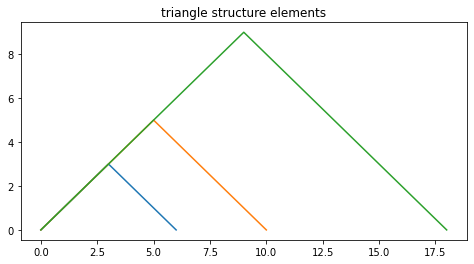

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def structure_element(radius,types):
  #type: 0-line,1-circle,2-triangle
  se = np.zeros(radius*2+1)
  if types == 0:
    se = se + radius
  if types == 1:
    for i in range(radius*2+1):
      se[i]= np.sqrt(radius*radius-(radius-i)*(radius-i))
  if types == 2:
    for i in range(radius+1):
      se[i] = i;
      se[radius*2-i] = i;
  return se

se1 = structure_element(3,0)
se2 = structure_element(5,0)
se3 = structure_element(9,0)
plt.figure(figsize=(8,4))
plt.title("line structure elements")
plt.plot(se1)
plt.plot(se2)
plt.plot(se3)
plt.show()

se1 = structure_element(3,1)
se2 = structure_element(5,1)
se3 = structure_element(9,1)
plt.figure(figsize=(8,4))
plt.title("circle structure elements")
plt.plot(se1)
plt.plot(se2)
plt.plot(se3)
plt.show()

se1 = structure_element(3,2)
se2 = structure_element(5,2)
se3 = structure_element(9,2)
plt.figure(figsize=(8,4))
plt.title("triangle structure elements")
plt.plot(se1)
plt.plot(se2)
plt.plot(se3)
plt.show()

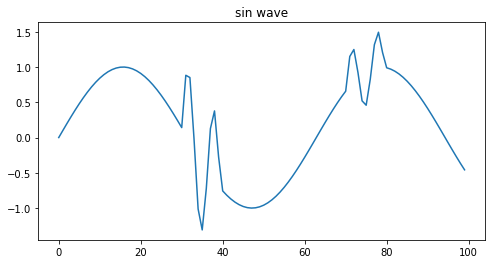

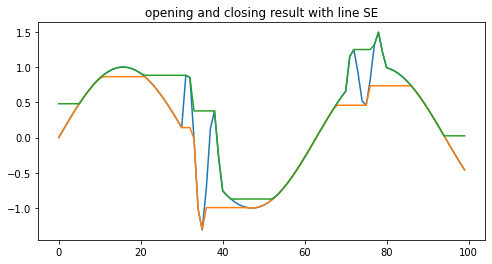

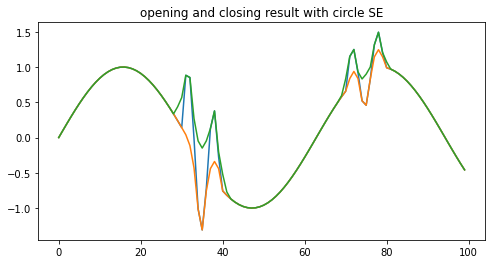

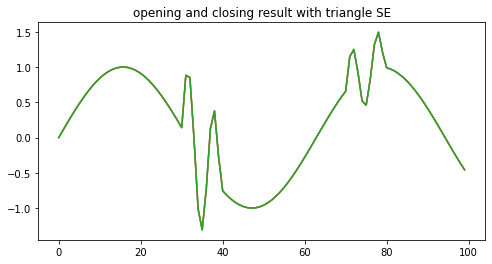

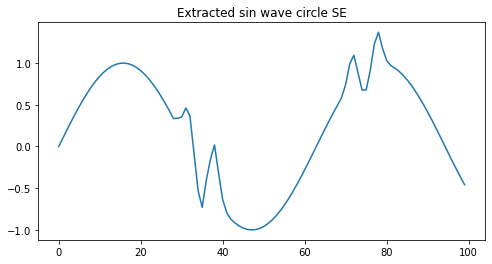

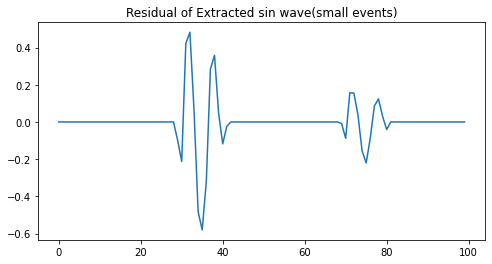

In [ ]:
time        = np.arange(0, 10, 0.1);
data   = np.sin(time)
data_add = np.sin(np.arange(0,10))
data[30:40] = data[30:40] + data_add
data[70:80] = data[70:80] + data_add*0.5
r = 5
plt.figure(figsize=(8,4))
plt.title("sin wave")
plt.plot(data)
plt.show()

def erosion(data,se):
  r = (len(se)-1)/2
  l = len(se)
  data = np.insert(data,0,data[0].repeat(r),0)
  data = np.append(data,data[-1].repeat(r))
  result = np.zeros(len(data)-len(se)+1)
  for i in range(len(data)-len(se)+1):
    result[i] = min(data[i:i+len(se)]-se)
  return result

def dilation(data,se):
  r = (len(se)-1)/2
  l = len(se)
  data = np.insert(data,0,data[0].repeat(r),0)
  data = np.append(data,data[-1].repeat(r))
  result = np.zeros(len(data)-len(se)+1)
  for i in range(len(data)-len(se)+1):
    result[i] = max(data[i:i+len(se)]+se)
  return result

def opening(data,se):
  data = erosion(data,se)
  data = dilation(data,se)
  return data

def closing(data,se):
  data = dilation(data,se)
  data = erosion(data,se)
  return data

se = structure_element(5,0)
data1 = opening(data,se)
data2 = closing(data,se)

plt.figure(figsize=(8,4))
plt.title("opening and closing result with line SE")
plt.plot(data)
plt.plot(data1)
plt.plot(data2)
plt.show()

se = structure_element(5,1)
data1 = opening(data,se)
data2 = closing(data,se)

plt.figure(figsize=(8,4))
plt.title("opening and closing result with circle SE")
plt.plot(data)
plt.plot(data1)
plt.plot(data2)
plt.show()

se = structure_element(5,2)
data1 = opening(data,se)
data2 = closing(data,se)

plt.figure(figsize=(8,4))
plt.title("opening and closing result with triangle SE")
plt.plot(data)
plt.plot(data1)
plt.plot(data2)
plt.show()

se = structure_element(5,1)
data1 = opening(data,se)
data2 = closing(data,se)
sin_extract = (data1+data2)/2
residual = data - sin_extract

plt.figure(figsize=(8,4))
plt.title("Extracted sin wave circle SE")
plt.plot(sin_extract)
plt.show()

plt.figure(figsize=(8,4))
plt.title("Residual of Extracted sin wave(small events)")
plt.plot(residual)
plt.show()

/usr/local/lib/python3.6/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning: Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning)


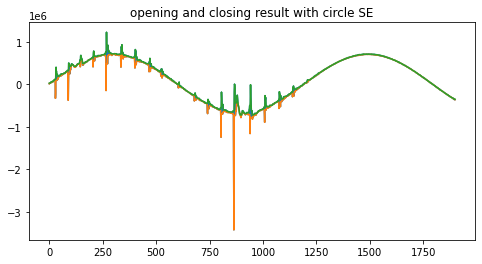

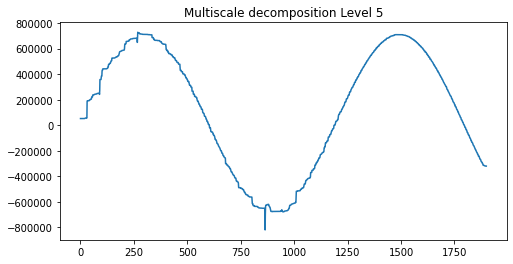

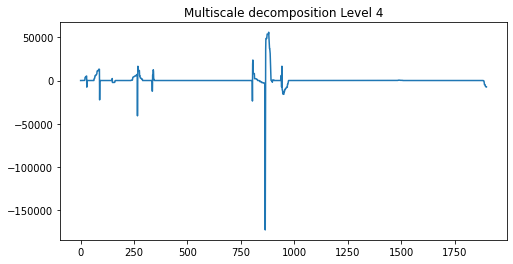

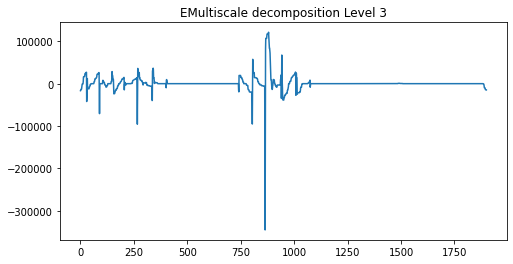

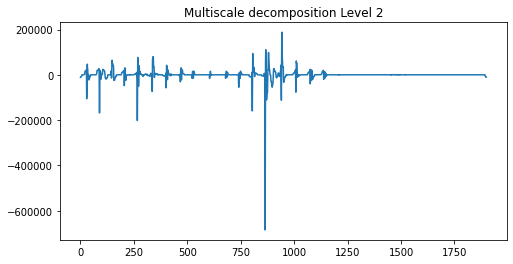

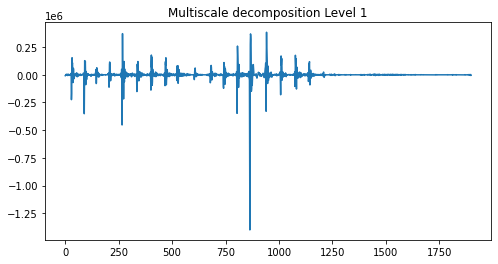

In [ ]:
ip = "sensorweb.us" 
unit = "b8:27:eb:48:68:fa" # FloorB
stampIni = "2020-08-22T00:42:41.000Z" # UTC time = EST time + 4
stampEnd = "2020-08-22T00:43:00.000Z"
client = InfluxDBClient(ip, "8086", "sili", "sensorweb", "floorseis",   True)
# Check FloorB at http://3.136.84.223:3000/d/3HdIpxGMz/s-house-dashboard-raw-data-only?orgId=1&from=1594149493945&to=1594149503005

query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\')  and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\'   '
result = client.query(query)
points = list(result.get_points())
values =  map(operator.itemgetter('value'), points)
times  =  map(operator.itemgetter('time'),  points)
data = np.array(list(values))
if(len(data) == 0):
  print("No data in the chosen time range!")
  quit()
time        = np.arange(0, 10, 10/len(data));
data   = data + np.sin(time)*max(data)


se = structure_element(3,1)
data1 = opening(data,se)
data2 = closing(data,se)

plt.figure(figsize=(8,4))
plt.title("opening and closing result with circle SE")
plt.plot(data)
plt.plot(data1)
plt.plot(data2)
plt.show()

sin_extract1 = (data1+data2)/2
residual1 = data - sin_extract1

se = structure_element(7,1)
data1 = opening(sin_extract1,se)
data2 = closing(sin_extract1,se)
sin_extract2 = (data1+data2)/2
residual2 = sin_extract1 - sin_extract2


se = structure_element(15,1)
data1 = opening(sin_extract2,se)
data2 = closing(sin_extract2,se)
sin_extract3 = (data1+data2)/2
residual3 = sin_extract2 - sin_extract3

se = structure_element(15,1)
data1 = opening(sin_extract3,se)
data2 = closing(sin_extract3,se)
sin_extract4 = (data1+data2)/2
residual4 = sin_extract3 - sin_extract4

plt.figure(figsize=(8,4))
plt.title("Multiscale decomposition Level 5")
plt.plot(sin_extract4)
plt.show()

plt.figure(figsize=(8,4))
plt.title("Multiscale decomposition Level 4")
plt.plot(residual4)
plt.show()

plt.figure(figsize=(8,4))
plt.title("EMultiscale decomposition Level 3")
plt.plot(residual3)
plt.show()

plt.figure(figsize=(8,4))
plt.title("Multiscale decomposition Level 2")
plt.plot(residual2)
plt.show()


plt.figure(figsize=(8,4))
plt.title("Multiscale decomposition Level 1")
plt.plot(residual1)
plt.show()

## Orthogonal Matching Pursuit
*Author: Kayvon Ghahremani*

Orthogonal Matching Pursuit (OMP) is a method of sparse signal approximation which finds the "best matching" projections of multidimensional data onto the span of an over-complete (i.e., redundant) dictionary *D*. It is based on a greedy algorithm that includes at each step the atom most highly correlated with the current residual. Matching pursuit (MP), the most used greedy algorithm, finds locally the optimal solution that is also close enough to a global optimal solution at each iteration. OMP is similar to the simpler matching pursuit method, but better in that at each iteration, the residual is recomputed using an orthogonal projection on the space of the previously chosen dictionary elements.

A more in-depth explanation of OMP can be found here: https://medium.com/@venali/conventional-guide-to-supervised-learning-with-scikit-learn-orthogonal-matching-pursuit-omp-d3de1ffef841


Pros:

* Orthogonal Matching Pursuit outperforms matching pursuit by updating all activated coefficients simultaneously in generating the orthogonal projection of the selected dictionary functions at every iteration. 

* Other direct approaches to sparse approximation, such as combinatorial optimization, are complex and require important computational resources to perform the approximation than OMP.

Cons:

* Orthogonal Matching Pursuit, however, requires more computational resources then Matching Pursuit due to extra calculations.

* The dictionary needs to be made beforehand, as well as it needs to be made overcomplete (or sometimes redundant). Because the vectors in the dictionary are not a linearly independent set, the signal representation in the dictionary is not unique. However, by creating a redundant dictionary, you can expand your signal in a set of vectors that adapt to the time-frequency or time-scale characteristics of your signal.

In [ ]:
# This example: https://scikit-learn.org/stable/auto_examples/linear_model/plot_omp.html#sphx-glr-auto-examples-linear-model-plot-omp-py

import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import OrthogonalMatchingPursuit
from sklearn.linear_model import OrthogonalMatchingPursuitCV
from sklearn.datasets import make_sparse_coded_signal

n_components, n_features = 512, 100
n_nonzero_coefs = 17

# generate the data

# y = Xw
# |x|_0 = n_nonzero_coefs

y, X, w = make_sparse_coded_signal(n_samples=1,
                                   n_components=n_components,
                                   n_features=n_features,
                                   n_nonzero_coefs=n_nonzero_coefs,
                                   random_state=0)

idx, = w.nonzero()

# distort the clean signal
y_noisy = y + 0.05 * np.random.randn(len(y))

# plot the sparse signal
plt.figure(figsize=(7, 7))
plt.subplot(4, 1, 1)
plt.xlim(0, 512)
plt.title("Sparse signal")
plt.stem(idx, w[idx], use_line_collection=True)

# plot the noise-free reconstruction
omp = OrthogonalMatchingPursuit(n_nonzero_coefs=n_nonzero_coefs)
omp.fit(X, y)
coef = omp.coef_
idx_r, = coef.nonzero()
plt.subplot(4, 1, 2)
plt.xlim(0, 512)
plt.title("Recovered signal from noise-free measurements")
plt.stem(idx_r, coef[idx_r], use_line_collection=True)

# plot the noisy reconstruction
omp.fit(X, y_noisy)
coef = omp.coef_
idx_r, = coef.nonzero()
plt.subplot(4, 1, 3)
plt.xlim(0, 512)
plt.title("Recovered signal from noisy measurements")
plt.stem(idx_r, coef[idx_r], use_line_collection=True)

# plot the noisy reconstruction with number of non-zeros set by CV
omp_cv = OrthogonalMatchingPursuitCV()
omp_cv.fit(X, y_noisy)
coef = omp_cv.coef_
idx_r, = coef.nonzero()
plt.subplot(4, 1, 4)
plt.xlim(0, 512)
plt.title("Recovered signal from noisy measurements with CV")
plt.stem(idx_r, coef[idx_r], use_line_collection=True)

plt.subplots_adjust(0.06, 0.04, 0.94, 0.90, 0.20, 0.38)
plt.suptitle('Sparse signal recovery with Orthogonal Matching Pursuit',
             fontsize=16)
plt.show()

# Detection and Segmentation

It is important that anomaly detectors are generally categorized into **outlier** and **change-point** detectors. Outliers are some spiky "local" data points which are suddenly observed in a series of normal samples, and Local Outlier Detection is an algorithm to detect outliers. On the other hand, change-points indicate "global" change on a wider scale in terms of characteristics of data points.

* A collection of anomaly detection software: https://github.com/rob-med/awesome-TS-anomaly-detection
* ruptures is a Python library for off-line change point detection. This package provides methods for the analysis and segmentation of non-stationary signals. Implemented algorithms include exact and approximate detection for various parametric and non-parametric models. ruptures focuses on ease of use by providing a well-documented and consistent interface. In addition, thanks to its modular structure, different algorithms and models can be connected and extended within this package. https://github.com/deepcharles/ruptures
* Time series of price anomaly detection: https://towardsdatascience.com/time-series-of-price-anomaly-detection-13586cd5ff46
* EGADS (Extensible Generic Anomaly Detection System) is an open-source Java package to automatically detect anomalies in large scale time-series data. EGADS is meant to be a library that contains a number of anomaly detection techniques applicable to many use-cases in a single package with the only dependency being Java. EGADS works by first building a time-series model which is used to compute the expected value at time t. Then a number of errors E are computed by comparing the expected value with the actual value at time t. EGADS automatically determines thresholds on E and outputs the most probable anomalies. EGADS library can be used in a wide variety of contexts to detect outliers and change points in time-series that can have a various seasonal, trend and noise components. https://github.com/yahoo/egads  https://research.yahoo.com/news/announcing-open-source-egads-scalable-configurable-and-novel-anomaly-detection-system

https://s.yimg.com/ge/labs/v2/uploads/kdd2015.pdf
* Seimic Data Trigger/Picker Tutorial: https://docs.obspy.org/tutorial/code_snippets/trigger_tutorial.html (STA/LTA, AR picker, etc)
* Signal processing (scipy.signal): https://docs.scipy.org/doc/scipy/reference/signal.html 
  * Find peaks at https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.find_peaks.html
* [Timeseries anomaly detection using an Autoencoder](https://keras.io/examples/timeseries/timeseries_anomaly_detection/)



## Comparing anomaly detection algorithms for outlier detection on 2D toy datasets

https://scikit-learn.org/stable/auto_examples/miscellaneous/plot_anomaly_comparison.html?highlight=anomaly%20detection

This example shows characteristics of different anomaly detection algorithms on 2D datasets. Datasets contain one or two modes (regions of high density) to illustrate the ability of algorithms to cope with multimodal data.

For each dataset, 15% of samples are generated as random uniform noise. This proportion is the value given to the nu parameter of the OneClassSVM and the contamination parameter of the other outlier detection algorithms. Decision boundaries between inliers and outliers are displayed in black except for Local Outlier Factor (LOF) as it has no predict method to be applied on new data when it is used for outlier detection.

The sklearn.svm.OneClassSVM is an Unsupervised Outlier Detection method. It is known to be sensitive to outliers and thus does not perform very well for outlier detection. This estimator is best suited for novelty detection when the training set is not contaminated by outliers. That said, outlier detection in high-dimension, or without any assumptions on the distribution of the inlying data is very challenging, and a One-class SVM might give useful results in these situations depending on the value of its hyperparameters.

sklearn.covariance.EllipticEnvelope detects outliers in a Gaussian distributed dataset. It assumes the data is Gaussian and learns an ellipse. It thus degrades when the data is not unimodal. Notice however that this estimator is robust to outliers. 



sklearn.ensemble.IsolationForest and sklearn.neighbors.LocalOutlierFactor seem to perform reasonably well for multi-modal data sets. The advantage of sklearn.neighbors.LocalOutlierFactor over the other estimators is shown for the third data set, where the two modes have different densities. This advantage is explained by the local aspect of LOF, meaning that it only compares the score of abnormality of one sample with the scores of its neighbors.

Finally, for the last data set, it is hard to say that one sample is more abnormal than another sample as they are uniformly distributed in a hypercube. Except for the sklearn.svm.OneClassSVM which overfits a little, all estimators present decent solutions for this situation. In such a case, it would be wise to look more closely at the scores of abnormality of the samples as a good estimator should assign similar scores to all the samples.

While these examples give some intuition about the algorithms, this intuition might not apply to very high dimensional data.

Finally, note that parameters of the models have been here handpicked but that in practice they need to be adjusted. In the absence of labelled data, the problem is completely unsupervised so model selection can be a challenge.

Automatically created module for IPython interactive environment


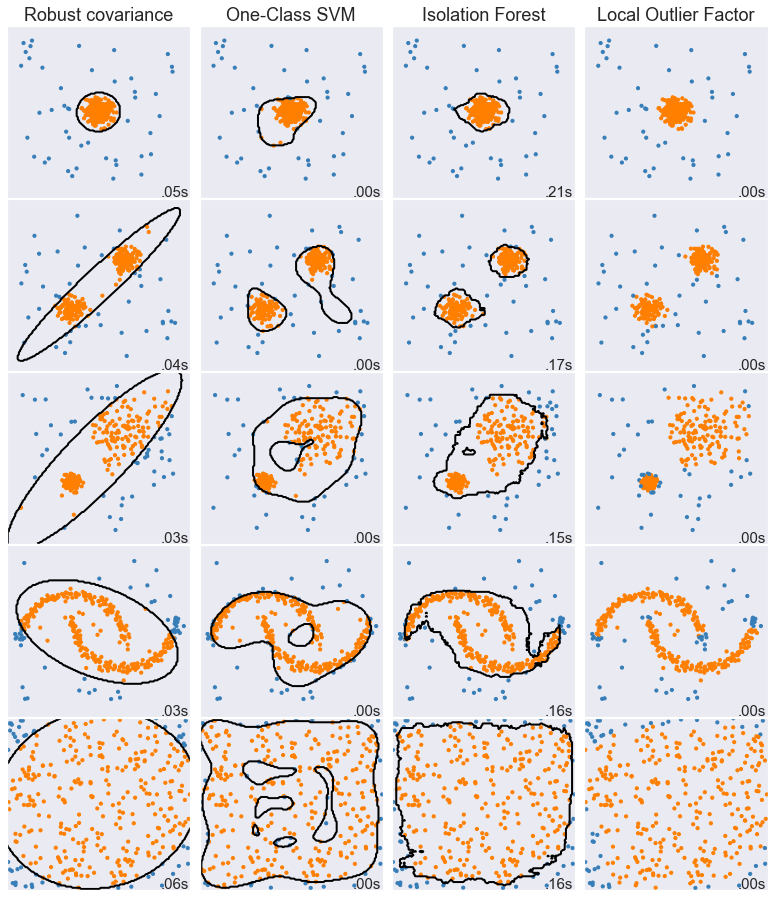

In [ ]:
# Author: Alexandre Gramfort <alexandre.gramfort@inria.fr>
#         Albert Thomas <albert.thomas@telecom-paristech.fr>
# License: BSD 3 clause
# Comparing anomaly detection algorithms for outlier detection on toy datasets

import time

import numpy as np
import matplotlib
import matplotlib.pyplot as plt

from sklearn import svm
from sklearn.datasets import make_moons, make_blobs
from sklearn.covariance import EllipticEnvelope
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor

print(__doc__)

matplotlib.rcParams['contour.negative_linestyle'] = 'solid'
# Mini Batch Mean (UNFINISHED)
# Example settings
n_samples = 300
outliers_fraction = 0.15
n_outliers = int(outliers_fraction * n_samples)
n_inliers = n_samples - n_outliers

# define outlier/anomaly detection methods to be compared
anomaly_algorithms = [
    ("Robust covariance", EllipticEnvelope(contamination=outliers_fraction)),
    ("One-Class SVM", svm.OneClassSVM(nu=outliers_fraction, kernel="rbf",
                                      gamma=0.1)),
    ("Isolation Forest", IsolationForest(contamination=outliers_fraction,
                                         random_state=42)),
    ("Local Outlier Factor", LocalOutlierFactor(
        n_neighbors=35, contamination=outliers_fraction))]

# Define datasets
blobs_params = dict(random_state=0, n_samples=n_inliers, n_features=2)
datasets = [
    make_blobs(centers=[[0, 0], [0, 0]], cluster_std=0.5,
               **blobs_params)[0],
    make_blobs(centers=[[2, 2], [-2, -2]], cluster_std=[0.5, 0.5],
               **blobs_params)[0],
    make_blobs(centers=[[2, 2], [-2, -2]], cluster_std=[1.5, .3],
               **blobs_params)[0],
    4. * (make_moons(n_samples=n_samples, noise=.05, random_state=0)[0] -
          np.array([0.5, 0.25])),
    14. * (np.random.RandomState(42).rand(n_samples, 2) - 0.5)]

# Compare given classifiers under given settings
xx, yy = np.meshgrid(np.linspace(-7, 7, 150),
                     np.linspace(-7, 7, 150))

plt.figure(figsize=(len(anomaly_algorithms) * 2 + 3, 12.5))
plt.subplots_adjust(left=.02, right=.98, bottom=.001, top=.96, wspace=.05,
                    hspace=.01)

plot_num = 1
rng = np.random.RandomState(42)

for i_dataset, X in enumerate(datasets):
    # Add outliers
    X = np.concatenate([X, rng.uniform(low=-6, high=6,
                       size=(n_outliers, 2))], axis=0)

    for name, algorithm in anomaly_algorithms:
        t0 = time.time()
        algorithm.fit(X)
        t1 = time.time()
        plt.subplot(len(datasets), len(anomaly_algorithms), plot_num)
        if i_dataset == 0:
            plt.title(name, size=18)

        # fit the data and tag outliers
        if name == "Local Outlier Factor":
            y_pred = algorithm.fit_predict(X)
        else:
            y_pred = algorithm.fit(X).predict(X)

        # plot the levels lines and the points
        if name != "Local Outlier Factor":  # LOF does not implement predict
            Z = algorithm.predict(np.c_[xx.ravel(), yy.ravel()])
            Z = Z.reshape(xx.shape)
            plt.contour(xx, yy, Z, levels=[0], linewidths=2, colors='black')

        colors = np.array(['#377eb8', '#ff7f00'])
        plt.scatter(X[:, 0], X[:, 1], s=10, color=colors[(y_pred + 1) // 2])

        plt.xlim(-7, 7)
        plt.ylim(-7, 7)
        plt.xticks(())
        plt.yticks(())
        plt.text(.99, .01, ('%.2fs' % (t1 - t0)).lstrip('0'),
                 transform=plt.gca().transAxes, size=15,
                 horizontalalignment='right')
        plot_num += 1

plt.show()

## Event detection and segmentation based on Standard Deviation

In this example, we show an event detection and separation exmaple of seismic data containing foot steps.

Pros:

It is easy to implemnt. 

It works well when SNR is high.


Cons:

It will fail when SNR is low or the amplitude of events is not stable.

It is hard to set up a property threshold.


maximum level is 11


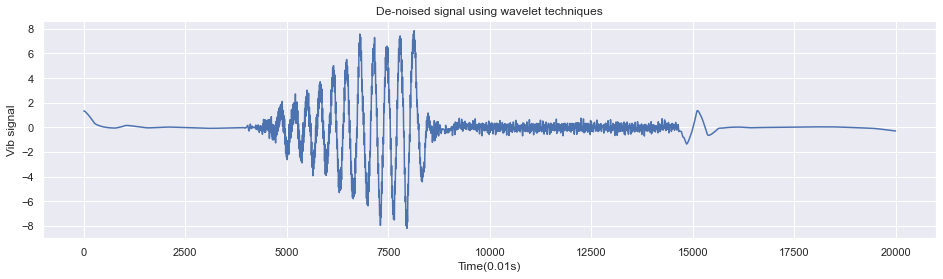

In [ ]:
import numpy as np
import csv
import matplotlib.pyplot as plt
import pywt
from influxdb import InfluxDBClient
import operator
import scipy.signal as sg
import scipy as sp

def wdenoise(data, method, threshold):
    # Create wavelet object and define parameters
    w = pywt.Wavelet(method)
    maxlev = pywt.dwt_max_level(len(data), w.dec_len)
    # maxlev = 2 # Override if desired
    print("maximum level is " + str(maxlev))
    # Decompose into wavelet components, to the level selected:
    coeffs = pywt.wavedec(data, method, level=maxlev)  
    #cA = 0.0
    #cA = pywt.threshold(cA, threshold*max(cA))
    # plt.figure()
    for i in range(1, len(coeffs)):
        # plt.subplot(maxlev, 1, i)
        # plt.plot(coeffs[i])
        coeffs[i] = pywt.threshold(coeffs[i], threshold*max(coeffs[i]))
        # plt.plot(coeffs[i])
    datarec = pywt.waverec(coeffs, method)
    return datarec


if(len(data) == 0):
  print("No data in the chosen time range!")
  quit()

# denoising with wavelet
datarec = wdenoise(data, 'sym4', 0.24) # 
#datarec = data
# foot step separation
mintime = 0
maxtime = mintime + len(data) + 1
ind = len(data)

## window size
window_size = 10
FLAG = False
threshold_of_std = 300
data_std_list = []
green_line = []
red_line = []
## run over the data
for i in range(0,len(datarec)-window_size,window_size):
    # print(datarec[i:i+window_size])
    window_data_std = np.std(np.asarray(datarec[i:i+window_size]))
    data_std_list.append(window_data_std)
    # exit()

    if FLAG == False:
        if window_data_std > threshold_of_std:
            FLAG = True
            green_line.append(i)
        else:
            pass

    else:
        if window_data_std <= threshold_of_std:
            FLAG = False
            red_line.append(i)

# print(max(see))
y_min = min(datarec)
y_max = max(datarec)

plt.figure(figsize=(16, 4))
plt.xlabel('Time(0.01s)')
plt.ylabel('Vib signal')
plt.title("De-noised signal using wavelet techniques")
plt.plot(datarec) # [mintime:maxtime-1])
plt.vlines(green_line, y_min, y_max, 'g', '--', label='example')
plt.vlines(red_line, y_min, y_max, 'r', '--', label='example')
plt.show()



### Example of Fall Down Signal detection among Foot Step signals
In this example, we demonstrat a Fall Down event detection which's signal is among normal Foot Step signals.

Considering the feature of fall down event, we could make use of event duration and signal strength to detect it.

Note that due to the time difference, you may have to change the fetch time accordinally in the influxdb part to draw out the data in this link (http://18.222.223.195:3000/d/VmjKXrXWz/bed-dashboard?orgId=1&var-mac=b8:27:eb:fa:ca:df&from=1594753719463&to=1594753746599&fullscreen&panelId=18).

/usr/local/lib/python3.6/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning: Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning)


No data in the chosen time range!
maximum level is 0
0 fall down events are detected!


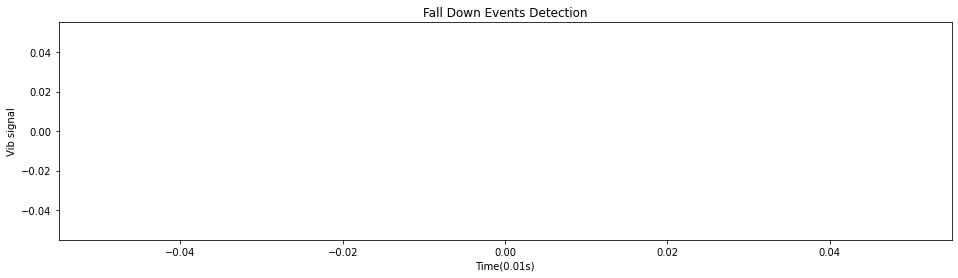

In [ ]:
#author='Ming'
#For detecting floor activity
#
!pip install influxdb
import numpy as np
import csv
import matplotlib.pyplot as plt
import pywt
from influxdb import InfluxDBClient
import operator

def wdenoise(data, method, threshold):
    # Create wavelet object and define parameters
    w = pywt.Wavelet(method)
    maxlev = pywt.dwt_max_level(len(data), w.dec_len)
    # maxlev = 2 # Override if desired
    print("maximum level is " + str(maxlev))
    # Decompose into wavelet components, to the level selected:
    coeffs = pywt.wavedec(data, method, level=maxlev)
    #cA = 0.0
    #cA = pywt.threshold(cA, threshold*max(cA))
    # plt.figure()
    for i in range(1, len(coeffs)):
        # plt.subplot(maxlev, 1, i)
        # plt.plot(coeffs[i])
        coeffs[i] = pywt.threshold(coeffs[i], threshold*max(coeffs[i]))
        # plt.plot(coeffs[i])
    datarec = pywt.waverec(coeffs, method)
    return datarec

def main():

    #### data init
    data = []


#### Change this part accordinally to fetch the data showing in following link
# http://18.222.223.195:3000/d/VmjKXrXWz/bed-dashboard?orgId=1&var-mac=b8:27:eb:fa:ca:df&from=1594753719463&to=1594753746599&fullscreen&panelId=18
    ip = "sensorweb.us"
    unit = "b8:27:eb:fa:ca:df" # FloorB
    stampIni = "2020-07-15T11:08:00.000Z" # UTC time = EST time + 4
    stampEnd = "2020-07-15T12:11:00.000Z"
    client = InfluxDBClient(ip, "8086", "test", "sensorweb", "shake",  ssl=True)


    query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\')  and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\'   '
    result = client.query(query)
    points = list(result.get_points())
    values =  map(operator.itemgetter('value'), points)
    times  =  map(operator.itemgetter('time'),  points)
    data = np.array(list(values))
    if(len(data) == 0):
      print("No data in the chosen time range!")
      quit()


    datarec = wdenoise(data, 'sym4', 0.24) #


    mintime = 0
    maxtime = mintime + len(data) + 1

    # plt.figure()
    # plt.plot(range(len(data)), data[mintime:maxtime])
    # plt.xlabel('Time(0.01s)')
    # plt.ylabel('Vib signal')
    # plt.title("Raw signal")



####### event detection
    ## window size
    fall_duration = 120 #ms
    window_size = 10
    FLAG = False
    threshold_of_std = 300
    data_std_list = []
    green_line = []
    red_line = []
    ## run over the data
    counter = 0
    for i in range(0,len(datarec)-window_size,window_size):

        # print(datarec[i:i+window_size])
        window_data_std = np.std(np.asarray(datarec[i:i+window_size]))
        data_std_list.append(window_data_std)
        # exit()

###############

        if window_data_std > threshold_of_std:
            if FLAG == False:
                FLAG = True
                green_line.append(i)

                counter = 0
            else:
                pass

        else:
            if FLAG == True:
                FLAG = False

                if counter >= fall_duration/window_size:
                    red_line.append(i)
                    # counter = 0
                else:
                    green_line.pop()

        counter += 1
        # print(green_line)

    # print(max(see))
    # y_min = min(datarec)
    # y_max = max(datarec)

    print("%d fall down events are detected!"%len(green_line))


    plt.figure(figsize=(16, 4))
    plt.plot(range(len(data)), data[mintime:maxtime])
    plt.xlabel('Time(0.01s)')
    plt.ylabel('Vib signal')
    plt.title("Fall Down Events Detection")
    plt.vlines(green_line, -500000, 500000, 'g', '--', label='example')
    plt.vlines(red_line, -500000, 500000, 'r', '--', label='example')

    plt.show()

if __name__ == '__main__':
    main()


## CUSUM

The Cumulative sum (CUSUM) algorithm is a classical technique for monitoring change detection. Change detection refers to procedures to identify abrupt changes in a phenomenon (Basseville and Nikiforov 1993, Gustafsson 2000). By abrupt change it is meant any difference in relation to previous known data faster than expected of some characteristic of the data such as amplitude, mean, variance, frequency, etc.



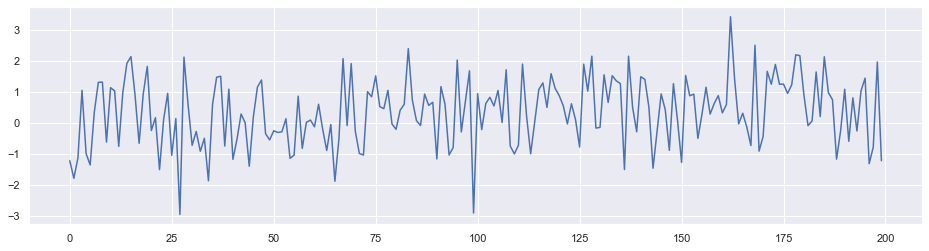

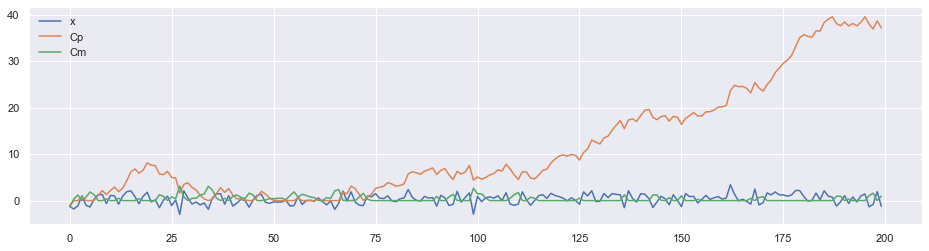

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def cusum(x,mean=0,K=0):
    """Tabular CUSUM per Montgomery,D. 1996 "Introduction to Statistical Process Control" p318 
    x    : series to analyze
    mean : expected process mean
    K    : reference value, allowance, slack value-- suggest K=1/2 of the shift to be detected.

    Returns:
    x  Original series
    Cp positive CUSUM
    Cm negative CUSUM
    """
    Cp=(x*0).copy()
    Cm=Cp.copy()
    for ii in np.arange(len(x)):
        if ii == 0:
            Cp[ii]=x[ii]
            Cm[ii]=x[ii]
        else:
            Cp[ii]=np.max([0,x[ii]-(mean+K)+Cp[ii-1]])
            Cm[ii]=np.max([0,(mean-K)-x[ii]+Cm[ii-1]])
    return({'x':x, 'Cp': Cp, 'Cm': Cm})

x = np.random.randn(200)+np.repeat([0,0.5],100)

# user other data
#x = data

plt.figure(figsize=(16, 4))
plt.plot(x)

pd.DataFrame(cusum(x,K=0.25)).plot(figsize=(16, 4))

## Changing point detection with ruptures 

ruptures is a Python library for off-line change point detection. This package provides methods for the analysis and segmentation of non-stationary signals. Implemented algorithms include exact and approximate detection for various parametric and non-parametric models

C. Truong, L. Oudre, N. Vayatis. Selective review of offline change point detection methods. Signal Processing, 167:107299, 2020. [pdf](http://www.laurentoudre.fr/publis/TOG-SP-19.pdf)

In [ ]:
!pip install ruptures

[203, 417, 611, 801, 1000]


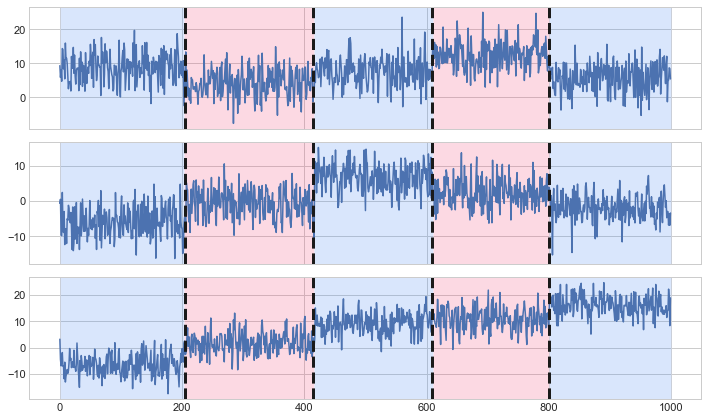

In [ ]:
import matplotlib.pyplot as plt
# https://charles.doffy.net/ruptures/build/html/index.html
import ruptures as rpt

# generate signal
n_samples, dim, sigma = 1000, 3, 4
n_bkps = 4  # number of breakpoints
signal, bkps = rpt.pw_constant(n_samples, dim, n_bkps, noise_std=sigma)
print (bkps)

# use the data from above
# signal = data
# bkps = [100, 300, 500, 700]
# # print(signal, bkps)

# detection
algo = rpt.Pelt(model="rbf").fit(signal)
result = algo.predict(pen=10)

# display
rpt.display(signal, bkps, result)
plt.show()

Example of changing point detection with ruptures

In [ ]:
!pip install ruptures

In [ ]:
import matplotlib.pyplot as plt
# https://charles.doffy.net/ruptures/build/html/index.html
import ruptures as rpt

# generate signal
n_samples, dim, sigma = 1000, 3, 4
n_bkps = 4  # number of breakpoints
signal, bkps = rpt.pw_constant(n_samples, dim, n_bkps, noise_std=sigma)

# detection
algo = rpt.Pelt(model="rbf").fit(signal)
result = algo.predict(pen=10)

# display
rpt.display(signal, bkps, result)
plt.show()

## Anomaly Detection Toolkit (ADTK)

Github: https://github.com/arundo/adtk

Website (Quick Start, Examples, User Guide): https://arundo-adtk.readthedocs-hosted.com/en/stable/index.html

Anomaly Detection Toolkit (ADTK) is a Python package for unsupervised / rule-based time series anomaly detection. It contains many different methods for anomaly detection.

As the nature of anomaly varies over different cases, a model may not work universally for all anomaly detection problems. Choosing and combining detection algorithms (detectors), feature engineering methods (transformers), and ensemble methods (aggregators) properly is the key to build an effective anomaly detection model.

The package offers a set of common detectors, transformers and aggregators with unified APIs, as well as pipe classes that connect them together into models. It also provides some functions to process and visualize time series and anomaly events.

In [ ]:
!pip install adtk

In [ ]:
import csv
import pywt
from influxdb import InfluxDBClient
import operator
import scipy.signal as sg
import scipy as sp
import sklearn

import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch

import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import numpy as np
from adtk.data import validate_series

ip = "sensorweb.us" 
unit = "b8:27:eb:76:15:20" # FloorB
stampIni = "2020-07-07T19:18:14.000Z" # UTC time = EST time + 4
stampEnd = "2020-07-07T19:18:22.000Z"
client = InfluxDBClient(ip, "8086", "test", "sensorweb", "shake",ssl=True)
# Check FloorB at http://3.136.84.223:3000/d/3HdIpxGMz/s-house-dashboard-raw-data-only?orgId=1&from=1594149493945&to=1594149503005

query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\')  and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\'   '
result = client.query(query)
points = list(result.get_points())
values =  map(operator.itemgetter('value'), points)
times  =  map(operator.itemgetter('time'),  points)
data = np.array(list(values))
times = np.array(list(times))
if(len(data) == 0):
  print("No data in the chosen time range!")
  quit()
index = pd.DatetimeIndex(times)
data = pd.Series(data,index=index)

from adtk.visualization import plot

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/urllib3/connectionpool.py:986: InsecureRequestWarning: Unverified HTTPS request is being made to host 'sensorweb.us'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning,


### Volatility Shift Detector

VolatilityShiftAD detects shift of volatility level by tracking the difference between standard deviations at two sliding time windows next to each other.

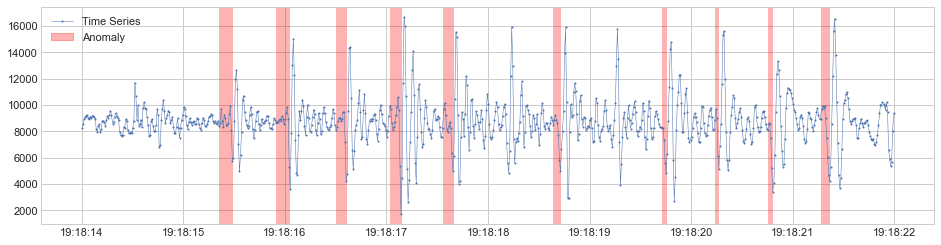

In [ ]:
from adtk.detector import VolatilityShiftAD
volatility_shift_ad = VolatilityShiftAD(c=2.0, side='positive', window=15)
anomalies = volatility_shift_ad.fit_detect(data)
plot(data, anomaly=anomalies, anomaly_color='red');

### Threshold Detector

ThresholdAD compares each time series value with given thresholds.

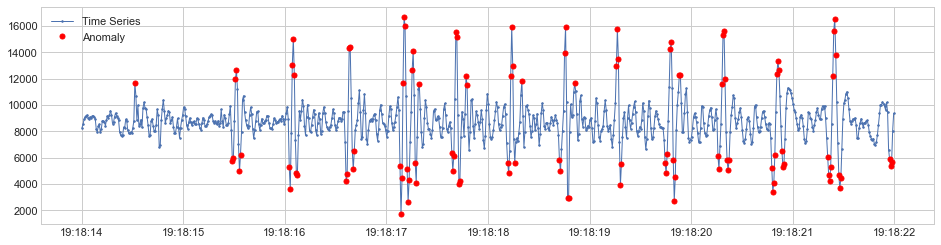

In [ ]:
from adtk.detector import ThresholdAD
threshold_ad = ThresholdAD(high=11500, low=6500)
anomalies = threshold_ad.detect(data)
plot(data, anomaly=anomalies, ts_linewidth=1, ts_markersize=3, anomaly_markersize=5, anomaly_color='red', anomaly_tag="marker");

### Persist Detector

PersistAD compares each time series value with its previous values.

In the following example, we detect anomalous positive changes.

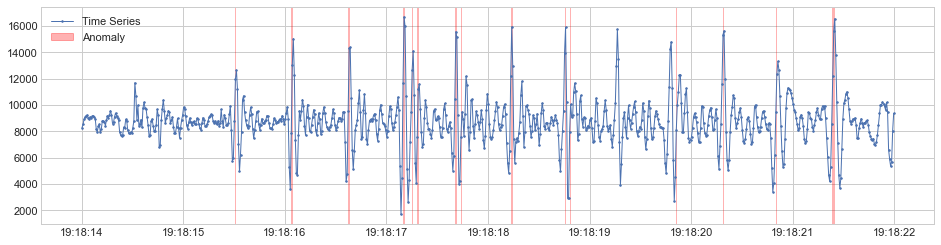

In [ ]:
from adtk.detector import PersistAD
persist_ad = PersistAD(c=2.0, side='positive')
anomalies = persist_ad.fit_detect(data)
plot(data, anomaly=anomalies, ts_linewidth=1, ts_markersize=3, anomaly_color='red');

### Quantile Detector

QuantileAD compares each time series value with historical quantiles.

In the following example, we detect time points when temperature is above 99% percentile or below 1% percentile.

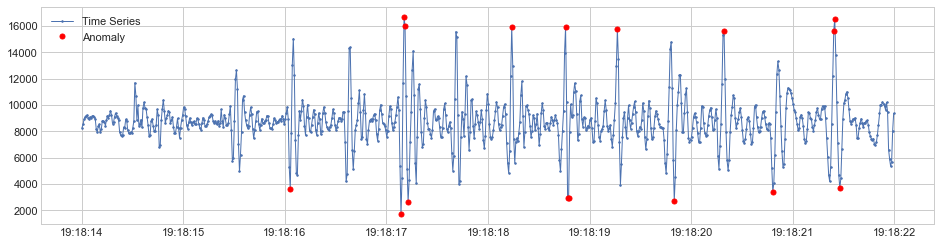

In [ ]:
from adtk.detector import QuantileAD
quantile_ad = QuantileAD(high=0.99, low=0.01)
anomalies = quantile_ad.fit_detect(data)
plot(data, anomaly=anomalies, ts_linewidth=1, ts_markersize=3, anomaly_markersize=5, anomaly_color='red', anomaly_tag="marker");


### Inter-Quartile Range

InterQuartilreRangeAD is another widely used detector based on simple historical statistics is based on interquartile range (IQR). When a value is out of the range defined by [𝑄1−𝑐×𝐼𝑄𝑅, 𝑄3+𝑐×𝐼𝑄𝑅] where 𝐼𝑄𝑅=𝑄3−𝑄1 is the difference between 25% and 75% quantiles. This detector is usually preferred to QuantileAD in the case where only a tiny portion or even none of training data is anomalous.

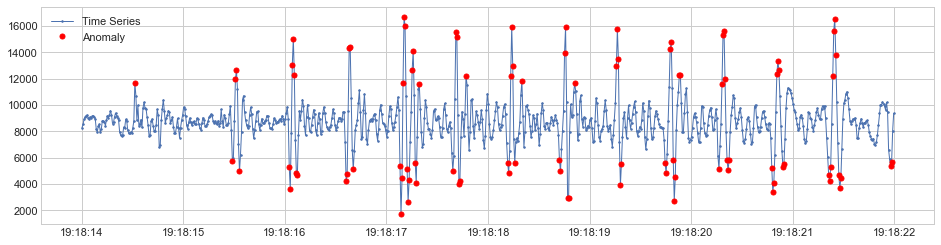

In [ ]:
from adtk.detector import InterQuartileRangeAD
iqr_ad = InterQuartileRangeAD(c=1.5)
anomalies = iqr_ad.fit_detect(data)
plot(data, anomaly=anomalies, ts_linewidth=1, ts_markersize=3, anomaly_markersize=5, anomaly_color='red', anomaly_tag="marker");

## Isolation Forests For Anomaly Detection
*Author: Soumya Pal*

Link for reference: https://towardsdatascience.com/time-series-of-price-anomaly-detection-13586cd5ff46

Isolation Forest detects anomalies purely based on the fact that anomalies are data points that are few and different. The anomalies isolation is implemented without employing any distance or density measure. This method is fundamentally different from clustering based or distance based algorithms.

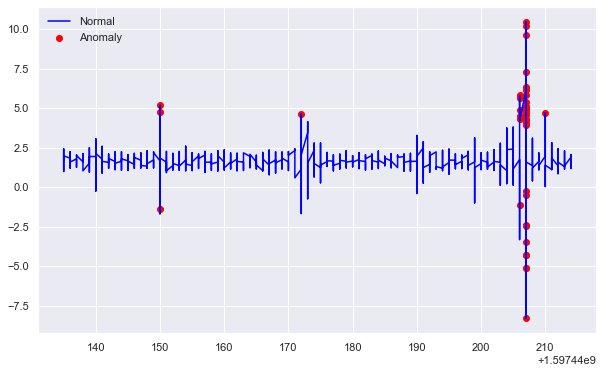

In [ ]:
from random import random
from influxdb import InfluxDBClient
import operator
import tensorflow as tf
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import random
from sklearn.preprocessing import StandardScaler
from datetime import datetime
import scipy as sp
from scipy.stats import entropy
from sklearn.ensemble import IsolationForest
import flyingcircus.extra as fc


client = InfluxDBClient("sensorweb.us", "8086", "test", "sensorweb", "shake", ssl=True)
unit = "b8:27:eb:16:1b:d7"


stampIni = "2020-08-14T17:22:15.000Z";
stampEnd = "2020-08-14T17:28:15.000Z";

query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\')  and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\'   '

result = client.query(query)
points = list(result.get_points())

values =  map(operator.itemgetter('value'), points)
times  =  map(operator.itemgetter('time'),  points)

datat = list(values)
timet= list(times)
i=0
for temp in datat:
  datat[i]=temp/10000
  i+=1

#length=len(datat)

length=8000

#window based TEO with 0 padding
TEO=[]
i=0
while i < length:
    if i>0 and i<length-1:
        temp = datat[i]*datat[i] + datat[i+1]*datat[i-1]
        TEO.append(temp)
    else:
        TEO.append(0)
    i+=1

#window based kurtosis
window = 10
datatest=np.array(datat[0:length])
new_arr = fc.rolling_apply_nd(datatest, window, func=sp.stats.kurtosis)

size=len(new_arr)

while size<length:
  num = random.randint(0, size-1)
  new_arr=np.append(new_arr,new_arr[num])
  size+=1
d = np.zeros((length,4),dtype=np.float64)
i=0

while i<length:
  if len(timet[i])==27:
    temp = datetime.strptime(timet[i], "%Y-%m-%dT%H:%M:%S.%fZ")
  elif len(timet[i])==20:
    temp = datetime.strptime(timet[i], "%Y-%m-%dT%H:%M:%SZ")
  d[i][0]=int(temp.timestamp())
  d[i][1]=datat[i]
  d[i][2]=TEO[i]
  d[i][3] = new_arr[i]
  i+=1
#  print(datat[i])

df = pd.DataFrame(d, columns=['date_time_int','value','teo', 'kurt'])

#print(df)

data = df[['value', 'teo', 'kurt']]
scaler = StandardScaler()
np_scaled = scaler.fit_transform(data)
data = pd.DataFrame(np_scaled)

# train isolation forest
outliers_fraction=0.005
model =  IsolationForest(contamination=outliers_fraction)
model.fit(data) 
df['anomaly2'] = pd.Series(model.predict(data))

# visualization
fig, ax = plt.subplots(figsize=(10,6))

a = df.loc[df['anomaly2'] == -1, ['date_time_int', 'value']] #anomaly

ax.plot(df['date_time_int'], df['value'], color='blue', label = 'Normal')
ax.scatter(a['date_time_int'],a['value'], color='red', label = 'Anomaly')
plt.legend()
plt.show()

## One-class Support Vector Machine (SVM) 

author: Woody & Yao

### Background about Support Vector Machine (SVM)
Consider a data set $\Omega=\{(x_1,y_1),(x_2,y_2),\dots,(x_n,y_n)\}$; points $x_i \in \mathbb{R}_d$ in a (for instance two-dimensional) space where $x_i$ is the $i$-th input data point and $y_i\in\{−1,1\}$ is the $i$-th output pattern, indicating the class membership.

A very nice property of SVMs is that it can create a non-linear decision boundary by projecting the data through a non-linear function $\phi$ to a space with a higher dimension. By using a polynomial kernel for projection (later more on that) all the dots are lifted into the third dimension, in which a hyperplane can be used for separation. When the intersection of the plane with the space is projected back to the two dimensional space, a circular boundary arises.

The hyperplane is represented with the equation $w^Tx+b=0$, with $w\in\mathcal{F}$ and $b\in\mathbb{R}$. The hyperplane that is constructed determines the margin between the classes; all the data points for the class $−1$ are on one side, and all the data points for class $1$ on the other. The distance from the closest point from each class to the hyperplane is equal; thus the constructed hyperplane searches for the maximal margin (“separating power”) between the classes. To prevent the SVM classifier from over-fitting with noisy data (or to create a soft margin), slack variables $\xi_i$ are introduced to allow some data points to lie within the margin, and the constant $C>0$ determines the trade-off between maximizing the margin and the number of training data points within that margin (and thus training errors). The objective function of the SVM classifier is the following minimization formulation:
$$
\min_{w, b, \xi_i} \frac{||w||^2}{2} + C\sum_{i=1}^n \xi_i \\
\text{subject to}: y_i(w^T \phi(x_i)+b) \ge 1 − \xi_i,~\text{for all}~i=1,\dots,n\\
\xi \ge 0~\text{for all}.~i=1,\dots,n
$$

This minimization problem (with quadratic programming) is solved using Lagrange multipliers. The decision function (classification) rule for a data point $x$ then becomes:
$$
f(x)=\text{sgn}(\sum_{i=1}^n \alpha_i y_i K(x,x_i) + b).
$$
Here $\alpha_i$ are the Lagrange multipliers; every $\alpha_i>0$ is weighted in the decision function and thus "supports" the machine; hence the name Support Vector Machine. Since SVMs are considered to be sparse, there will be relatively few Lagrange multipliers with a non-zero value.

### One-class SVM
The method of Support Vector Data Description by Tax and Duin (SVDD) takes a spherical, instead of planar, approach. The algorithm obtains a spherical boundary, in feature space, around the data. The volume of this hypersphere is minimized, to minimize the effect of incorporating outliers in the solution.
It basically separates all the data points from the origin (in feature space $\mathcal{F}$) and maximizes the distance from this hyperplane to the origin. This results in a binary function which captures regions in the input space where the probability density of the data lives. Thus the function returns +1 in a “small” region (capturing the training data points) and −1 elsewhere.


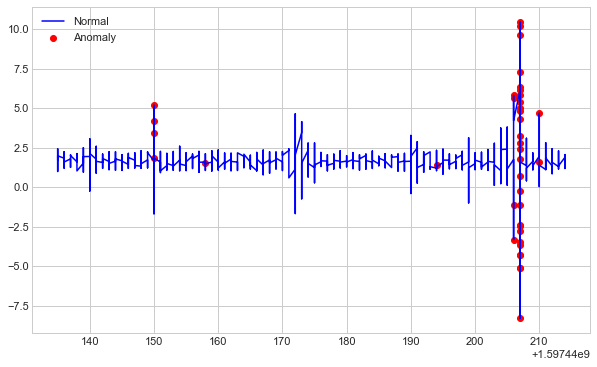

In [ ]:
from sklearn.svm import OneClassSVM
import pandas as pd

# train oneclassSVM 
model = OneClassSVM(nu=outliers_fraction, kernel="rbf", gamma=0.01)
model.fit(data)
df['anomaly3'] = pd.Series(model.predict(data))

# fig, ax = plt.subplots(figsize=(10,6))
# # a = df.loc[df['anomaly3'] == -1, ['date_time_int', 'price_usd']] #anomaly

# ax.plot(df['date_time_int'], df['price_usd'], color='blue')
# # ax.scatter(a['date_time_int'],a['price_usd'], color='red')
# plt.show();


# visualization
fig, ax = plt.subplots(figsize=(10,6))

a = df.loc[df['anomaly3'] == -1, ['date_time_int', 'value']] #anomaly

ax.plot(df['date_time_int'], df['value'], color='blue', label = 'Normal')
ax.scatter(a['date_time_int'],a['value'], color='red', label = 'Anomaly')
plt.legend()
plt.show()

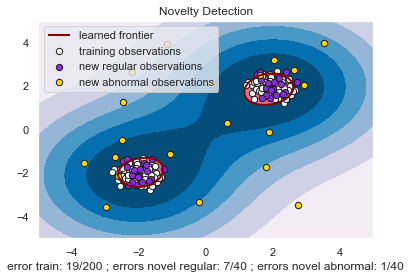

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.font_manager
from sklearn import svm

xx, yy = np.meshgrid(np.linspace(-5, 5, 500), np.linspace(-5, 5, 500))
# Generate train data
X = 0.3 * np.random.randn(100, 2)
X_train = np.r_[X + 2, X - 2]
# Generate some regular novel observations
X = 0.3 * np.random.randn(20, 2)
X_test = np.r_[X + 2, X - 2]
# Generate some abnormal novel observations
X_outliers = np.random.uniform(low=-4, high=4, size=(20, 2))

# fit the model
clf = svm.OneClassSVM(nu=0.1, kernel="rbf", gamma=0.1)
clf.fit(X_train)
y_pred_train = clf.predict(X_train)
y_pred_test = clf.predict(X_test)
y_pred_outliers = clf.predict(X_outliers)
n_error_train = y_pred_train[y_pred_train == -1].size
n_error_test = y_pred_test[y_pred_test == -1].size
n_error_outliers = y_pred_outliers[y_pred_outliers == 1].size

# plot the line, the points, and the nearest vectors to the plane
Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.title("Novelty Detection")
plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), 0, 7), cmap=plt.cm.PuBu)
a = plt.contour(xx, yy, Z, levels=[0], linewidths=2, colors='darkred')
plt.contourf(xx, yy, Z, levels=[0, Z.max()], colors='palevioletred')

s = 40
b1 = plt.scatter(X_train[:, 0], X_train[:, 1], c='white', s=s, edgecolors='k')
b2 = plt.scatter(X_test[:, 0], X_test[:, 1], c='blueviolet', s=s,
                 edgecolors='k')
c = plt.scatter(X_outliers[:, 0], X_outliers[:, 1], c='gold', s=s,
                edgecolors='k')
plt.axis('tight')
plt.xlim((-5, 5))
plt.ylim((-5, 5))
plt.legend([a.collections[0], b1, b2, c],
           ["learned frontier", "training observations",
            "new regular observations", "new abnormal observations"],
           loc="upper left",
           prop=matplotlib.font_manager.FontProperties(size=11))
plt.xlabel(
    "error train: %d/200 ; errors novel regular: %d/40 ; "
    "errors novel abnormal: %d/40"
    % (n_error_train, n_error_test, n_error_outliers))
plt.show()

## SST (Singular Spectrum Transformation)

Source: https://github.com/statefb/singular-spectrum-transformation

More examples at https://github.com/statefb/singular-spectrum-transformation/blob/master/notebooks/examples.ipynb

Comparison between SVD and Lanczos https://github.com/statefb/singular-spectrum-transformation/blob/master/notebooks/comparison_between_svd_and_lanczos.ipynb


Tsuyoshi Ide, Koji Tsuda, Change-Point Detection using Krylov Subspace Learning, SIAM International Conference on Data Mining, pp.515-520, 2007
Tsuyoshi Ide, Speeding up Change-Point Detection using Matrix Compression (Japanse), Workshop on Information-Based Induction Sciences, 2006
Tsuyoshi Ide, Masashi Sugiyama, Anomaly Detection and Change Detection (Japanse), Kodansha, 2015

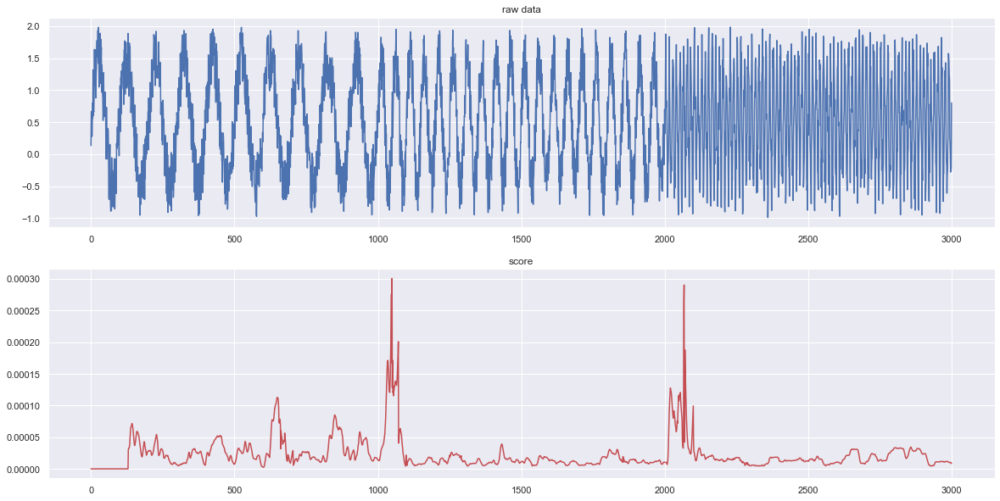

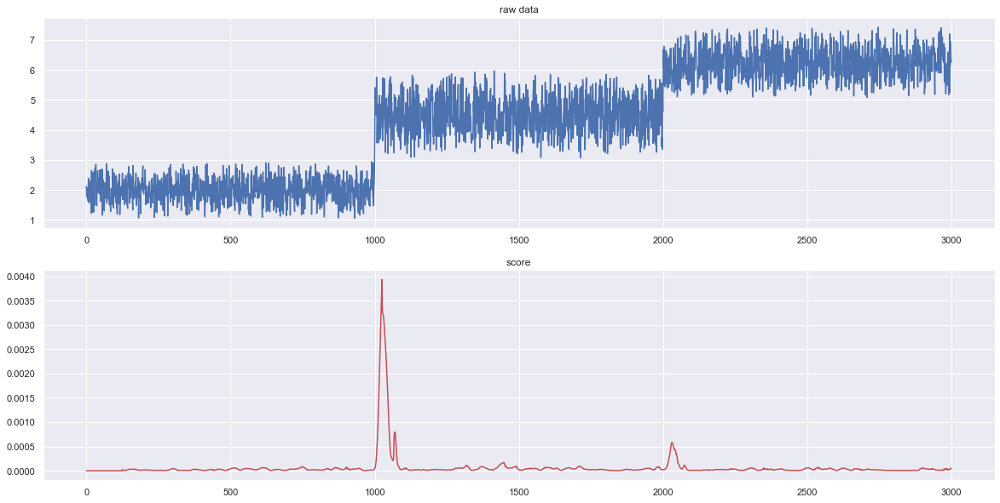

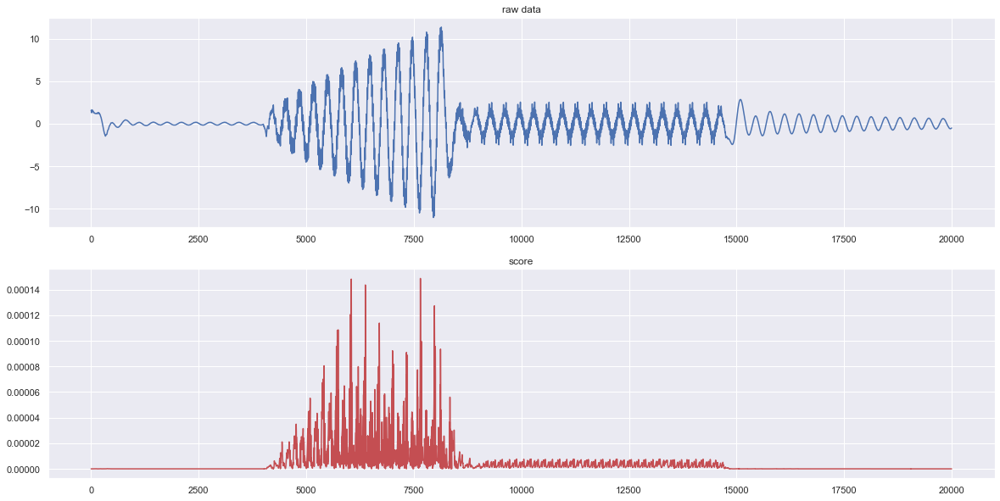

In [ ]:
from fastsst import SingularSpectrumTransformation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


def plot_data_and_score(raw_data, score):
    f,ax = plt.subplots(2, 1, figsize=(20, 10))
    ax[0].plot(raw_data); ax[0].set_title("raw data")
    ax[1].plot(score,"r"); ax[1].set_title("score")


sst = SingularSpectrumTransformation(win_length=30)

"""
note:
 - data must be 1d np.ndarray
 - the first run takes a few seconds for jit compling
"""
x0 = np.sin(2*np.pi*1*np.linspace(0,10,1000))
x1 = np.sin(2*np.pi*2*np.linspace(0,10,1000))
x2 = np.sin(2*np.pi*8*np.linspace(0,10,1000))
x = np.hstack([x0, x1, x2])
x +=  + np.random.rand(x.size)
score = SingularSpectrumTransformation(win_length=60, order=60, lag=10).score_offline(x)
plot_data_and_score(x, score)

x0 = 1 * np.ones(1000) + np.random.rand(1000) * 1
x1 = 3 * np.ones(1000) + np.random.rand(1000) * 2
x2 = 5 * np.ones(1000) + np.random.rand(1000) * 1.5
x = np.hstack([x0, x1, x2])
x +=  np.random.rand(x.size)
score = SingularSpectrumTransformation(win_length=50).score_offline(x)
plot_data_and_score(x, score)

x = data
score = SingularSpectrumTransformation(win_length=60, order=60, lag=10).score_offline(x)
plot_data_and_score(x, score)

# Regression and characterization

> Indented block


---

* Supervised
* Unsupervised



## Lasso, Ridge and Group Lasso (ElasticNet) for regression

Regularization: Ridge, Lasso and Elastic Net:
https://www.datacamp.com/community/tutorials/tutorial-ridge-lasso-elastic-net

From Linear Regression to Ridge Regression, the Lasso, and the Elastic Net:
https://towardsdatascience.com/from-linear-regression-to-ridge-regression-the-lasso-and-the-elastic-net-4eaecaf5f7e6

## Regressors comparison

In [ ]:
import csv
import scipy
import sklearn
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.multioutput import MultiOutputClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC, SVR
from sklearn.neural_network import MLPClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.ensemble import ExtraTreesClassifier, ExtraTreesRegressor
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
##from sklearn.decomposition import PCA

# load data and tags
# data[0] and tags[0] are the headers

file_name = 'beddot_ctru_h1_4minutes.csv'
with open(file_name, 'r',encoding='UTF-8') as f:
    file = csv.reader(f)
    time_x = []
    value_x = []
    for row in file:
        time_x.append(row[0][14:22])
        value_x.append(row[0][30:])
f.close()
time_x[0] = 'Time'
value_x[0] = 'Value'

file_name = 'caretaker_ctru_h1_4minutes.csv'
with open(file_name, 'r',encoding='UTF-8') as f:
    file = csv.reader(f)
    tags = []
    for row in file:
        tags.append([row[1],row[5],row[6]])
f.close()
l_tags = len(tags)

# k+100 samples X correpond to one multilabel Y (heartrate/respiration)
time_y = [tags[i][0] for i in range(1,len(tags))]
Y = [tags[i][1] for i in range(1,len(tags))]

names = ['SVR','RandomForest','KNN','ExtraTrees']
regressors = [SVR(),RandomForestRegressor(),KNeighborsRegressor(),ExtraTreesRegressor()]
parameter_svr ={
            'kernel': ['linear','poly','rbf', 'sigmoid'],
            'C': [1, 10,100,1000],
            'degree': (1, 8)
            }
parameter_rf ={
            'max_depth': range(1,20,2),
            'n_estimators':range(10,71,10)
            }
parameter_knn ={
            'n_neighbors': [i for i in range(1,5)],
            'weights': ['uniform','distance'],
            'p': [p for p in range(1,11)]
            }
parameter_ext ={
            'max_depth': range(1,20,2),
            'n_estimators':range(10,71,10)
            }
parameters = [parameter_svr,parameter_rf,parameter_knn,parameter_ext]
nsplits=5

print('heartrate estimation\n')
for clf,param,name in zip(regressors,parameters,names):
    bva = 0
    bta = 0
    bm = []
    l = 0
    for k in range(0,100,10):
        X = [value_x[time_x.index(time)-k-100:time_x.index(time)-k] for time in time_y]
        x_train,x_test,y_train,y_test = train_test_split(np.array(X).astype(np.float),np.array(Y).astype(np.int),random_state=33,test_size=0.25)
        y_train = y_train.reshape(len(y_train),) # for GridSearchCV
        y_test = y_test.reshape(len(y_test),) # for GridSearchCV
        ss_x = StandardScaler()
        x_train = ss_x.fit_transform(x_train)
        x_test = ss_x.transform(x_test)        
        model = GridSearchCV(clf, param, cv=5)
        model.fit(x_train, y_train)
        if model.best_score_>bva:
            bva = model.best_score_
            predicted = [round(x) for x in model.predict(x_test)]
            diff = y_test - predicted
            diff[np.nonzero(diff)] = 1
            bta = 1-np.mean(diff, axis=0)
            bm = model.best_estimator_
            l = k
    print(l+100,'(samples)\n',
          name,'(classifier)\n',bva,'(val accuracy)\n',bta,'(test accuracy)')

Y = [tags[i][2] for i in range(1,len(tags))]
print('respiration estimation\n')
for clf,param,name in zip(regressors,parameters,names):
    bva = 0
    bta = 0
    bm = []
    l = 0
    for k in range(400,1300,100):
        X = [value_x[time_x.index(time_y[i])-k-100:time_x.index(time_y[i])-k] for i in range(l_tags-1)]
        x_train,x_test,y_train,y_test = train_test_split(np.array(X).astype(np.float),np.array(Y).astype(np.int),random_state=33,test_size=0.25)
        y_train = y_train.reshape(len(y_train),) # for GridSearchCV
        y_test = y_test.reshape(len(y_test),) # for GridSearchCV
        ss_x = StandardScaler()
        x_train = ss_x.fit_transform(x_train)
        x_test = ss_x.transform(x_test)        
        model = GridSearchCV(clf, param, cv=5)
        model.fit(x_train, y_train)
        if model.best_score_>bva:
            bva = model.best_score_
            predicted = [round(x) for x in model.predict(x_test)]
            diff = y_test - predicted
            diff[np.nonzero(diff)] = 1
            bta = 1-np.mean(diff, axis=0)
            bm = model.best_estimator_
            l = k
    print(l+100,'(samples)\n',
          name,'(regressor)\n',bva,'(val accuracy)\n',bta,'(test accuracy)')


#plt.hist(y_test,edgecolor='k', alpha=0.35) 
#plt.show()    
##mse = metrics.mean_squared_error(y_test, predicted)
##print("\nmse:",mse)
##print("predicted:",predicted)

##f = open('data.csv','w',newline='')
##csv_writer = csv.writer(f)
##csv_writer.writerows(data[1:])
##f.close()
##f = open('tagh.csv','w',newline='')
##csv_writer = csv.writer(f)
##csv_writer.writerows(Y)
##f.close()
##f = open('time.csv','w',newline='')
##csv_writer = csv.writer(f)
##csv_writer.writerows(time_y)
##f.close()


ImportError: ignored

## EQcorrscan: the detection and analysis of repeating and near-repeating earthquakes.

Paper: Chamberlain, C. J., Hopp, C. J., Boese, C. M., Warren-Smith, E., Chambers, D., Chu, S. X., Michailos, K., Townend, J., EQcorrscan: Repeating and near-repeating earthquake detection and analysis in Python. Seismological Research Letters 2017 [link text](https://pubs.geoscienceworld.org/ssa/srl/article/89/1/173/524875/eqcorrscan-repeating-and-near-repeating-earthquake)

Code: https://github.com/eqcorrscan/EQcorrscan

This package contains routines to enable the user to conduct matched-filter earthquake detections using obspy bindings when reading and writing seismic data, as well as subspace detection, brightness source-scanning, relative moment calculation using singular-value decomposition, and correlation pick-adjustment for similar events.

Also within this package are:

* Clustering routines for seismic data;
* Peak finding algorithm (basic, but appropriate for noisy data);
* Automatic amplitude picker for local magnitude scale;
Obspy.core.event integration, which opens up lots of other functions (Seishub, hypoDDpy etc.);
* Stacking routines including phase-weighted stacking based on Thurber at al. (2014);
* Brightness based template creation based on the work of Frank et al. (2014);
* Singular Value Decomposition derived magnitude calculations based on Rubinstein & Ellsworth (2010).

## Fingerprint And Similarity Thresholding (FAST)

FAST adapts a data mining algorithm, originally designed to identify similar audio clips within large databases; it first creates compact “fingerprints” of waveforms by extracting key discriminative features, then groups similar fingerprints together within a database to facilitate fast, scalable search for similar fingerprint pairs, and finally generates a list of earthquake detections. FAST can analyze a week of continuous seismic waveform data in less than 2 hours, or 140 times faster than autocorrelation.

Code: https://github.com/stanford-futuredata/FAST
Guide: https://github.com/stanford-futuredata/FAST/blob/master/FAST_userguide_v0.pdf
Paper: https://advances.sciencemag.org/content/advances/1/11/e1501057.full.pdf


Comparison of earthquake detection methods (STA/LTA, template matching, autocorrelation) in terms of three
qualitative metrics: Detection sensitivity, general applicability, and
computational efficiency. STA/LTA scores high on general applicability
because it finds unknown sources, scores high on computational efficiency
because it detects earthquakes in real time, but scores low on detection
sensitivity because it can miss low-snr seismic events. Template matching
rates high on detection sensitivity because cross-correlation can find lowsnr events, rates high on computational efficiency because we only need to
cross-correlate continuous data with a small set of template waveforms,
but rates low on general applicability because template waveforms need
to be determined in advance. Autocorrelation has high detection sensitivity
because it cross-correlates waveforms, and high general applicability because it can find unknown similar sources, but has very low computational
efficiency that scales poorly with the size of the continuous data set. FAST
performs well with respect to all three metrics, combining the detection sensitivity and general applicability of correlation-based detection with high
computational efficiency and scalability.

## Random forest regressor



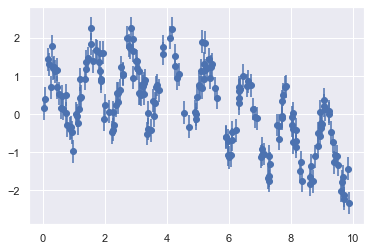

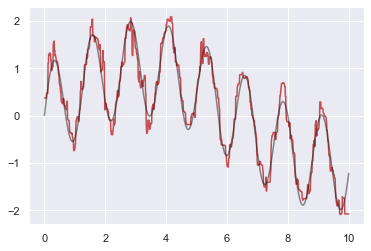

In [ ]:
from sklearn.ensemble import RandomForestRegressor

rng = np.random.RandomState(42)
x = 10 * rng.rand(200)

def model(x, sigma=0.3):
    fast_oscillation = np.sin(5 * x)
    slow_oscillation = np.sin(0.5 * x)
    noise = sigma * rng.randn(len(x))

    return slow_oscillation + fast_oscillation + noise

y = model(x)
plt.errorbar(x, y, 0.3, fmt='o');
plt.show()

forest = RandomForestRegressor(200)
forest.fit(x[:, None], y)

xfit = np.linspace(0, 10, 1000)
yfit = forest.predict(xfit[:, None])
ytrue = model(xfit, sigma=0)

# plt.errorbar(x, y, 0.3, fmt='o', alpha=0.5)
plt.plot(xfit, yfit, '-r');
plt.plot(xfit, ytrue, '-k', alpha=0.5);
plt.show()

## Extract useful signal with known shape from noisy signals

Extracting Signal from Noise: https://piazza.com/class_profile/get_resource/hq78nccsyym4j2/hqi3w7p0ajh79m

### Example with bio signals (ECG, RR, EEG, etc)

BioSPPy - Biosignal Processing in Python
https://github.com/PIA-Group/BioSPPy

## Peaks and envolope

Digital Envelope Detection: The Good, the Bad, and the Ugly https://www.dsprelated.com/showarticle/938.php (Tutorial information on this topic is readily available but that information is spread out over a number of DSP textbooks and many Internet web sites. The purpose of this blog is to summarize various digital envelope detection methods in one place.)


maximum level is 8


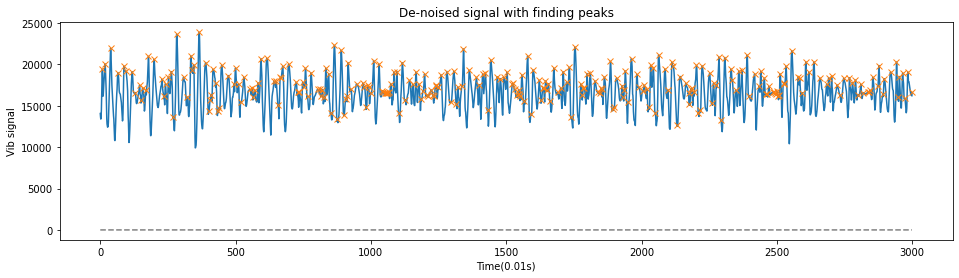

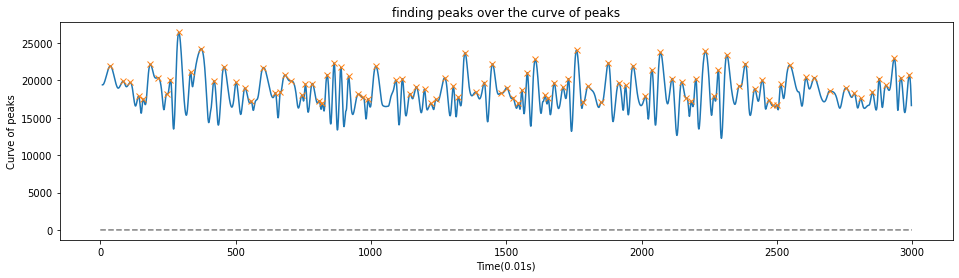

In [ ]:
####### peak detection
import numpy as np
import csv
import matplotlib.pyplot as plt
import pywt
from influxdb import InfluxDBClient
import operator
import scipy.signal as sg
import scipy as sp

def wdenoise(data, method, threshold):
    # Create wavelet object and define parameters
    w = pywt.Wavelet(method)
    maxlev = pywt.dwt_max_level(len(data), w.dec_len)
    # maxlev = 2 # Override if desired
    print("maximum level is " + str(maxlev))
    # Decompose into wavelet components, to the level selected:
    coeffs = pywt.wavedec(data, method, level=maxlev)  
    #cA = 0.0
    #cA = pywt.threshold(cA, threshold*max(cA))
    # plt.figure()
    for i in range(1, len(coeffs)):
        # plt.subplot(maxlev, 1, i)
        # plt.plot(coeffs[i])
        coeffs[i] = pywt.threshold(coeffs[i], threshold*max(coeffs[i]))
        # plt.plot(coeffs[i])
    datarec = pywt.waverec(coeffs, method)
    return datarec


# denoising with wavelet
datarec = wdenoise(data, 'sym4', 0.24) # 
#datarec = data

x = datarec
peaks1, _ = sp.signal.find_peaks(x, height=0)

plt.figure(figsize=(16, 4))
plt.xlabel('Time(0.01s)')
plt.ylabel('Vib signal')
plt.title("De-noised signal with finding peaks")
plt.plot(x)
plt.plot(peaks1, x[peaks1], "x")
plt.plot(np.zeros_like(x), "--", color="gray")
plt.show()

values = np.zeros((1,len(peaks1)))
cValues = 0;
for val in peaks1:
      values[0,cValues] = x[val]
      cValues = cValues + 1
values = values.ravel()

xvals = np.linspace(0, 3000, 3000)
x2 = sp.interpolate.interp1d(peaks1,values, kind='cubic',bounds_error=False)(xvals)
peaks2, _ = sg.find_peaks(x2, height=0)

plt.figure(figsize=(16, 4))
plt.xlabel('Time(0.01s)')
plt.ylabel('Curve of peaks')
plt.title("finding peaks over the curve of peaks")
plt.plot(x2)
plt.plot(peaks2, x2[peaks2], "x")
plt.plot(np.zeros_like(x), "--", color="gray")
plt.show()

## Extract Wave Direction with SVD
*Author: Sili Wang*

This algorithm extracts the wave direction based on threee axis waves. This example only shows the calculation of X and Z components, because the synthetic data has two components only. 

Singular value decomposition methods for wave propagation analysis
https://hal-insu.archives-ouvertes.fr/insu-02612276

Fangyu Li; Tong Bai; Nori Nakata; Bin Lyu; WenZhan Song Efficient Seismic Source Localization Using Simplified Gaussian Beam Time Reversal Imaging Journal Article IEEE Transactions on Geoscience and Remote Sensing, 2020.
https://sensorweb.engr.uga.edu/wp-content/uploads/2020/04/li2020efficient.pdf

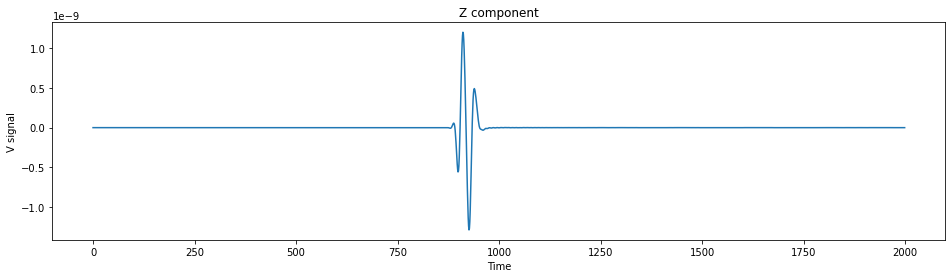

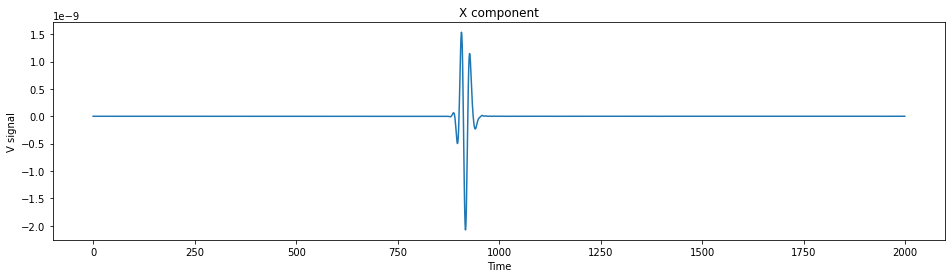

6.400902449968031e-21
879 970


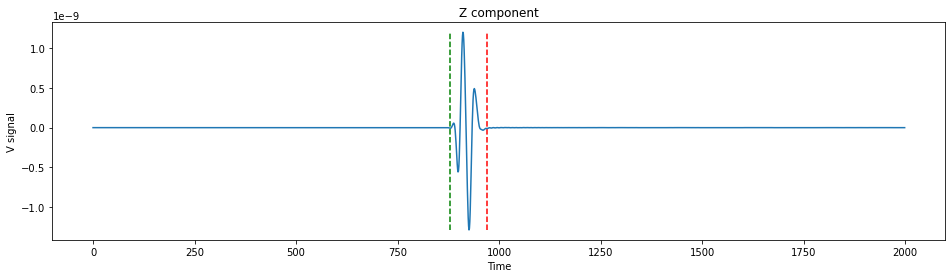

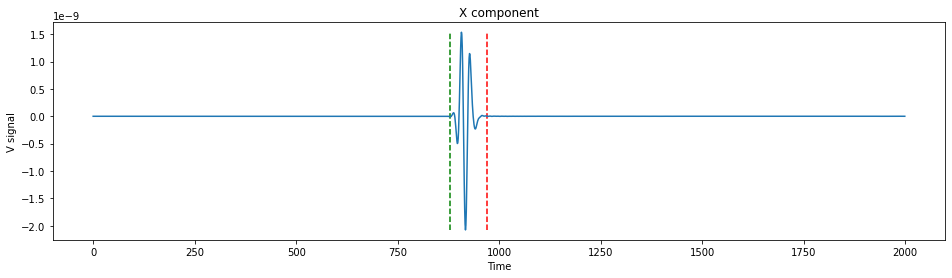

-0.30222721216552534


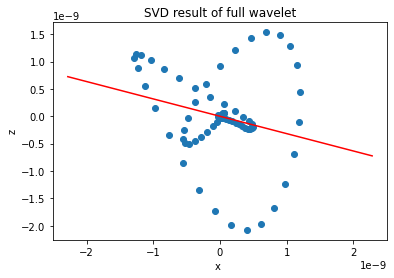

-0.6958093900893847


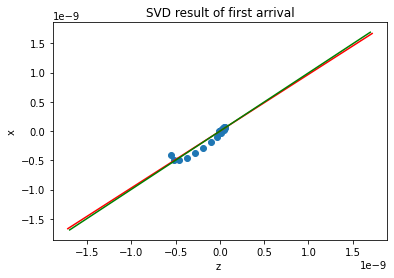

In [ ]:
import pandas as pd
from scipy import signal
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import moment

url = 'https://raw.githubusercontent.com/sili-wang/wavefield-forward-modeling/3e77f716b6ed3de39ba7dfb39ea772e482f0d4b0/1.csv'
df1 = pd.read_csv(url,header=None)
elasdata = df1.values.tolist()
elasdata= np.array(elasdata)
#print(elasdata[1])
shotnum=1
z1=elasdata[:,shotnum]
plt.figure(figsize=(16, 4))
plt.xlabel('Time')
plt.ylabel('V signal')
plt.title("Z component")
plt.plot(z1)

#plt.plot(np.zeros_like(x), "--", color="gray")
plt.show()

x1=elasdata[:,shotnum+300]
plt.figure(figsize=(16, 4))
plt.xlabel('Time')
plt.ylabel('V signal')
plt.title("X component")
plt.plot(x1)

#plt.plot(np.zeros_like(x), "--", color="gray")
plt.show()



window = 40

threshin = moment(z1,moment=2);
threshout = moment(z1,moment=2)*0.5;
print(threshout)
total=2000
sw = 0;
countout=0;
beginE = 0;
endE   = 0;
 
allBeginE = [];
allEndE   = [];
events = 0;
m2=np.zeros(total);

for i in range(window,total):
    pos = int(i -((window/2)));
    
    m2[pos] = moment(z1[i-window:i],moment=2);

    if m2[pos]>threshin and sw ==0:
        beginE = pos;
        sw = 1;
    
    if sw==1 and m2[pos]<threshout:
        countout=countout+1;
    else:
        countout=0;
    if countout>5:
        endE = pos;
        sw = 0;
        countout=0;
        if endE-beginE>10:
           allBeginE.append(beginE);
           allEndE.append(endE);
           signalZ = np.zeros(endE-beginE);
           signalZ = z1[beginE:endE];
           events=events+1;
print(allBeginE[0],allEndE[0])

y_min = min(z1)
y_max = max(z1)

plt.figure(figsize=(16, 4))
plt.xlabel('Time')
plt.ylabel('V signal')
plt.title("Z component")
plt.plot(z1)
plt.vlines(allBeginE, y_min, y_max, 'g', '--', label='example')
plt.vlines(allEndE, y_min, y_max, 'r', '--', label='example')
#plt.plot(np.zeros_like(x), "--", color="gray")
plt.show()

y_min = min(x1)
y_max = max(x1)

plt.figure(figsize=(16, 4))
plt.xlabel('Time')
plt.ylabel('V signal')
plt.title("X component")
plt.plot(x1)
plt.vlines(allBeginE, y_min, y_max, 'g', '--', label='example')
plt.vlines(allEndE, y_min, y_max, 'r', '--', label='example')
#plt.plot(np.zeros_like(x), "--", color="gray")
plt.show()
xx = allBeginE[0]-20;
yy = allEndE[0]-10;
zx=np.append([z1[xx:yy]],[x1[xx:yy]],axis=0)

U, s, V = np.linalg.svd(zx.T)

print(V[0,0])
scale=np.max(z1)*2;


sx=np.append(-V[0,0],V[0,0])*scale;
sy=np.append(-V[1,0],V[1,0])*scale;



plt.figure()
plt.scatter(z1[xx:yy], x1[xx:yy], marker='o')
plt.title("SVD result of full wavelet")
plt.plot(sy,sx,'r')
plt.xlabel('x ')
plt.ylabel('z')
plt.show()

xx = allBeginE[0]-20;
yy = allEndE[0]-70;
zx=np.append([z1[xx:yy]],[x1[xx:yy]],axis=0)

U, s, V = np.linalg.svd(zx.T)

print(V[0,0])
scale=np.max(z1)*2;


sx=np.append(-V[0,0],V[0,0])*scale;
sz=np.append(-V[1,0],V[1,0])*scale;

dx=shotnum-150;dz=-150;
lx=np.append(-dx/np.sqrt(dx*dx+dz*dz),dx/np.sqrt(dx*dx+dz*dz))*scale;
lz=np.append(-dz/np.sqrt(dx*dx+dz*dz),dz/np.sqrt(dx*dx+dz*dz))*scale;

plt.figure()
plt.scatter(z1[xx:yy], x1[xx:yy], marker='o')
plt.title("SVD result of first arrival")
plt.plot(sz,sx,'r')
plt.plot(lz,lx,'g')
plt.xlabel('z ')
plt.ylabel('x')
plt.show()

## Dynamic Time Warping(DTW)

Dtw is a Python Module for computing Dynamic Time Warping distance. It can be used as a similarity measured between temporal sequences.

More info can be found at: https://github.com/pierre-rouanet/dtw

In [ ]:
!pip install dtw-python
!pip install dtaidistance

Importing the dtw module. When using in academic works please cite:
  T. Giorgino. Computing and Visualizing Dynamic Time Warping Alignments in R: The dtw Package.
  J. Stat. Soft., doi:10.18637/jss.v031.i07.

epoch time: 1598126400.0
epoch time: 1598126460.0
Click here to see the results in Grafana:

https://sensorweb.us:3000/d/o2RBARGMz/bed-dashboard-algtest?var-mac=b8:27:eb:f3:41:db&from=1598126400000&to=1598126460000&orgId=1&refresh=3s


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/urllib3/connectionpool.py:986: InsecureRequestWarning: Unverified HTTPS request is being made to host 'sensorweb.us'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning,


epoch time: 1604082600.0
epoch time: 1604082660.0
Click here to see the results in Grafana:

https://sensorweb.us:3000/d/o2RBARGMz/bed-dashboard-algtest?var-mac=b8:27:eb:6c:6e:22&from=1604082600000&to=1604082660000&orgId=1&refresh=3s
epoch time: 1603908720.0
epoch time: 1603908780.0
Click here to see the results in Grafana:

https://sensorweb.us:3000/d/o2RBARGMz/bed-dashboard-algtest?var-mac=b8:27:eb:6c:6e:22&from=1603908720000&to=1603908780000&orgId=1&refresh=3s
6000 6001 6001


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/urllib3/connectionpool.py:986: InsecureRequestWarning: Unverified HTTPS request is being made to host 'sensorweb.us'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning,
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/urllib3/connectionpool.py:986: InsecureRequestWarning: Unverified HTTPS request is being made to host 'sensorweb.us'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning,


the dtw distance bewteen wave_1 and wave_2 is distance_21 is 5.576823
the dtw distance bewteen wave_1 and wave_3 is distance_31 is 7.649587
the dtw distance bewteen wave_2 and wave_3 is distance_32 is 7.667094


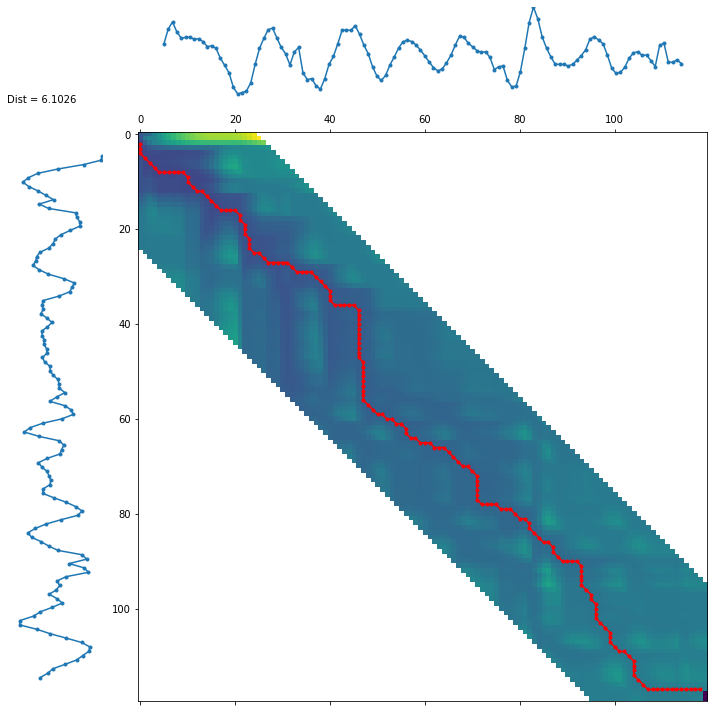

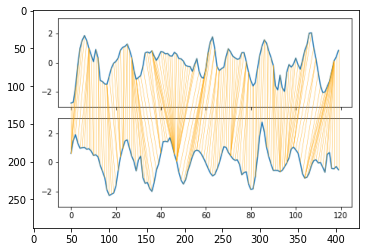

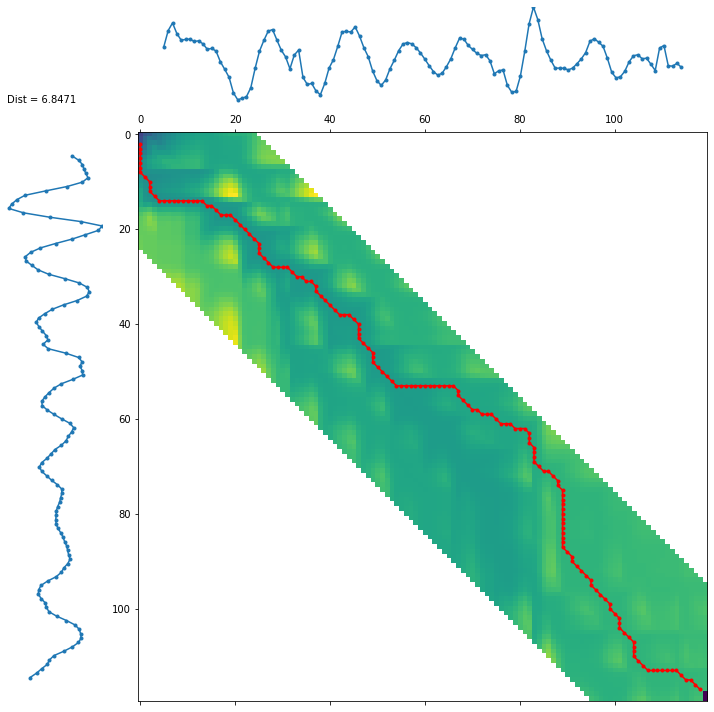

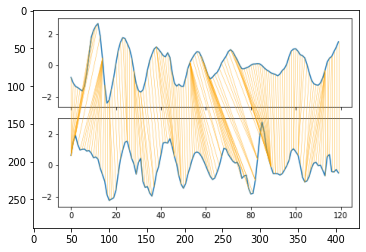

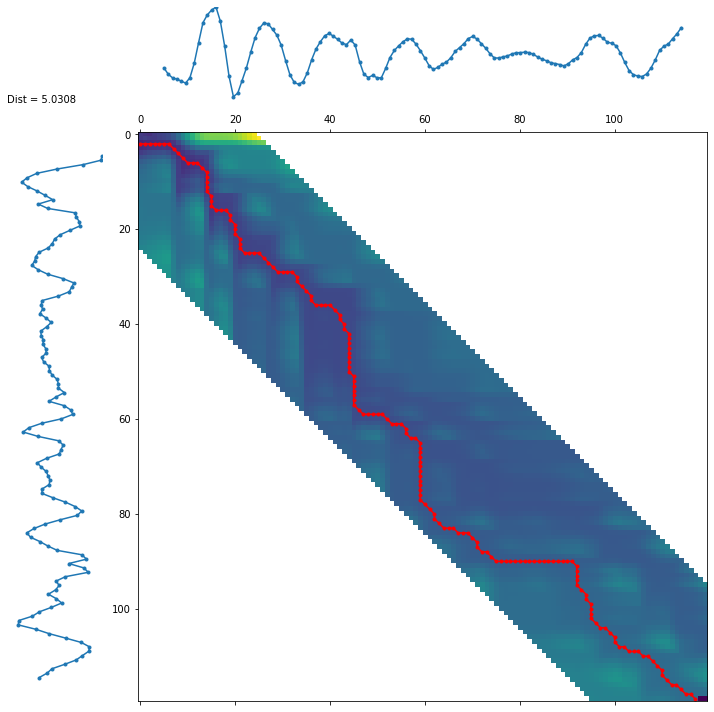

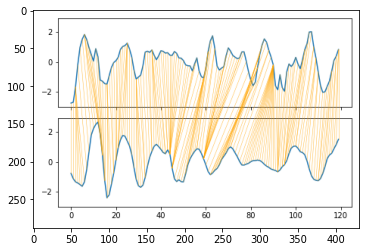

In [ ]:
#!/usr/bin/env python3
from dtaidistance import dtw
from dtaidistance import dtw_visualisation as dtwvis
import numpy as np
# importing pyplot and image from matplotlib 
import matplotlib.image as img 

from scipy import stats
from datetime import datetime
from dateutil import tz
import pytz
import webbrowser

from dtw import *
import numpy as np
import csv
import matplotlib.pyplot as plt
import pywt
from influxdb import InfluxDBClient
import operator
import scipy.signal as sg
import scipy as sp
from dtaidistance import dtw as dtdtw
from dtaidistance import dtw_visualisation as dtwvis
from dtaidistance import alignment


def timeToEpoch(time, zoneinfo):
    local_tz = pytz.timezone(zoneinfo) #"America/New_York") "Etc/UTC"
    if(zoneinfo == "Etc/UTC"):
        localTime = datetime.strptime(time, "%Y-%m-%dT%H:%M:%S.%fZ")
    else:
        localTime = datetime.strptime(time, "%Y-%m-%dT%H:%M:%S.%f")
    local_dt = local_tz.localize(localTime, is_dst=None)
    epoch = local_dt.timestamp()
    print("epoch time:", str(epoch)) # this is the epoch time in seconds, times 1000 will become epoch time in milliseconds
    return epoch

def wdenoise(data, method, threshold):
    # Create wavelet object and define parameters
    w = pywt.Wavelet(method)
    maxlev = pywt.dwt_max_level(len(data), w.dec_len)
    # maxlev = 2 # Override if desired
    # print("maximum level is " + str(maxlev))
    # Decompose into wavelet components, to the level selected:
    coeffs = pywt.wavedec(data, method, level=maxlev)
    #cA = 0.0
    #cA = pywt.threshold(cA, threshold*max(cA))
    # plt.figure()
    for i in range(1, len(coeffs)):
        # plt.subplot(maxlev, 1, i)
        # plt.plot(coeffs[i])
        coeffs[i] = pywt.threshold(coeffs[i], threshold*max(coeffs[i]))
        # plt.plot(coeffs[i])
    datarec = pywt.waverec(coeffs, method)
    return datarec

ip = "sensorweb.us"
client = InfluxDBClient(ip, "8086", "test", "sensorweb", "shake", ssl=True)

# unitList = {"unit":"b8:27:eb:f3:41:db"}

# "unit":"b8:27:eb:6c:6e:22", "start":"2020-10-28T14:12:00.000", "end":"2020-10-28T14:13:00.000", "status": "OnBed"

# unit = "b8:27:eb:a1:89:49"
unit = "b8:27:eb:f3:41:db" #shake1 cuhk
#unit2 = "b8:27:eb:ed:53:36" #shake2 cuhk
# the other one: b8:27:eb:63:da:62
stampIni = "2020-08-22T20:00:00.000Z" # UTC time = EST time + 4
stampEnd = "2020-08-22T20:01:00.000Z"
# stampIni = "2020-08-22T16:00:00.000" # EST TIME
# stampEnd = "2020-08-22T16:01:00.000"

startEpoch = timeToEpoch(stampIni, "Etc/UTC") #"America/New_York") # "
endEpoch = timeToEpoch(stampEnd, "Etc/UTC") #"America/New_York") #

url = "https://" + ip + ":3000/d/o2RBARGMz/bed-dashboard-algtest?var-mac=" + str(unit)
url = url + "&from=" + str(int(startEpoch*1000)) #+ "000" 
url = url + "&to=" + str(int(endEpoch*1000)) #+ "000"
url = url + "&orgId=1&refresh=3s"
print("Click here to see the results in Grafana:\n\n" + url)
#  input("Press any key to continue")
# webbrowser.open(url, new=2)

# query1
query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\') and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\''
result = client.query(query)
points = list(result.get_points())
values = map(operator.itemgetter('value'), points)
times = map(operator.itemgetter('time'), points)
data1 = np.array(list(values))


unit = "b8:27:eb:6c:6e:22"
stampIni = "2020-10-30T18:30:00.000Z" # UTC time = EST time + 4
stampEnd = "2020-10-30T18:31:00.000Z"
# stampIni = "2020-10-30T14:30:00.000" # EST time
# stampEnd = "2020-10-30T14:31:00.000"

startEpoch = timeToEpoch(stampIni, "Etc/UTC") #"America/New_York") # "
endEpoch = timeToEpoch(stampEnd, "Etc/UTC") #"America/New_York") #

url = "https://" + ip + ":3000/d/o2RBARGMz/bed-dashboard-algtest?var-mac=" + str(unit)
url = url + "&from=" + str(int(startEpoch*1000)) #+ "000" 
url = url + "&to=" + str(int(endEpoch*1000)) #+ "000"
url = url + "&orgId=1&refresh=3s"
print("Click here to see the results in Grafana:\n\n" + url)
#  input("Press any key to continue")
# webbrowser.open(url, new=2)

# query2
query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\') and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\''
result = client.query(query)
points = list(result.get_points())
values = map(operator.itemgetter('value'), points)
times = map(operator.itemgetter('time'), points)
data2 = np.array(list(values))


unit = "b8:27:eb:6c:6e:22"
stampIni = "2020-10-28T18:12:00.000Z" # UTC time = EST time + 4
stampEnd = "2020-10-28T18:13:00.000Z"
# stampIni = "2020-10-30T14:30:00.000" # EST time
# stampEnd = "2020-10-30T14:31:00.000"

startEpoch = timeToEpoch(stampIni, "Etc/UTC") #"America/New_York") # "
endEpoch = timeToEpoch(stampEnd, "Etc/UTC") #"America/New_York") #

url = "https://" + ip + ":3000/d/o2RBARGMz/bed-dashboard-algtest?var-mac=" + str(unit)
url = url + "&from=" + str(int(startEpoch*1000)) #+ "000" 
url = url + "&to=" + str(int(endEpoch*1000)) #+ "000"
url = url + "&orgId=1&refresh=3s"
print("Click here to see the results in Grafana:\n\n" + url)
#  input("Press any key to continue")
# webbrowser.open(url, new=2)

# query2
query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\') and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\''
result = client.query(query)
points = list(result.get_points())
values = map(operator.itemgetter('value'), points)
times = map(operator.itemgetter('time'), points)
data3 = np.array(list(values))


fs = 100 # for vibration data

print(len(data1), len(data2), len(data3))
if(len(data1) == 0 or len(data2) == 0 or len(data3) == 0):
    print("No data in the chosen time range!")
    quit()

datarec1 = data1[0:6000] #wdenoise(data1, 'sym4', 0.4)
datarec2 = data2[0:6000] #wdenoise(data2, 'sym4', 0.4)
datarec3 = data3[0:6000] #wdenoise(data2, 'sym4', 0.4)

wave_1 = np.split(datarec3, 50, axis=0)[5]
wave_2 = np.split(datarec2, 50, axis=0)[10]
wave_3 = np.split(datarec3, 50, axis=0)[15]

wave_1 = stats.zscore(wave_1)
wave_2 = stats.zscore(wave_2)
wave_3 = stats.zscore(wave_3)


# plt.plot(wave_1)
# plt.plot(wave_2)
# plt.plot(wave_3)
# plt.show()

distance_21 = dtdtw.distance(wave_2, wave_1)
distance_31 = dtdtw.distance(wave_3, wave_1)
distance_32 = dtdtw.distance(wave_3, wave_2)

print("the dtw distance bewteen wave_1 and wave_2 is distance_21 is %f"%(distance_21))
print("the dtw distance bewteen wave_1 and wave_3 is distance_31 is %f"%(distance_31))
print("the dtw distance bewteen wave_2 and wave_3 is distance_32 is %f"%(distance_32))



# ## Find the best match with the canonical recursion formula
# from dtw import *
# alignment = dtw(wave_2, wave_1, keep_internals=True)

# ## Display the warping curve, i.e. the alignment curve
# alignment.plot(type="threeway")

# ## Align and plot with the Rabiner-Juang type VI-c unsmoothed recursion
# dtw(wave_2, wave_1, keep_internals=True, 
#     step_pattern=rabinerJuangStepPattern(6, "c"))\
#     .plot(type="twoway",offset=-2)

# dtw(wave_3, wave_1, keep_internals=True, 
#     step_pattern=rabinerJuangStepPattern(6, "c"))\
#     .plot(type="twoway",offset=-2)

# s1 = np.array([0., 0, 1, 2, 1, 0, 1, 0, 0, 2, 1, 0, 0])
# s2 = np.array([0., 1, 2, 3, 1, 0, 0, 0, 2, 1, 0, 0, 0])


s1 = wave_1
s2 = wave_3

# s1 = stats.zscore(wave_1)
# s2 = stats.zscore(wave_2)

d, paths = dtdtw.warping_paths(s1, s2, window=25, psi=2)
best_path = dtdtw.best_path(paths)
dtwvis.plot_warpingpaths(s1, s2, paths, best_path)
plt.show()

path = dtdtw.warping_path(s1, s2)
dtwvis.plot_warping(s1, s2, path, filename="warp13.png")
  
# reading png image file 
im = img.imread('warp13.png') 
  
# show image 
plt.imshow(im) 
plt.show()


s1 = wave_2
s2 = wave_3

# s1 = stats.zscore(wave_1)
# s2 = stats.zscore(wave_2)

d, paths = dtdtw.warping_paths(s1, s2, window=25, psi=2)
best_path = dtdtw.best_path(paths)
dtwvis.plot_warpingpaths(s1, s2, paths, best_path)
plt.show()

path = dtdtw.warping_path(s1, s2)
dtwvis.plot_warping(s1, s2, path, filename="warp23.png")
  
# reading png image file 
im = img.imread('warp23.png') 
  
# show image 
plt.imshow(im) 
plt.show()


s1 = wave_1
s2 = wave_2

# s1 = stats.zscore(wave_1)
# s2 = stats.zscore(wave_2)

d, paths = dtdtw.warping_paths(s1, s2, window=25, psi=2)
best_path = dtdtw.best_path(paths)
dtwvis.plot_warpingpaths(s1, s2, paths, best_path)
plt.show()

path = dtdtw.warping_path(s1, s2)
dtwvis.plot_warping(s1, s2, path, filename="warp12.png")
  
# reading png image file 
im = img.imread('warp12.png') 
  
# show image 
plt.imshow(im) 
plt.show()


# value, matrix = alignment.needleman_wunsch(s1, s2)
# algn, s1a, s2a = alignment.best_alignment(matrix, s1, s2, gap='-')
# print(values)
# print(matrix)

## Support Vector Machine (SVM) for regression


https://helioml.org/01/1/example_fitting_time_series.html
This notebook loads up some actual measurements of the sun over time, cleans the data, and then uses machine learning techniques to fit those data.

Specifically for the data, the observations are from the Solar Dynamics Observatory (SDO) Extreme Ultraviolet Variability Experiment (EVE) that measures all the light coming from the sun between 5 nanometers (nm) and 105 nm. We'll be working just with the measurements taken at 17.1 nm; light that is emitted from the Iron (Fe) IX ion in the corona, which only exists at a temperature of about 600,000 K -- a fairly moderate temperature for the solar corona.

Specifically for the machine learning, we'll be using Support Vector Regression (SVR) and validation curves. Support Vector Machines (SVM) are typically used in a type of classification, an important category of machine learning that focuses on identifying and labeling groups in the data. SVMs can be extended to regression. There's some discussion of the function we'll be using here and here. Validation curves are a way of quantifying the question: which fit is the best fit? Data scientists are probably used to seeing things like reduced  𝜒2 . The purpose is the same, but these tools are built together in a python module we'll be using extensively, called scikit-learn.

## Transformer based regression

https://simpletransformers.ai/docs/regression/

# Clustering and classification

**Clustering is unsupervised; classification is supervised**

Clustering lecture notes: https://mdav.ece.gatech.edu/ece-6254-spring2017/notes/21-sc-hc-dbc.pdf

KNN vs K-means: https://pythonprogramminglanguage.com/how-is-the-k-nearest-neighbor-algorithm-different-from-k-means-clustering/#:~:text=KNN%20represents%20a%20supervised%20classification,into%20k%20number%20of%20clusters.

KNN represents a supervised classification algorithm that will give new data points accordingly to the k number or the closest data points, while k-means clustering is an unsupervised clustering algorithm that gathers and groups data into k number of clusters.

### Classifier comparison

In [ ]:
import csv
import scipy
import sklearn
import math
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import warnings
warnings.filterwarnings("ignore")
from datetime import datetime
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
from sklearn.multioutput import MultiOutputClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC, SVR
from sklearn.neural_network import MLPClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.ensemble import ExtraTreesClassifier, ExtraTreesRegressor
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
##from sklearn.decomposition import PCA

# load data and tags
# data[0] and tags[0] are the headers

file_name = 'beddot_ctru_h1_4minutes.csv'
with open(file_name, 'r',encoding='UTF-8') as f:
    file = csv.reader(f)
    time_x = []
    value_x = []
    for row in file:
        time_x.append(row[0][14:22])
        value_x.append(row[0][30:])
f.close()
time_x[0] = 'Time'
value_x[0] = 'Value'
# data smoothing
x_sm = np.array(value_x[1:]).astype(np.int)
model_sm = SimpleExpSmoothing(x_sm)
fit_x = model_sm.fit(smoothing_level=.5)
x_sm = fit_x.fittedvalues

file_name = 'caretaker_ctru_h1_4minutes.csv'
with open(file_name, 'r',encoding='UTF-8') as f:
    file = csv.reader(f)
    tags = []
    for row in file:
        tags.append([row[1],row[5],row[6]])
f.close()
l_tags = len(tags)

# k+100 samples X correpond to one multilabel Y (heartrate/respiration)
time_y = [tags[i][0] for i in range(1,len(tags))]
Y = [tags[i][1] for i in range(1,len(tags))]

names = ['SVC','RandomForest','KNN','ExtraTrees','GaussianProcess','MLP']
classifiers = [SVC(),RandomForestClassifier(),KNeighborsClassifier(),ExtraTreesClassifier(),GaussianProcessClassifier(random_state=0),MLPClassifier() ]
parameter_svc ={
            'kernel': ['linear','poly','rbf', 'sigmoid'],
            'C': [1, 10,100,1000],
            'degree': (1, 8)
            }
parameter_rf ={
            'max_depth': range(1,20,2),
            'n_estimators':range(10,71,10)
            }
parameter_knn ={
            'n_neighbors': [i for i in range(1,5)],
            'weights': ['uniform','distance'],
            'p': [p for p in range(1,11)]
            }
parameter_ext ={
            'max_depth': range(1,20,2),
            'n_estimators':range(10,71,10)
            }
parameter_gp ={
            'multi_class': ['one_vs_rest', 'one_vs_one']
            }
parameter_mlp ={
            'hidden_layer_sizes': range(3,20,2),
            'solver':['lbfgs','sgd','adam']
            }
parameters = [parameter_svc,parameter_rf,parameter_knn,parameter_ext,parameter_gp,parameter_mlp]
nsplits=5

print('heartrate estimation\n')
for clf,param,name in zip(classifiers,parameters,names):
    bva = 0
    bta = 0
    bm = []
    l = 0
    for k in range(0,100,10):
##        X = [x_sm[time_x.index(time)-k-100+1:time_x.index(time)-k+1] for time in time_y] # smoothed
        X = [value_x[time_x.index(time)-k-100:time_x.index(time)-k] for time in time_y] # without smoothing
        x_train,x_test,y_train,y_test = train_test_split(np.array(X).astype(np.float),np.array(Y).astype(np.int),random_state=33,test_size=0.25)
        y_train = y_train.reshape(len(y_train),) # for GridSearchCV
        y_test = y_test.reshape(len(y_test),) # for GridSearchCV
        ss_x = StandardScaler()
        x_train = ss_x.fit_transform(x_train)
        x_test = ss_x.transform(x_test)        
        model = GridSearchCV(clf, param, cv=5)
        model.fit(x_train, y_train)
        predicted = model.predict(x_test)
        if model.best_score_>bva:
            bva = model.best_score_
            bta = model.score(x_test,y_test)
            bm = model.best_estimator_
            l = k
    print(l+100,'(samples)\n',
          name,'(classifier)\n',bva,'(val accuracy)\n',bta,'(test accuracy)')

Y = [tags[i][2] for i in range(1,len(tags))]
print('respiration estimation\n')
for clf,param,name in zip(classifiers,parameters,names):
    bva = 0
    bta = 0
    bm = []
    l = 0
    for k in range(400,1300,100):
        X = [value_x[time_x.index(time_y[i])-k-100:time_x.index(time_y[i])-k] for i in range(l_tags-1)]
        x_train,x_test,y_train,y_test = train_test_split(np.array(X).astype(np.float),np.array(Y).astype(np.int),random_state=33,test_size=0.25)
        y_train = y_train.reshape(len(y_train),) # for GridSearchCV
        y_test = y_test.reshape(len(y_test),) # for GridSearchCV
        ss_x = StandardScaler()
        x_train = ss_x.fit_transform(x_train)
        x_test = ss_x.transform(x_test)        
        model = GridSearchCV(clf, param, cv=5)
        model.fit(x_train, y_train)
        predicted = model.predict(x_test)
        if model.best_score_>bva:
            bva = model.best_score_
            bta = model.score(x_test,y_test)
            bm = model.best_estimator_
            l = k
    print(l+100,'(samples)\n',
          name,'(classifier)\n',bva,'(val accuracy)\n',bta,'(test accuracy)')

##    model.best_estimator_
##    model.best_params_

##f = open('data.csv','w',newline='')
##csv_writer = csv.writer(f)
##csv_writer.writerows(data[1:])
##f.close()
##f = open('tagh.csv','w',newline='')
##csv_writer = csv.writer(f)
##csv_writer.writerows(Y)
##f.close()
##f = open('time.csv','w',newline='')
##csv_writer = csv.writer(f)
##csv_writer.writerows(time_y)
##f.close()

###K-means Clustering [Unsupervised]

*Author: Soumya Pal*

<br/>

k-means algorithm is an iterative algorithm that tries to partition the dataset into K pre-defined distinct non-overlapping subgroups (clusters) where each data point belongs to only one group. It tries to make the intra-cluster data points as similar as possible while also keeping the clusters as different (far) as possible. It assigns data points to a cluster such that the sum of the squared distance between the data points and the cluster’s centroid (arithmetic mean of all the data points that belong to that cluster) is at the minimum. 

Pros:
*   Simple: It is easy to implement k-means and identify unknown groups of data from complex data sets.
*   Flexible: K-means algorithm can easily adjust to the changes. If there are any problems, adjusting the cluster segment will allow changes to easily occur on the algorithm.
*   Suitable in a large dataset: K-means is suitable for a large number of datasets and it’s computed much faster than the smaller dataset.
*   Efficient: The algorithm used is good at segmenting the large data set. Its efficiency depends on the shape of the clusters. K-means work well in hyper-spherical clusters.
*   Easy to interpret: The results are easy to interpret. It generates cluster descriptions in a form minimized to ease understanding of the data.

Cons:
*   No-optimal set of clusters: K-means doesn’t allow development of an optimal set of clusters and for effective results, clusters has to be decided beforehand.
*   Handle numerical data: K-means algorithm can be performed on numerical data only.
*   Lacks consistency: K-means clustering gives varying results on different runs of an algorithm. A random choice of cluster patterns yields different clustering results resulting in inconsistency.
*   Sensitivity to scale: Changing or rescaling the dataset either through normalization or standardization will completely change the final results.

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.datasets.samples_generator module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.datasets. Anything that cannot be imported from sklearn.datasets is now part of the private API.
  warnings.warn(message, FutureWarning)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/urllib3/connectionpool.py:986: InsecureRequestWarning: Unverified HTTPS request is being made to host 'sensorweb.us'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning,


[[ 1.64245647  5.53358958]
 [ 4.46770455 53.33276609]]


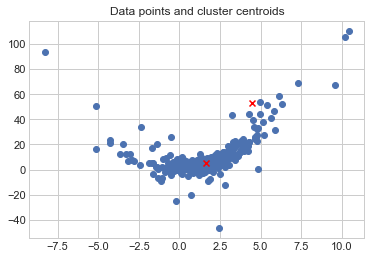

Predictions:


array([0, 1, 0], dtype=int32)

In [ ]:
from sklearn.datasets.samples_generator import make_blobs
from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
from influxdb import InfluxDBClient
import operator
import pandas as pd
import numpy as np

#data generating function
def create_data(type):
  if type=='gen':
      # Generate 2D data points
      X, _ = make_blobs(n_samples=10, centers=3, n_features=2,
                      cluster_std=0.2,  random_state=0)
  elif type=='get':
      # Convert the data points into a pandas DataFrame
      client = InfluxDBClient("sensorweb.us", "8086", "test", "sensorweb", "shake", ssl=True)
      unit = "b8:27:eb:16:1b:d7"


      stampIni = "2020-08-14T17:22:15.000Z";
      stampEnd = "2020-08-14T17:25:15.000Z";

      query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\')  and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\'   '

      result = client.query(query)
      points = list(result.get_points())

      values =  map(operator.itemgetter('value'), points)
      times  =  map(operator.itemgetter('time'),  points)

      datat = list(values)
      i=0
      for temp in datat:
        datat[i]=temp/10000
        i+=1
      #data= list(times)
      length=8000

      TEO=[]
      i=0
      while i < length:
          if i>0 and i<length-1:
              temp = datat[i]*datat[i] + datat[i+1]*datat[i-1]
              TEO.append(temp)
          else:
              TEO.append(0)
          i+=1

      X=np.zeros((length,2),dtype=np.float64)
      i=0
      j=0
      while i<length:
          X[i][j]=datat[i]
          X[i][j+1]=TEO[i]
          i+=1
  return X

#parameters get: for influx streaming seismic data; gen: for generating data
X=create_data('get')
# Specify the number of clusters and fit the data X
kmeans = KMeans(n_clusters=2, random_state=0).fit(X)
# Get the cluster centroids
print(kmeans.cluster_centers_)

# Plotting the cluster centers and the data points on a 2D plane
plt.scatter(X[:, 0], X[:, -1])
    
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], c='red', marker='x')
    
plt.title('Data points and cluster centroids')
plt.show()
a=[[-1.0, -4.6],[12.2, 80.0],[5.5,7.0]]
#print([[1.0, 4.6]])
print("Predictions:")
kmeans.predict(a)

###K-Nearest Neighbors Classification(KNN) [Supervised]

*Author: Soumya Pal*

<br/>

KNN algorithm is an approach to data classification that estimates how likely a data point is to be a member of one group or the other depending on what group the data points nearest to it are in.

Pros
*   No Training Period: KNN is called Lazy Learner (Instance based learning). It does not learn anything in the training period or derive any discriminative function from the training data. In other words, there is no training period for it. It stores the training dataset and learns from it only at the time of making real time predictions. This makes the KNN algorithm much faster than other algorithms that require training e.g. SVM, Linear Regression etc.
*   Since the KNN algorithm requires no training before making predictions, new data can be added seamlessly which will not impact the accuracy of the algorithm.
*   KNN is very easy to implement. There are only two parameters required to implement KNN i.e. the value of K and the distance function (e.g. Euclidean or Manhattan etc.)
*   Can be used both for Classification and Regression: One of the biggest advantages of K-NN is that K-NN can be used both for classification and regression problems.

Cons
*   Does not work well with large dataset: In large datasets, the cost of calculating the distance between the new point and each existing point is huge which degrades the performance of the algorithm.
*   Does not work well with high dimensions: The KNN algorithm doesn't work well with high dimensional data because with a large number of dimensions, it becomes difficult for the algorithm to calculate the distance in each dimension.
*   Requires feature scaling: Feature scaling (standardization and normalization) has to be done before applying KNN algorithm to any dataset, otherwise KNN may generate wrong predictions.
*   Sensitive to noisy data, missing values and outliers: KNN is sensitive to noise in the dataset. So data has to be manipulated to impute missing values and remove outliers.

/usr/local/lib/python3.6/dist-packages/urllib3/connectionpool.py:847: InsecureRequestWarning: Unverified HTTPS request is being made. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning)


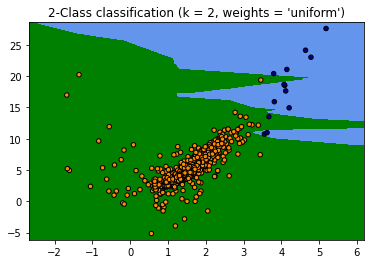

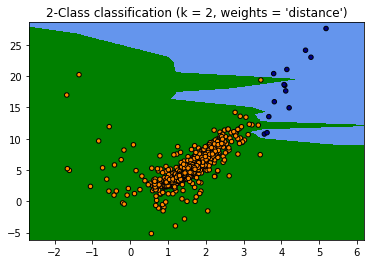

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn import neighbors, datasets
from influxdb import InfluxDBClient
import operator
import random

def create_data(type):
  if type=='gen':
      # import some data to play with
      iris = datasets.load_iris()

      # we only take the first two features. We could avoid this ugly
      # slicing by using a two-dim dataset
      X = iris.data[:, :2]
      y = iris.target
  
  elif type=='get':

      client = InfluxDBClient("sensorweb.us", "8086", "test", "sensorweb", "shake", ssl=True)
      unit = "b8:27:eb:16:1b:d7"

      stampIni = "2020-08-14T17:22:15.000Z";
      stampEnd = "2020-08-14T17:25:15.000Z";

      query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\')  and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\'   '

      result = client.query(query)
      points = list(result.get_points())

      values =  map(operator.itemgetter('value'), points)
      times  =  map(operator.itemgetter('time'),  points)

      datat = list(values)

      i=0

      #labels required so generated y for labels based on threshholding of raw data
      y=[]
      for temp in datat:
        datat[i]=temp/10000
        if temp> 35000.0:
          y.append(1)
        else:
          y.append(0)
        i+=1
      #data= list(times)
      length=4000

      y=y[0:length]
      TEO=[]
      i=0
      while i < length:
          if i>0 and i<length-1:
              temp = datat[i]*datat[i] + datat[i+1]*datat[i-1]
              TEO.append(temp)
          else:
              TEO.append(0)
          i+=1

      X=np.zeros((length,2),dtype=np.float64)
      i=0
      j=0
      while i<length:
          X[i][j]=datat[i]
          X[i][j+1]=TEO[i]
          i+=1
          
      return X, y

#parameter for create_Data- get: for influx streaming seismic data; gen: for generating data
X,y = create_data('get')

h = .02  # step size in the mesh
n_neighbors = 2

# Create color mapsK
cmap_light = ListedColormap(['green', 'cyan', 'cornflowerblue'])
cmap_bold = ListedColormap(['darkorange', 'c', 'darkblue'])

for weights in ['uniform', 'distance']:
    # we create an instance of Neighbours Classifier and fit the data.
    clf = neighbors.KNeighborsClassifier(n_neighbors, weights=weights)
    clf.fit(X, y)

    # Plot the decision boundary. For that, we will assign a color to each
    # point in the mesh [x_min, x_max]x[y_min, y_max].
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])

    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    plt.figure()
    plt.pcolormesh(xx, yy, Z, cmap=cmap_light)

    # Plot also the training points
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap=cmap_bold,
                edgecolor='k', s=20)
    plt.xlim(xx.min(), xx.max())
    plt.ylim(yy.min(), yy.max())
    plt.title("2-Class classification (k = %i, weights = '%s')"
              % (n_neighbors, weights))

plt.show()

##Spectral Clustering [Unsupervised]
*Author: Soumya Pal*

Spectral clustering is a way to cluster data that has a number of benefits and applications. It relies on the eigenvalue decomposition of a matrix, which is a useful factorization theorem in matrix theory. It is a technique with roots in graph theory, where the approach is used to identify communities of nodes in a graph based on the edges connecting them. The method is flexible and allows us to cluster non graph data as well.

Pros
*   Clusters are not assumed to be any certain shape/distribution, in contrast to say k-means. This means the spectral clustering algorithm can perform well with a wide variety of shapes of data.
*   Works quite well when relations are approximately transitive (like similarity)

Cons
*   Need to choose the number of clusters k, although there is a heuristic to help choose
*   Can be costly to compute, although there are algorithms and frameworks to help
*   For very large datasets computing eigenvectors is computationally expensive and becomes the bottleneck

2020-10-13T16:23:10-04:00

CPython 3.7.2
IPython 7.17.0

compiler   : Clang 6.0 (clang-600.0.57)
system     : Darwin
release    : 19.6.0
machine    : x86_64
processor  : i386
CPU cores  : 12
interpreter: 64bit


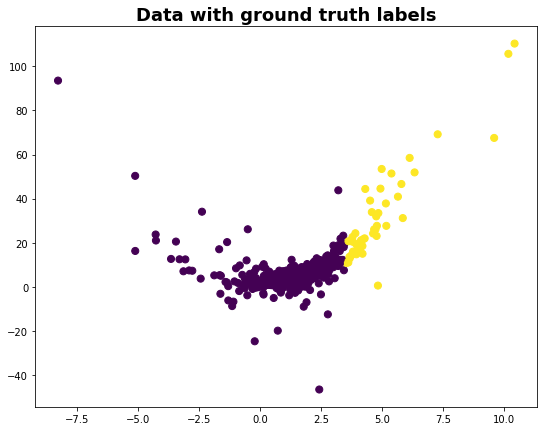

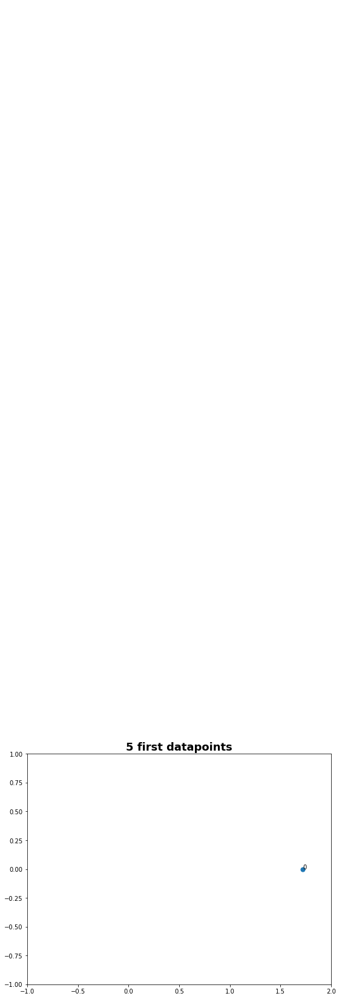

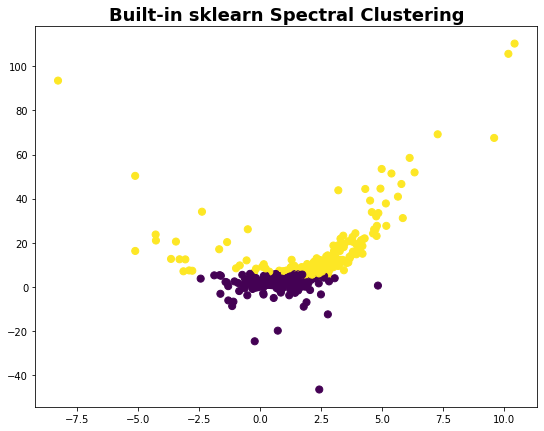

In [ ]:
%load_ext watermark
import warnings
warnings.filterwarnings("ignore") 
from IPython.core.display import display, HTML
import time
import pandas as pd
# import pandas_datareader.data as web
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from scipy.sparse import csgraph
from sklearn.cluster import SpectralClustering
from sklearn.neighbors import radius_neighbors_graph
from sklearn.neighbors import kneighbors_graph
%matplotlib inline
%watermark
from sklearn.datasets import make_moons

# creating data function
def create_data(type):
  if type=='gen':
    random_state = 21
    X_mn, y_mn = make_moons(150, noise=.07, random_state=random_state)

  elif type=='get':

    client = InfluxDBClient("sensorweb.us", "8086", "test", "sensorweb", "shake", ssl=True)
    unit = "b8:27:eb:16:1b:d7"


    stampIni = "2020-08-14T17:22:15.000Z";
    stampEnd = "2020-08-14T17:25:15.000Z";

    query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\')  and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\'   '

    result = client.query(query)
    points = list(result.get_points())

    values =  map(operator.itemgetter('value'), points)
    times  =  map(operator.itemgetter('time'),  points)

    datat = list(values)
    i=0
    y=[]
    for temp in datat:
      datat[i]=temp/10000
      if temp> 35000.0:
          y.append(1)
      else:
          y.append(0)
      i+=1
    #data= list(times)
    length=8000
    y_mn=y[0:length]
    TEO=[]
    i=0
    while i < length:
        if i>0 and i<length-1:
            temp = datat[i]*datat[i] + datat[i+1]*datat[i-1]
            TEO.append(temp)
        else:
            TEO.append(0)
        i+=1

    X_mn=np.zeros((length,2),dtype=np.float64)
    i=0
    j=0
    while i<length:
        X_mn[i][j]=datat[i]
        X_mn[i][j+1]=TEO[i]
        i+=1
  return X_mn, y_mn
 
#parameters get: for influx streaming seismic data; gen: for generating data
X_mn, y_mn=create_data('get')

cmap = 'viridis'
dot_size=50
fig, ax = plt.subplots(figsize=(9,7))
ax.set_title('Data with ground truth labels', fontsize=18, fontweight='demi')
ax.scatter(X_mn[:, 0], X_mn[:, 1],c=y_mn,s=dot_size, cmap=cmap)

A = radius_neighbors_graph(X_mn,0.4,mode='distance', metric='minkowski', p=2, metric_params=None, include_self=False)
A = A.toarray()

fig, ax = plt.subplots(figsize=(9,7))
ax.set_title('5 first datapoints', fontsize=18, fontweight='demi')
ax.set_xlim(-1, 2)
ax.set_ylim(-1,1)
ax.scatter(X_mn[:5, 0], X_mn[:5, 1],s=dot_size, cmap=cmap)
for i in range(5):
    ax.annotate(i, (X_mn[i,0],X_mn[i,1]))


model = SpectralClustering(n_clusters=2, affinity='nearest_neighbors',
                          assign_labels='kmeans')
labelsS = model.fit_predict(X_mn)
fig, ax = plt.subplots(figsize=(9,7))
ax.set_title('Built-in sklearn Spectral Clustering', fontsize=18, fontweight='demi')

plt.scatter(X_mn[:, 0], X_mn[:, 1], c=labelsS, s=dot_size, cmap=cmap)

## **Gaussian Mixture Model (GMM)** [Unsupervised]
*Author: Kayvon Ghahremani*

<br/>

Gaussian mixture models are a probabilistic model for representing normally distributed subpopulations within an overall population. Mixture models in general don't require knowing which subpopulation a data point belongs to, allowing the model to learn the subpopulations automatically. Since subpopulation assignment is not known, this constitutes a form of unsupervised learning.

*Motivation*:

One hint that data might follow a mixture model is that the data looks multimodal, i.e. there is more than one "peak" in the distribution of data. Trying to fit a multimodal distribution with a unimodal (one "peak") model will generally give a poor fit. For several theoretical reasons, the most commonly used distribution in modeling real-world unimodal data is the Gaussian distribution. Thus, modeling multimodal data as a mixture of many unimodal Gaussian distributions makes intuitive sense. Furthermore, GMMs maintain many of the theoretical and computational benefits of Gaussian models, making them practical for efficiently modeling very large datasets.

Gaussian mixture model is a function that is comprised of several Gaussians, each identified by k ∈ {1,…, K}, where K is the number of clusters of our dataset. Each Gaussian k in the mixture is comprised of the following parameters:
*   A mean μ that defines its centre.
*   A covariance Σ that defines its width. This would be equivalent to the dimensions of an ellipsoid in a multivariate scenario.
*   A mixing probability π that defines how big or small the Gaussian function will be.

Pros:
*   Compared to k-means, GMM is a lot more flexible in terms of cluster covariance and assigning clusters. 
    *   With GMM each cluster can have unconstrained covariance structure, so instead of just spherical clusters GMM can have rotated and/or elongated clusters.
*   GMM allows for mixed membership of points to clusters. 
    *   In k-means, a point belongs to one and only one cluster, whereas in GMM a point belongs to each cluster to a different degree based on probability.

Cons:
*   Longer computation time.
*   Having to decide K beforehand.
*   The data needs to be similar to a normal distribution.
*   The more uneven cluster sizes are, the higher the error rate is.
    *   If there is large difference between the size of the clusters then error rate might be significant.


Sources:

https://towardsdatascience.com/gaussian-mixture-models-explained-6986aaf5a95

https://brilliant.org/wiki/gaussian-mixture-model/

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import numpy as np

# from sklearn.datasets.samples_generator import make_blobs
# X, y_true = make_blobs(n_samples=400, centers=4,
#                        cluster_std=0.60, random_state=0)
# X = X[:, ::-1] # flip axes for better plotting

from sklearn.mixture import GaussianMixture as GMM
gmm = GMM(n_components=4).fit(data.reshape(-1,1))
labels3 = gmm.predict(data.reshape(-1,1))
fig = plt.figure(figsize=(16,5))
plt.scatter(times1, data, c=labels3, s=40, cmap='viridis')
plt.xticks([],rotation=45)
plt.plot(times1,data,'--',c='grey')
plt.xlabel('Time')

In [ ]:
from matplotlib.patches import Ellipse

def draw_ellipse(position, covariance, ax=None, **kwargs):
    """Draw an ellipse with a given position and covariance"""
    ax = ax or plt.gca()
    
    # Convert covariance to principal axes
    if covariance.shape == (2, 2):
        U, s, Vt = np.linalg.svd(covariance)
        angle = np.degrees(np.arctan2(U[1, 0], U[0, 0]))
        width, height = 2 * np.sqrt(s)
    else:
        angle = 0
        width, height = 2 * np.sqrt(covariance)
    
    # Draw the Ellipse
    for nsig in range(1, 4):
        ax.add_patch(Ellipse(position, nsig * width, nsig * height,
                             angle, **kwargs))
        
def plot_gmm(gmm, X, label=True, ax=None):
    ax = ax or plt.gca()
    labels = gmm.fit(X).predict(X)
    if label:
        ax.scatter(times1, data, c=labels3, s=40, cmap='viridis', zorder=2)
    else:
        ax.scatter(times1, data, s=40, zorder=2)
    ax.axis('equal')
    
    w_factor = 0.2 / gmm.weights_.max()
    # for pos, covar, w in zip(gmm.means_, gmm.covariances_, gmm.weights_):
    #     draw_ellipse(pos, covar, alpha=w * w_factor)

 ### ***Choosing the covariance type***

If you look at the details of the preceding fits, you will see that the ``covariance_type`` option was set differently within each.
This hyperparameter controls the degrees of freedom in the shape of each cluster; it is essential to set this carefully for any given problem.
The default is ``covariance_type="diag"``, which means that the size of the cluster along each dimension can be set independently, with the resulting ellipse constrained to align with the axes.
A slightly simpler and faster model is ``covariance_type="spherical"``, which constrains the shape of the cluster such that all dimensions are equal. The resulting clustering will have similar characteristics to that of *k*-means, though it is not entirely equivalent.
A more complicated and computationally expensive model (especially as the number of dimensions grows) is to use ``covariance_type="full"``, which allows each cluster to be modeled as an ellipse with arbitrary orientation.

We can see a visual representation of these three choices for a single cluster within the following figure:

![picture](https://drive.google.com/uc?export=view&id=1S70qrZj8RHPn0pIx2B6PvlL_YfIyvouw)

## Early classification (Supervised)

https://tslearn.readthedocs.io/en/stable/auto_examples/classification/plot_early_classification.html#sphx-glr-auto-examples-classification-plot-early-classification-py

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.cluster.k_means_ module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.cluster. Anything that cannot be imported from sklearn.cluster is now part of the private API.
  warnings.warn(message, FutureWarning)


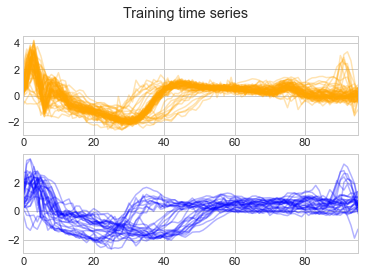

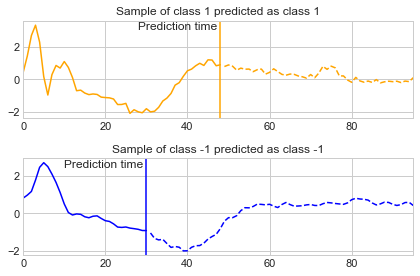

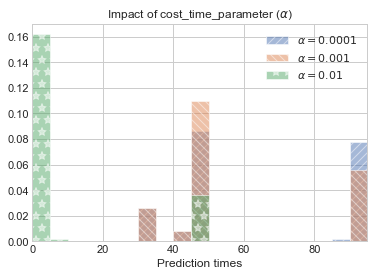

In [ ]:
# -*- coding: utf-8 -*-
"""
Early Classification
====================

This example presents the concept of early classification.

Early classifiers are implemented in the 
:mod:`tslearn.early_classification` module and in this example 
we use the method from [1].


[1] A. Dachraoui, A. Bondu & A. Cornuejols. Early classification of time
series as a non myopic sequential decision making problem. ECML/PKDD 2015
"""

# Author: Romain Tavenard
# License: BSD 3 clause
# sphinx_gallery_thumbnail_number = 2

import numpy
import matplotlib.pyplot as plt

from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.early_classification import NonMyopicEarlyClassifier
from tslearn.datasets import UCR_UEA_datasets

def plot_partial(time_series, t, y_true=0, y_pred=0, color="k"):
    plt.plot(time_series[:t+1].ravel(), color=color, linewidth=1.5)
    plt.plot(numpy.arange(t+1, time_series.shape[0]),
             time_series[t+1:].ravel(),
             linestyle="dashed", color=color, linewidth=1.5)
    plt.axvline(x=t, color=color, linewidth=1.5)
    plt.text(x=t - 20, y=time_series.max() - .25, s="Prediction time")
    plt.title(
        "Sample of class {} predicted as class {}".format(y_true, y_pred)
    )
    plt.xlim(0, time_series.shape[0] - 1)

##############################################################################
# Data loading and visualization
# ------------------------------

numpy.random.seed(0)
X_train, y_train, X_test, y_test = UCR_UEA_datasets().load_dataset("ECG200")

# Scale time series
X_train = TimeSeriesScalerMeanVariance().fit_transform(X_train)
X_test = TimeSeriesScalerMeanVariance().fit_transform(X_test)

size = X_train.shape[1]
n_classes = len(set(y_train))

plt.figure()
for i, cl in enumerate(set(y_train)):
    plt.subplot(n_classes, 1, i + 1)
    for ts in X_train[y_train == cl]:
        plt.plot(ts.ravel(), color="orange" if cl > 0 else "blue", alpha=.3)
    plt.xlim(0, size - 1)
plt.suptitle("Training time series")
plt.show()

##############################################################################
# Model fitting
# -------------
#
# As observed in the following figure, the optimal classification time as
# estimated by `NonMyopicEarlyClassifier` is data-dependent.

early_clf = NonMyopicEarlyClassifier(n_clusters=3,
                                     cost_time_parameter=1e-3,
                                     lamb=1e2,
                                     random_state=0)
early_clf.fit(X_train, y_train)

preds, times = early_clf.predict_class_and_earliness(X_test)

plt.figure()
plt.subplot(2, 1, 1)
ts_idx = 0
t = times[ts_idx]
plot_partial(X_test[ts_idx], t, y_test[ts_idx], preds[ts_idx], color="orange")


plt.subplot(2, 1, 2)
ts_idx = 9
t = times[ts_idx]
plot_partial(X_test[ts_idx], t, y_test[ts_idx], preds[ts_idx], color="blue")
plt.tight_layout()
plt.show()

##############################################################################
# Earliness-Accuracy trade-off
# ----------------------------
#
# The trade-off between earliness and accuracy is controlled via
# ``cost_time_parameter``.

plt.figure()
hatches = ["///", "\\\\\\", "*"]
for i, cost_t in enumerate([1e-4, 1e-3, 1e-2]):
    early_clf.set_params(cost_time_parameter=cost_t)
    early_clf.fit(X_train, y_train)
    preds, times = early_clf.predict_class_and_earliness(X_test)
    plt.hist(times,
             alpha=.5, hatch=hatches[i],
             density=True,
             label="$\\alpha={}$".format(cost_t),
             bins=numpy.arange(0, size, 5))
plt.legend(loc="upper right")
plt.xlim(0, size - 1)
plt.xlabel("Prediction times")
plt.title("Impact of cost_time_parameter ($\\alpha$)")
plt.show()

## K-shape time series clustering (unsupervised)

http://www1.cs.columbia.edu/~jopa/Papers/PaparrizosSIGMOD2015.pdf

@inproceedings{paparrizos2015k,
  title={k-shape: Efficient and accurate clustering of time series},
  author={Paparrizos, John and Gravano, Luis},
  booktitle={Proceedings of the 2015 ACM SIGMOD International Conference on Management of Data},
  pages={1855--1870},
  year={2015}
}

K-Shape is a shape-based time-series clustering algorithm that is efficient and domain independent. k-Shape is based on a scalable iterative
refinement procedure similar to the one used by the k-means
algorithm, but with significant differences. Specifically, kShape uses both a different distance measure and a different
method for centroid computation from those of k-means. As
argued above, k-Shape attempts to preserve the shapes of
time-series sequences while comparing them. To do so, kShape requires a distance measure that is invariant to scaling and shifting. Unlike other clustering approaches [53, 64,
87], for k-Shape we adapt the cross-correlation statistical
measure and we show: (i) how we can derive in a principled
manner a time-series distance measure that is scale- and
shift-invariant; and (ii) how this distance measure can be
computed efficiently. Based on the properties of the normalized version of cross-correlation, we develop a novel method
to compute cluster centroids, which are used in every iteration to update the assignment of time series to clusters.

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/urllib3/connectionpool.py:986: InsecureRequestWarning: Unverified HTTPS request is being made to host 'sensorweb.us'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning,
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/urllib3/connectionpool.py:986: InsecureRequestWarning: Unverified HTTPS request is being made to host 'sensorweb.us'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning,


maximum level is 10
maximum level is 10
(100, 240)
0.218 --> 0.207 --> 0.202 --> 0.201 --> 0.200 --> 0.200 --> 0.200 --> 


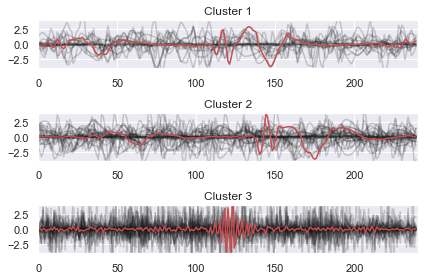

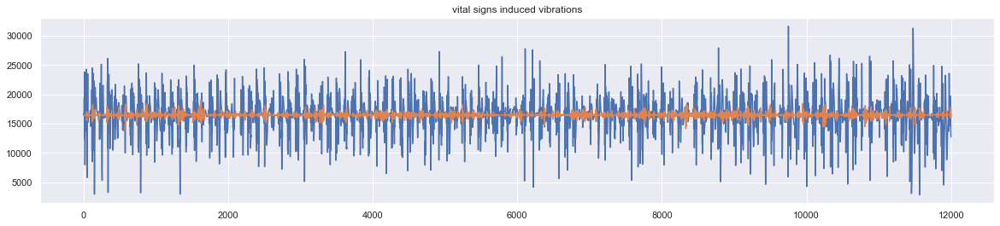

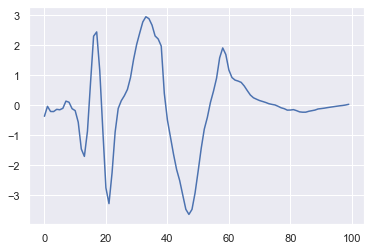

In [ ]:
#__author__ = 'Ming'
#ming.song.cn@outlook.com
#originally from http://www1.cs.columbia.edu/~jopa/Papers/PaparrizosSIGMOD2015.pdf
import numpy as np
import csv
import matplotlib.pyplot as plt
import pywt
from influxdb import InfluxDBClient
import operator
import scipy.signal as sg
import scipy as sp
# from dic.stl_decon import decomposing
from tslearn.clustering import KShape
from tslearn.datasets import CachedDatasets
from tslearn.preprocessing import TimeSeriesScalerMeanVariance

def wdenoise(data, method, threshold):
    # Create wavelet object and define parameters
    w = pywt.Wavelet(method)
    maxlev = pywt.dwt_max_level(len(data), w.dec_len)
    # maxlev = 2 # Override if desired
    print("maximum level is " + str(maxlev))
    # Decompose into wavelet components, to the level selected:
    coeffs = pywt.wavedec(data, method, level=maxlev)
    #cA = 0.0
    #cA = pywt.threshold(cA, threshold*max(cA))
    # plt.figure()
    for i in range(1, len(coeffs)):
        # plt.subplot(maxlev, 1, i)
        # plt.plot(coeffs[i])
        coeffs[i] = pywt.threshold(coeffs[i], threshold*max(coeffs[i]))
        # plt.plot(coeffs[i])
    datarec = pywt.waverec(coeffs, method)
    return datarec

ip = "sensorweb.us"

# unit = "b8:27:eb:a1:89:49"
unit1 = "b8:27:eb:f3:41:db" #shake1 cuhk
unit2 = "b8:27:eb:ed:53:36" #shake2 cuhk
# the other one: b8:27:eb:63:da:62


stampIni = "2020-08-22T20:00:00.000Z" # UTC time = EST time + 4
stampEnd = "2020-08-22T20:02:00.000Z"

client = InfluxDBClient(ip, "8086", "test", "sensorweb", "shake", ssl=True)


# query1

query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit1+'\') and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\''
result = client.query(query)
points = list(result.get_points())
values = map(operator.itemgetter('value'), points)
times = map(operator.itemgetter('time'), points)

data1 = np.array(list(values))

# query2

query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit2+'\') and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\''
result = client.query(query)
points = list(result.get_points())
values = map(operator.itemgetter('value'), points)
times = map(operator.itemgetter('time'), points)

data2 = np.array(list(values))

fs = 100 # for vibration data



if(len(data1) == 0 or len(data2) == 0):

    print("No data in the chosen time range!")

    quit()



datarec1 = wdenoise(data1, 'sym4', 0.4)
datarec2 = wdenoise(data2, 'sym4', 0.4)

# decon = decomposing(datarec)
# exit()


#### kshape

X_train1 = np.split(datarec1, 50, axis=0)
X_train2 = np.split(datarec2, 50, axis=0)
x_train = X_train1 + X_train2
print(np.asarray(x_train).shape)
# exit()


### kshape
seed = 0
np.random.seed(seed)

np.random.shuffle(x_train)

# For this method to operate properly, prior scaling is required
x_train = TimeSeriesScalerMeanVariance().fit_transform(x_train)
sz = x_train.shape[1]

# kShape clustering
ks = KShape(n_clusters=3, verbose=True, random_state=seed)
y_pred = ks.fit_predict(x_train)

plt.figure()
for yi in range(3):
    plt.subplot(3, 1, 1 + yi)
    for xx in x_train[y_pred == yi]:
        plt.plot(xx.ravel(), "k-", alpha=.2)
    plt.plot(ks.cluster_centers_[yi].ravel(), "r-")
    plt.xlim(0, sz)
    plt.ylim(-4, 4)
    plt.title("Cluster %d" % (yi + 1))
plt.tight_layout()
plt.show()

plt.figure(figsize=(20, 4))
plt.title("vital signs induced vibrations")

plt.plot(datarec1)
plt.plot(datarec2)
plt.show()

# plot the template
#tem = ks.cluster_centers_[0].ravel()[100:170]
tem = ks.cluster_centers_[0].ravel()[100:200]
plt.plot(tem)
plt.show()


## Support Vector Machine (SVM) for classification

## Lasso, Ridge and Group Lasso (ElasticNet) for classification

## Guide to AdaBoost, random forests and XGBoost (supervised)

https://jakevdp.github.io/PythonDataScienceHandbook/05.08-random-forests.html

This section contained a brief introduction to the concept of ensemble estimators, and in particular the random forest – an ensemble of randomized decision trees. Random forests are a powerful method with several advantages:

Both training and prediction are very fast, because of the simplicity of the underlying decision trees. In addition, both tasks can be straightforwardly parallelized, because the individual trees are entirely independent entities.
The multiple trees allow for a probabilistic classification: a majority vote among estimators gives an estimate of the probability (accessed in Scikit-Learn with the predict_proba() method).
The nonparametric model is extremely flexible, and can thus perform well on tasks that are under-fit by other estimators.
A primary disadvantage of random forests is that the results are not easily interpretable: that is, if you would like to draw conclusions about the meaning of the classification model, random forests may not be the best choice.

https://towardsdatascience.com/the-ultimate-guide-to-adaboost-random-forests-and-xgboost-7f9327061c4f


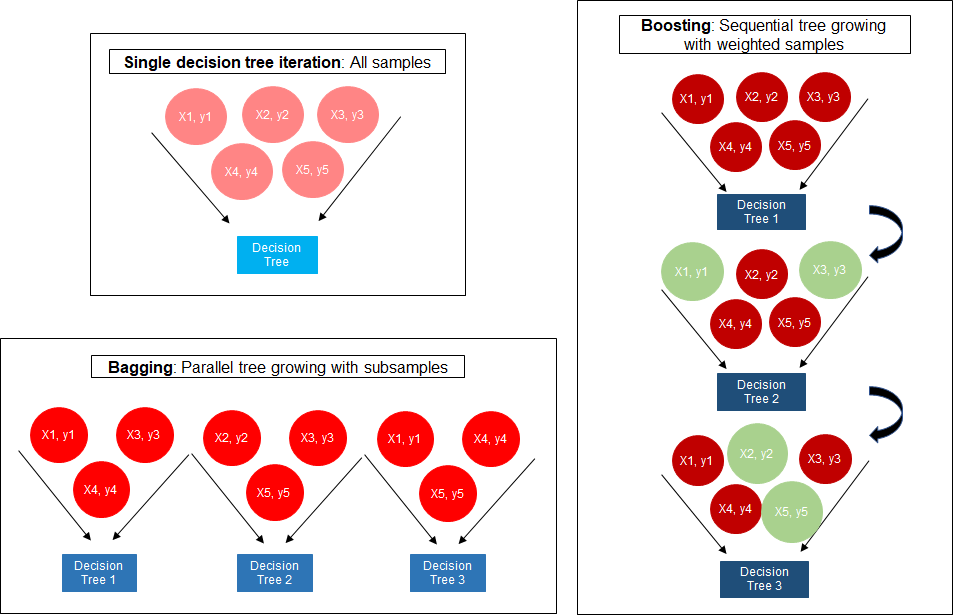

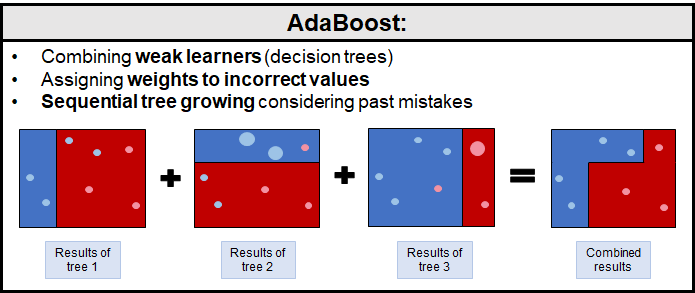

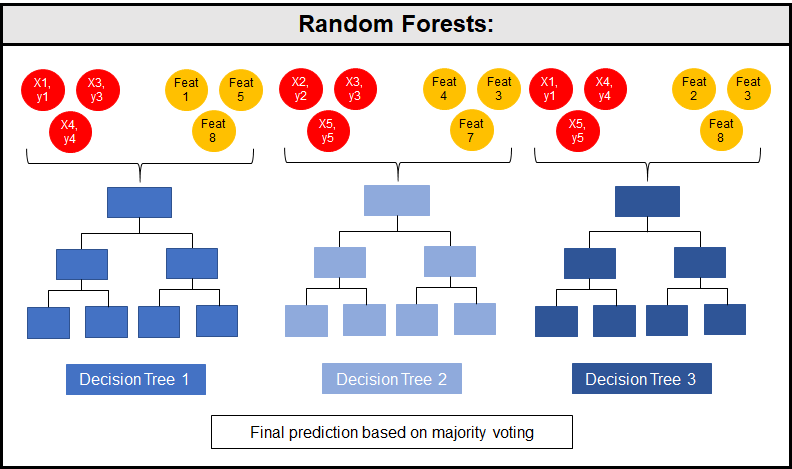


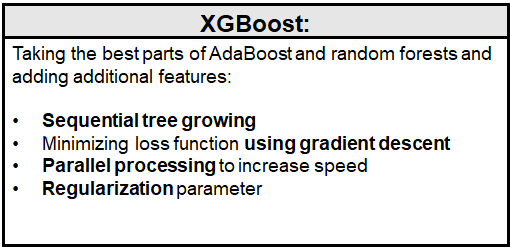

## Learning Discriminative Virtual Sequences for Time Series Classification

https://github.com/AbhilashDorle/Learning-Discriminative-Virtual-Sequences-TSC

## Affinity Propagation Clustering [Unsupervised]

*Author: Kayvon Ghahremani*

<br/>

Affinity Propagation is a fast clustering algorithm based on message passing that identifies a set of cluster center that represents the dataset. Affinity Propagation works based on similarities between pairs of data points and simultaneously considers all data points as potential exemplars (cluster centers). AP searches for clusters recursively through an iterative process, real valued messages are transmitted or exchanged between data points until high quality set of exemplars and corresponding cluster emerges. 

In the iterative process, identified exemplars start from the maximum ***n*** number to fewer exemplars until ***m*** exemplars appear and unchanging for a certain number of iterations (converges). The ***m*** clusters found based on ***m*** exemplars are the clustering solution of AP.

Pros:
*   The number of clusters does not need to be specified initially like in similar methods. 
   *   AP takes measures of similarity between pairs of data points as input, and simultaneously considers all data points as potential cluster centers.
*   Fine tuning can be done if either more or less clusters than optimal are obtained. 
   *   Just by adjusting the preferences one can lower or raise the number of clusters.
*   AP can also be used as a starting point to determine number of clusters for a dataset.

Cons:
*   Higher computational cost
*   Before clustering you need to have similarities between data points as well as preference of each point that represents each data point’s suitability to be an exemplar.

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/urllib3/connectionpool.py:986: InsecureRequestWarning: Unverified HTTPS request is being made to host 'sensorweb.us'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#ssl-warnings
  InsecureRequestWarning,
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/cluster/_affinity_propagation.py:152: FutureWarning: 'random_state' has been introduced in 0.23. It will be set to None starting from 0.25 which means that results will differ at every function call. Set 'random_state' to None to silence this warning, or to 0 to keep the behavior of versions <0.23.
  FutureWarning)
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/sklearn/cluster/_affinity_propagation.py:244: ConvergenceWarning: Affinity propagation did not converge, this model will not have any cluster centers.
  "will not ha

Estimated number of clusters: 0


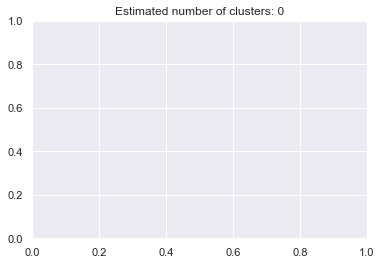

In [ ]:
import csv
import pywt
from influxdb import InfluxDBClient
import operator
import scipy.signal as sg
import scipy as sp
import sklearn


import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch

%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import numpy as np


from sklearn.cluster import AffinityPropagation
from sklearn import metrics
from sklearn.datasets import make_blobs

# # Generate sample data
# centers = [[1, 1], [-1, -1], [1, -1]]
# X, labels_true = make_blobs(n_samples=300, centers=centers, cluster_std=0.5,
#                             random_state=0)

ip = "sensorweb.us" 
unit = "b8:27:eb:76:15:20" # FloorB
stampIni = "2020-07-07T19:18:14.000Z" # UTC time = EST time + 4
stampEnd = "2020-07-07T19:18:22.000Z"
client = InfluxDBClient(ip, "8086", "test", "sensorweb", "shake",ssl=True)
# Check FloorB at http://3.136.84.223:3000/d/3HdIpxGMz/s-house-dashboard-raw-data-only?orgId=1&from=1594149493945&to=1594149503005

query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\')  and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\'   '
result = client.query(query)
points = list(result.get_points())
values =  map(operator.itemgetter('value'), points)
times  =  map(operator.itemgetter('time'),  points)
data = np.array(list(values))
times1 = np.array(list(times))
if(len(data) == 0):
  print("No data in the chosen time range!")
  quit()


# Compute Affinity Propagation
af = AffinityPropagation(preference=-50).fit(data.reshape(-1,1))
cluster_centers_indices = af.cluster_centers_indices_
labels2 = af.labels_

n_clusters_ = len(cluster_centers_indices)

print('Estimated number of clusters: %d' % n_clusters_)
#print("Homogeneity: %0.3f" % metrics.homogeneity_score(labels_true, labels))
#print("Completeness: %0.3f" % metrics.completeness_score(labels_true, labels))
#print("V-measure: %0.3f" % metrics.v_measure_score(labels_true, labels))
#print("Adjusted Rand Index: %0.3f"
#      % metrics.adjusted_rand_score(labels_true, labels))
#print("Adjusted Mutual Information: %0.3f"
#      % metrics.adjusted_mutual_info_score(labels_true, labels))
#print("Silhouette Coefficient: %0.3f"
#      % metrics.silhouette_score(X, labels, metric='sqeuclidean'))

# Plot result
import matplotlib.pyplot as plt
from itertools import cycle

plt.close('all')
plt.figure(1)
plt.clf()

colors = cycle('bgrcmykbgrcmykbgrcmykbgrcmyk')
for k, col in zip(range(n_clusters_), colors):
    class_members = labels2 == k
    cluster_center = data[cluster_centers_indices[k]]
    plt.plot(data[class_members, 0], data[class_members, 1], col + '.')
    plt.plot(cluster_center[0], cluster_center[1], 'o', markerfacecolor=col,
             markeredgecolor='k', markersize=14)
    for x in data[class_members]:
        plt.plot([cluster_center[0], x[0]], [cluster_center[1], x[1]], col)

plt.title('Estimated number of clusters: %d' % n_clusters_)
plt.show()

## 1D Convolutional and LSTM Neural Network Models

1D Convolutional Neural Network Models for Human Activity Recognition
https://machinelearningmastery.com/cnn-models-for-human-activity-recognition-time-series-classification/

LSTMs for Human Activity Recognition Time Series Classification
https://machinelearningmastery.com/how-to-develop-rnn-models-for-human-activity-recognition-time-series-classification/

## Hierarchical Agglomerative Clustering

*Author: Kayvon Ghahremani*

### **Ward Linkage**
Ward is a method of linkage for Agglomerative Hierarchical Clustering where the distance between clusters is the sum of squared differences within all clusters.

In this method, all clusters are considered, and the algorithm computes the sum of squared distances within the clusters and merges them to minimize it. From a statistical viewpoint, the process of agglomeration leads to a reduction in the variance of each resulting cluster

Ward’s method, or minimal increase of sum-of-squares (MISSQ), sometimes incorrectly called "minimum variance" method. Proximity between two clusters is the magnitude by which the summed square in their joint cluster will be greater than the combined summed square in these two clusters: 𝑆𝑆_12 − (𝑆𝑆_1 + 𝑆𝑆_2). (Between two singleton objects this quantity = squared euclidean distance / 2.) The metaphor of this built of cluster is type. Intuitively, a type is a cloud more dense and more concentric towards its middle, whereas marginal points are few and could be scattered relatively freely.
https://stats.stackexchange.com/questions/195446/choosing-the-right-linkage-method-for-hierarchical-clustering





### Ward Linkage:
![picture](https://drive.google.com/uc?export=view&id=1r4T5fEVvscEopgaQYQHUvh-SyKkOqnXc)


In [ ]:
!pip install pandas
import csv
import pywt
from influxdb import InfluxDBClient
import operator
import scipy.signal as sg
import scipy as sp
import sklearn


import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch

import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import numpy as np


ip = "sensorweb.us" 
unit = "b8:27:eb:76:15:20" # FloorB
stampIni = "2020-07-07T19:18:14.000Z" # UTC time = EST time + 4
stampEnd = "2020-07-07T19:18:22.000Z"
client = InfluxDBClient(ip, "8086", "test", "sensorweb", "shake",ssl=True)
# Check FloorB at http://3.136.84.223:3000/d/3HdIpxGMz/s-house-dashboard-raw-data-only?orgId=1&from=1594149493945&to=1594149503005

query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\')  and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\'   '
result = client.query(query)
points = list(result.get_points())
values =  map(operator.itemgetter('value'), points)
times  =  map(operator.itemgetter('time'),  points)
data = np.array(list(values))
times1 = np.array(list(times))
if(len(data) == 0):
  print("No data in the chosen time range!")
  quit()


# from sklearn.datasets.samples_generator import make_blobs
# X, y_true = make_blobs(n_samples=400, centers=4,
#                        cluster_std=0.60, random_state=0)
# X = X[:, ::-1] # flip axes for better plotting

# plt.scatter(X[:, 0], X[:, 1], s=40, cmap='viridis');

n_clusters = 4

model = AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean', linkage='ward')
model.fit(data.reshape(-1,1))
labels = model.labels_


fig = plt.figure(figsize=(16,5))
plt.plot(times1,data,'--',c='grey')
plt.scatter(times1, data, s=50, c=labels, cmap='viridis')#matplotlib.colors.ListedColormap(colors))
plt.xticks([],rotation=45)
plt.xlabel('Time')
plt.show()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


ImportError: ignored

### **Complete Linkage**

Complete is another method of linkage for Agglomerative Hierarchical Clustering where the distance between two clusters is the longest distance between two points in each cluster.

For each pair of clusters, the algorithm computes and merges them to minimize the maximum distance between the clusters (in other words, the distance of the farthest elements)

Since the proximity between two clusters is the proximity between their two most distant objects, this value is one of values of the input matrix. The metaphor of this built of cluster is circle (in the sense, by hobby or plot) where two most distant from each other members cannot be much more dissimilar than other quite dissimilar pairs (as in circle). Such clusters are "compact" contours by their borders, but they are not necessarily compact inside.

### Complete Linkage:
![picture](https://drive.google.com/uc?export=view&id=17_LQbpzcHTOC0ZsWiNzC2k4OM8bVczKc)


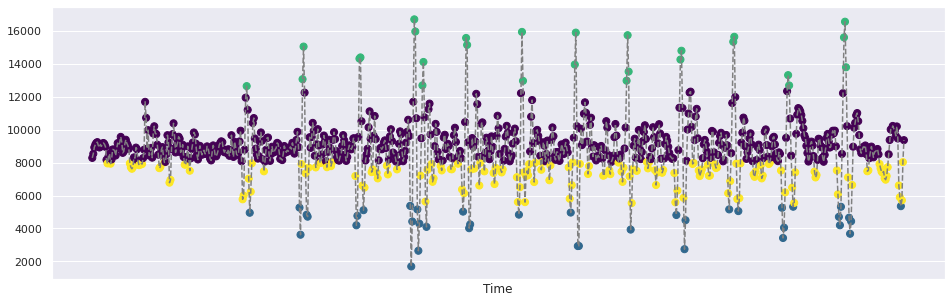

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
import numpy as np

# from sklearn.datasets.samples_generator import make_blobs
# X, y_true = make_blobs(n_samples=400, centers=4,
#                        cluster_std=0.60, random_state=0)
# X = X[:, ::-1] # flip axes for better plotting

# plt.scatter(X[:, 0], X[:, 1], s=40, cmap='viridis');

n_clusters = 4

model = AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean', linkage='complete')
model.fit(data.reshape(-1,1))
labels = model.labels_


fig = plt.figure(figsize=(16,5))
plt.plot(times1,data,'--',c='grey')
plt.scatter(times1, data, s=50, c=labels, cmap='viridis')
plt.xticks([],rotation=45)
plt.xlabel('Time')
plt.show()

### **Single Linkage**
Single linkage is a method of linkage for Agglomerative Hierarchical Clustering where the distance between two clusters is the shortest distance between two points in each cluster. Proximity between two clusters is the proximity between their two closest objects.

Two most dissimilar cluster members can happen to be very much dissimilar in comparison to two most similar. Single linkage method controls only nearest neighbours similarity.

![picture](https://drive.google.com/uc?export=view&id=1ppBmjkiGylkWReIi4TDzrvkjLjQrRJ98)

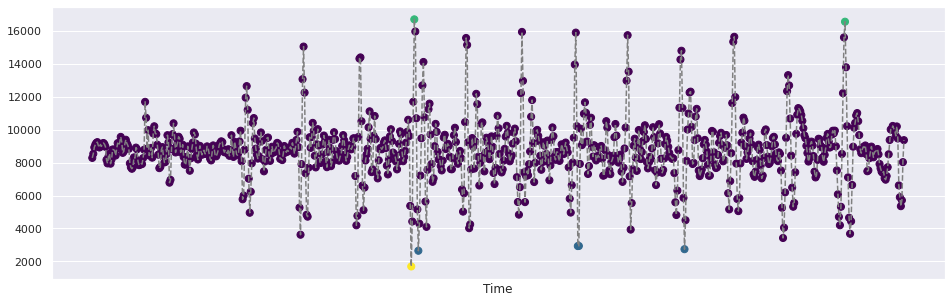

In [ ]:
n_clusters = 4
model = AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean', linkage='single')
model.fit(data.reshape(-1,1))
labels = model.labels_


fig = plt.figure(figsize=(16,5))
plt.plot(times1,data,'--',c='grey')
plt.scatter(times1, data, s=50, c=labels, cmap='viridis')
plt.xticks([],rotation=45)
plt.xlabel('Time')
plt.show()

### **Average Linkage**
The distance between clusters is the average distance between each point in one cluster to every point in other cluster. 

Proximity between two clusters is the arithmetic mean of all the proximities between the objects of one, on one side, and the objects of the other, on the other side; while the subclusters of which each of these two clusters were merged recently have equalized influence on that proximity – even if the subclusters differed in the number of objects.

![picture](https://drive.google.com/uc?export=view&id=142fahYi2jepnNVXnk0dYTdcxzbQi3yyD)

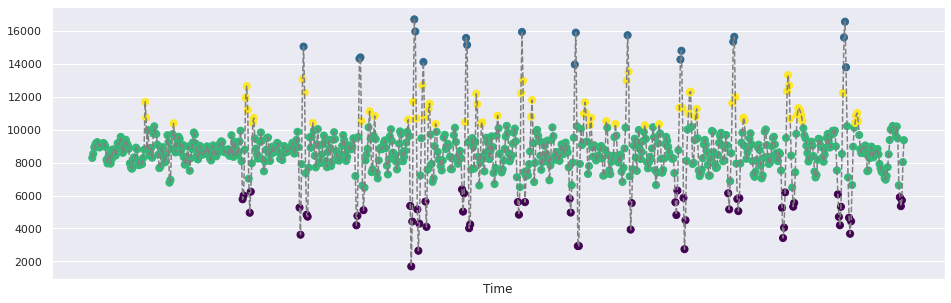

In [ ]:
model = AgglomerativeClustering(n_clusters=n_clusters, affinity='euclidean', linkage='average')
model.fit(data.reshape(-1,1))
labels = model.labels_


fig = plt.figure(figsize=(16,5))
plt.plot(times1,data,'--',c='grey')
plt.scatter(times1, data, s=50, c=labels, cmap='viridis')
plt.xticks([],rotation=45)
plt.xlabel('Time')
plt.show()

#Prediction and Forecast

* Linear: time series (ARIMA), spatial-temporal 
* Nonliner: RNN (LSTM), point-process model (Generalized linear model)



###AR (Autoregression)
*Author: Soumya Pal*

An autoregressive model uses a linear combination of past values of the target to make forecasts. The regression is made against the target itself.
AR(p) model is incredibly flexible and it can model many different types of time series patterns. Usually, autoregressive models are applied to stationary time series only.

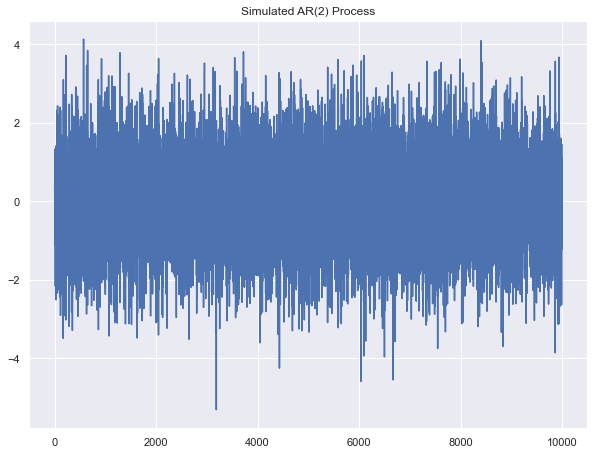

rho: [0.34675101 0.49774995]
sigma: 0.9965460739607097


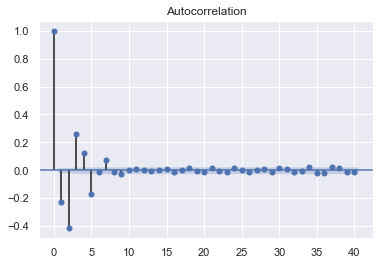

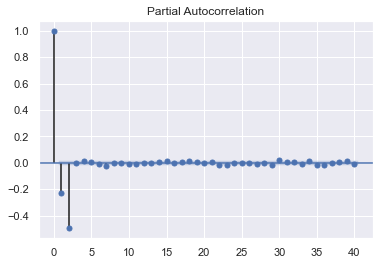

In [ ]:
#source: https://towardsdatascience.com/time-series-forecasting-with-autoregressive-processes-ba629717401

from statsmodels.graphics.tsaplots import plot_pacf   
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.tsa.stattools import pacf
from statsmodels.regression.linear_model import yule_walker
from statsmodels.tsa.stattools import adfuller
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

#coefficients [sigma, phi, phi], result must be close
ar2 = np.array([1, 0.33, 0.5])
ma = np.array([1])

#generate data
simulated_AR2_data = ArmaProcess(ar2, ma).generate_sample(nsample=10000)

plt.figure(figsize=[10, 7.5]); # Set dimensions for figure
plt.plot(simulated_AR2_data)
plt.title("Simulated AR(2) Process")
plt.show()

plot_acf(simulated_AR2_data); #autocorrelation plot
plot_pacf(simulated_AR2_data); #partial autocorrelation plot

#coefficients phi estimation using tule_walker equation
rho, sigma = yule_walker(simulated_AR2_data, 2, method='mle')
print(f'rho: {-rho}')
print(f'sigma: {sigma}')

###ARIMA
*Author: Soumya Pal*

A popular and widely used statistical method for time series forecasting is the ARIMA model.

ARIMA is an acronym that stands for AutoRegressive Integrated Moving Average. It is a class of model that captures a suite of different standard temporal structures in time series data. It explicitly caters to a suite of standard structures in time series data, and as such provides a simple yet powerful method for making skillful time series forecasts.

Link for more details: https://machinelearningmastery.com/arima-for-time-series-forecasting-with-python/#:~:text=Autoregressive%20Integrated%20Moving%20Average%20Model,making%20skillful%20time%20series%20forecasts.


In [ ]:
# ARIMA example
!pip install statsmodels
from statsmodels.tsa.arima_model import ARIMA
from random import random
from influxdb import InfluxDBClient
import operator
import tensorflow as tf
from sklearn.metrics import mean_squared_error
from matplotlib import pyplot
import tensorflow as tf
# contrived dataset
#data = [x + random() for x in range(1, 100)]

def create_data(type):
    if type=='gen':
      X = [x + random() for x in range(1, 100)]
    
    elif type=='get':
      client = InfluxDBClient("sensorweb.us", "8086", "test", "sensorweb", "shake", ssl=True)
      unit = "b8:27:eb:16:1b:d7"


      stampIni = "2020-08-14T17:22:15.000Z";
      stampEnd = "2020-08-14T17:25:15.000Z";

      query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\')  and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\'   '

      result = client.query(query)
      points = list(result.get_points())

      values =  map(operator.itemgetter('value'), points)
      times  =  map(operator.itemgetter('time'),  points)

      X=list(values)
    return X
      #no of points to use for testing
with tf.device('/device:GPU:0'):
  #parameters get: for influx streaming seismic data; gen: for generating data
    X=create_data('get')
    cnt=10
    size=len(X)-cnt

    #size = int(len(X) * 0.66)
    train, test = X[0:size], X[size:len(X)]
    history = [x for x in train]
    predictions = list()

      #testing model on last 10 points
    print("Predicting on last",cnt,"points:")
    for t in range(len(test)):
        model = ARIMA(history, order=(5,1,0))
        model_fit = model.fit(disp=0)
        output = model_fit.forecast()
        yhat = output[0]
        predictions.append(yhat)
        obs = test[t]
        history.append(obs)
        print('predicted=%f, expected=%f' % (yhat, obs))
    error = mean_squared_error(test, predictions)
    print('Test MSE: %.3f' % error)
      # plot
    pyplot.plot(test)
    pyplot.plot(predictions, color='red')
    pyplot.show()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


ImportError: ignored

In [ ]:
!pip install influxdb

### LSTM

Author = 'Ming'


As we know, RNN is able to achieve data prediction problem as it has certain structure which allows the network inherit the input information and pass it to output. We could apply RNN on word prediction or any sequence signal prediction. However, RNN in some cases will be greatly suffered from gradient vanishing problem. On this basis, Hochreiter and Schmidhuber proposed Long-short-Term-Memory(LSTM) in 1997, which enables RNN inheriting previous information without suffering from gradient vanishing problem.
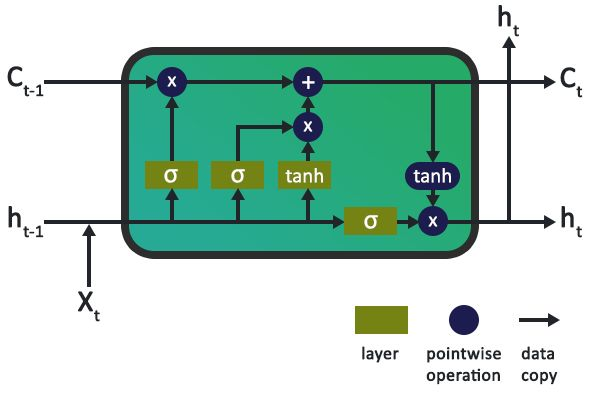

Upper figure shows a typical LSTM unit. It contains several node and operations. Similar to RNN, due to the including of activation operation(tanh), it is capable of dealing with non-linear problem. 





Following shows a demonstration of predicting stock market trend.

Unlike those data which has clear trend or pattern, stock market is influenced by many factors and many of those are random. Pure random is not predictable, nevertheless, stock market data could have hidden pattern in some certain degree. Thus, we could make good use of the advantage of LSTM that it could learn from context to estimate stock market. In a more general sense, we could also use LSTM on other case which also has hidden pattern.

In [ ]:
import math
import numpy as np
import pandas as pd

class DataLoader():
    """A class for loading and transforming data for the lstm model"""

    def __init__(self, filename, split, cols):
        dataframe = pd.read_csv(filename)
        i_split = int(len(dataframe) * split)
        self.data_train = dataframe.get(cols).values[:i_split]
        self.data_test  = dataframe.get(cols).values[i_split:]
        self.len_train  = len(self.data_train)
        self.len_test   = len(self.data_test)
        self.len_train_windows = None

    def get_test_data(self, seq_len, normalise):
        '''
        Create x, y test data windows
        Warning: batch method, not generative, make sure you have enough memory to
        load data, otherwise reduce size of the training split.
        '''
        data_windows = []
        for i in range(self.len_test - seq_len):
            data_windows.append(self.data_test[i:i+seq_len])

        data_windows = np.array(data_windows).astype(float)
        data_windows = self.normalise_windows(data_windows, single_window=False) if normalise else data_windows

        x = data_windows[:, :-1]
        y = data_windows[:, -1, [0]]
        return x,y

    def get_train_data(self, seq_len, normalise):
        '''
        Create x, y train data windows
        Warning: batch method, not generative, make sure you have enough memory to
        load data, otherwise use generate_training_window() method.
        '''
        data_x = []
        data_y = []
        for i in range(self.len_train - seq_len):
            x, y = self._next_window(i, seq_len, normalise)
            data_x.append(x)
            data_y.append(y)
        return np.array(data_x), np.array(data_y)

    def generate_train_batch(self, seq_len, batch_size, normalise):
        '''Yield a generator of training data from filename on given list of cols split for train/test'''
        i = 0
        while i < (self.len_train - seq_len):
            x_batch = []
            y_batch = []
            for b in range(batch_size):
                if i >= (self.len_train - seq_len):
                    # stop-condition for a smaller final batch if data doesn't divide evenly
                    yield np.array(x_batch), np.array(y_batch)
                    i = 0
                x, y = self._next_window(i, seq_len, normalise)
                x_batch.append(x)
                y_batch.append(y)
                i += 1
            yield np.array(x_batch), np.array(y_batch)

    def _next_window(self, i, seq_len, normalise):
        '''Generates the next data window from the given index location i'''
        window = self.data_train[i:i+seq_len]
        window = self.normalise_windows(window, single_window=True)[0] if normalise else window
        x = window[:-1]
        y = window[-1, [0]]
        return x, y

    def normalise_windows(self, window_data, single_window=False):
        '''Normalise window with a base value of zero'''
        normalised_data = []
        window_data = [window_data] if single_window else window_data
        for window in window_data:
            normalised_window = []
            for col_i in range(window.shape[1]):
                normalised_col = [((float(p) / float(window[0, col_i])) - 1) for p in window[:, col_i]]
                normalised_window.append(normalised_col)
            normalised_window = np.array(normalised_window).T # reshape and transpose array back into original multidimensional format
            normalised_data.append(normalised_window)
        return np.array(normalised_data)


In [ ]:
import datetime as dt

class Timer():

	def __init__(self):
		self.start_dt = None

	def start(self):
		self.start_dt = dt.datetime.now()

	def stop(self):
		end_dt = dt.datetime.now()
		print('Time taken: %s' % (end_dt - self.start_dt))

In [ ]:
import os
import math
import numpy as np
import datetime as dt
from numpy import newaxis
from keras.layers import Dense, Activation, Dropout, LSTM
from keras.models import Sequential, load_model
from keras.callbacks import EarlyStopping, ModelCheckpoint

class Model():
	"""A class for an building and inferencing an lstm model"""

	def __init__(self):
		self.model = Sequential()

	def load_model(self, filepath):
		print('[Model] Loading model from file %s' % filepath)
		self.model = load_model(filepath)

	def build_model(self, configs):
		timer = Timer()
		timer.start()

		for layer in configs['model']['layers']:
			neurons = layer['neurons'] if 'neurons' in layer else None
			dropout_rate = layer['rate'] if 'rate' in layer else None
			activation = layer['activation'] if 'activation' in layer else None
			return_seq = layer['return_seq'] if 'return_seq' in layer else None
			input_timesteps = layer['input_timesteps'] if 'input_timesteps' in layer else None
			input_dim = layer['input_dim'] if 'input_dim' in layer else None

			if layer['type'] == 'dense':
				self.model.add(Dense(neurons, activation=activation))
			if layer['type'] == 'lstm':
				self.model.add(LSTM(neurons, input_shape=(input_timesteps, input_dim), return_sequences=return_seq))
			if layer['type'] == 'dropout':
				self.model.add(Dropout(dropout_rate))

		self.model.compile(loss=configs['model']['loss'], optimizer=configs['model']['optimizer'])

		print('[Model] Model Compiled')
		timer.stop()

	def train(self, x, y, epochs, batch_size, save_dir):
		timer = Timer()
		timer.start()
		print('[Model] Training Started')
		print('[Model] %s epochs, %s batch size' % (epochs, batch_size))
		
		save_fname = os.path.join(save_dir, '%s-e%s.h5' % (dt.datetime.now().strftime('%d%m%Y-%H%M%S'), str(epochs)))
		callbacks = [
			EarlyStopping(monitor='val_loss', patience=2),
			ModelCheckpoint(filepath=save_fname, monitor='val_loss', save_best_only=True)
		]
		self.model.fit(
			x,
			y,
			epochs=epochs,
			batch_size=batch_size,
			callbacks=callbacks
		)
		self.model.save(save_fname)

		print('[Model] Training Completed. Model saved as %s' % save_fname)
		timer.stop()

	def train_generator(self, data_gen, epochs, batch_size, steps_per_epoch, save_dir):
		timer = Timer()
		timer.start()
		print('[Model] Training Started')
		print('[Model] %s epochs, %s batch size, %s batches per epoch' % (epochs, batch_size, steps_per_epoch))
		
		save_fname = os.path.join(save_dir, '%s-e%s.h5' % (dt.datetime.now().strftime('%d%m%Y-%H%M%S'), str(epochs)))
		callbacks = [
			ModelCheckpoint(filepath=save_fname, monitor='loss', save_best_only=True)
		]
		self.model.fit_generator(
			data_gen,
			steps_per_epoch=steps_per_epoch,
			epochs=epochs,
			callbacks=callbacks,
			workers=1
		)
		
		print('[Model] Training Completed. Model saved as %s' % save_fname)
		timer.stop()

	def predict_point_by_point(self, data):
		#Predict each timestep given the last sequence of true data, in effect only predicting 1 step ahead each time
		print('[Model] Predicting Point-by-Point...')
		predicted = self.model.predict(data)
		predicted = np.reshape(predicted, (predicted.size,))
		return predicted

	def predict_sequences_multiple(self, data, window_size, prediction_len):
		#Predict sequence of 50 steps before shifting prediction run forward by 50 steps
		print('[Model] Predicting Sequences Multiple...')
		prediction_seqs = []
		for i in range(int(len(data)/prediction_len)):
			curr_frame = data[i*prediction_len]
			predicted = []
			for j in range(prediction_len):
				predicted.append(self.model.predict(curr_frame[newaxis,:,:])[0,0])
				curr_frame = curr_frame[1:]
				curr_frame = np.insert(curr_frame, [window_size-2], predicted[-1], axis=0)
			prediction_seqs.append(predicted)
		return prediction_seqs

	def predict_sequence_full(self, data, window_size):
		#Shift the window by 1 new prediction each time, re-run predictions on new window
		print('[Model] Predicting Sequences Full...')
		curr_frame = data[0]
		predicted = []
		for i in range(len(data)):
			predicted.append(self.model.predict(curr_frame[newaxis,:,:])[0,0])
			curr_frame = curr_frame[1:]
			curr_frame = np.insert(curr_frame, [window_size-2], predicted[-1], axis=0)
		return predicted


In [ ]:
import os
import json
import time
import math
import matplotlib.pyplot as plt

# /content/lstm_prediction/data/sp500.csv

def plot_results(predicted_data, true_data):
    fig = plt.figure(facecolor='white')
    ax = fig.add_subplot(111)
    ax.plot(true_data, label='True Data')
    plt.plot(predicted_data, label='Prediction')
    plt.legend()
    plt.show()


def plot_results_multiple(predicted_data, true_data, prediction_len):
    fig = plt.figure(facecolor='white')
    ax = fig.add_subplot(111)
    ax.plot(true_data, label='True Data')
	# Pad the list of predictions to shift it in the graph to it's correct start
    for i, data in enumerate(predicted_data):
        padding = [None for p in range(i * prediction_len)]
        plt.plot(padding + data, label='Prediction')
        plt.legend()
    plt.show()


def main():
    configs = json.load(open('/content/lstm_prediction/config.json', 'r'))
    if not os.path.exists(configs['model']['save_dir']): os.makedirs(configs['model']['save_dir'])

    data = DataLoader(
        os.path.join('data', configs['data']['filename']),
        configs['data']['train_test_split'],
        configs['data']['columns']
    )

    model = Model()
    model.build_model(configs)
    x, y = data.get_train_data(
        seq_len=configs['data']['sequence_length'],
        normalise=configs['data']['normalise']
    )

    '''
	# in-memory training
	model.train(
		x,
		y,
		epochs = configs['training']['epochs'],
		batch_size = configs['training']['batch_size'],
		save_dir = configs['model']['save_dir']
	)
	'''
    # out-of memory generative training
    steps_per_epoch = math.ceil((data.len_train - configs['data']['sequence_length']) / configs['training']['batch_size'])
    model.train_generator(
        data_gen=data.generate_train_batch(
            seq_len=configs['data']['sequence_length'],
            batch_size=configs['training']['batch_size'],
            normalise=configs['data']['normalise']
        ),
        epochs=configs['training']['epochs'],
        batch_size=configs['training']['batch_size'],
        steps_per_epoch=steps_per_epoch,
        save_dir=configs['model']['save_dir']
    )

    x_test, y_test = data.get_test_data(
        seq_len=configs['data']['sequence_length'],
        normalise=configs['data']['normalise']
    )

    # predictions = model.predict_sequences_multiple(x_test, configs['data']['sequence_length'], configs['data']['sequence_length'])
    # predictions = model.predict_sequence_full(x_test, configs['data']['sequence_length'])
    predictions = model.predict_point_by_point(x_test)

    # plot_results_multiple(predictions, y_test, configs['data']['sequence_length'])
    plot_results(predictions, y_test)


if __name__ == '__main__':
    main()


## Sequence-to-sequence Using Transformer

author: Woody & Yao

Reference: https://pytorch.org/tutorials/beginner/transformer_tutorial.html

This model replaces the RNN (or CNN) layers in the encoder-decorder of a standard Sequence-to-Sequence (Seq2Seq) model and replaces them with multi-headed self-attention layers; the Transformer.

In [ ]:
import math
import torch
import torch.nn as nn
import torch.nn.functional as F

class TransformerModel(nn.Module):

    def __init__(self, ntoken, ninp, nhead, nhid, nlayers, dropout=0.5):
        super(TransformerModel, self).__init__()
        from torch.nn import TransformerEncoder, TransformerEncoderLayer
        self.model_type = 'Transformer'
        self.src_mask = None
        self.pos_encoder = PositionalEncoding(ninp, dropout)
        encoder_layers = TransformerEncoderLayer(ninp, nhead, nhid, dropout)
        self.transformer_encoder = TransformerEncoder(encoder_layers, nlayers)
        self.encoder = nn.Embedding(ntoken, ninp)
        self.ninp = ninp
        self.decoder = nn.Linear(ninp, ntoken)

        self.init_weights()

    def _generate_square_subsequent_mask(self, sz):
        mask = (torch.triu(torch.ones(sz, sz)) == 1).transpose(0, 1)
        mask = mask.float().masked_fill(mask == 0, float('-inf')).masked_fill(mask == 1, float(0.0))
        return mask

    def init_weights(self):
        initrange = 0.1
        self.encoder.weight.data.uniform_(-initrange, initrange)
        self.decoder.bias.data.zero_()
        self.decoder.weight.data.uniform_(-initrange, initrange)

    def forward(self, src):
        if self.src_mask is None or self.src_mask.size(0) != len(src):
            device = src.device
            mask = self._generate_square_subsequent_mask(len(src)).to(device)
            self.src_mask = mask

        src = self.encoder(src) * math.sqrt(self.ninp)
        src = self.pos_encoder(src)
        output = self.transformer_encoder(src, self.src_mask)
        output = self.decoder(output)
        return output

In [ ]:
class PositionalEncoding(nn.Module):

    def __init__(self, d_model, dropout=0.1, max_len=5000):
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0).transpose(0, 1)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:x.size(0), :]
        return self.dropout(x)

In [ ]:
import torchtext
from torchtext.data.utils import get_tokenizer
# This could be changed to any high-dimensional sequential data. 
TEXT = torchtext.data.Field(tokenize=get_tokenizer("basic_english"),
                            init_token='<sos>',
                            eos_token='<eos>',
                            lower=True)
train_txt, val_txt, test_txt = torchtext.datasets.WikiText2.splits(TEXT)
TEXT.build_vocab(train_txt)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def batchify(data, bsz):
    data = TEXT.numericalize([data.examples[0].text])
    # Divide the dataset into bsz parts.
    nbatch = data.size(0) // bsz
    # Trim off any extra elements that wouldn't cleanly fit (remainders).
    data = data.narrow(0, 0, nbatch * bsz)
    # Evenly divide the data across the bsz batches.
    data = data.view(bsz, -1).t().contiguous()
    return data.to(device)

batch_size = 20
eval_batch_size = 10
train_data = batchify(train_txt, batch_size)
val_data = batchify(val_txt, eval_batch_size)
test_data = batchify(test_txt, eval_batch_size)

ValueError: ignored

In [ ]:
bptt = 35
def get_batch(source, i):
    seq_len = min(bptt, len(source) - 1 - i)
    data = source[i:i+seq_len]
    target = source[i+1:i+1+seq_len].view(-1)
    return data, target

In [ ]:
# added by SJC, this portion of code was left out
ntokens = len(TEXT.vocab.stoi) # the size of vocabulary
emsize = 200 # embedding dimension
nhid = 200 # the dimension of the feedforward network model in nn.TransformerEncoder
nlayers = 2 # the number of nn.TransformerEncoderLayer in nn.TransformerEncoder
nhead = 2 # the number of heads in the multiheadattention models
dropout = 0.2 # the dropout value
model = TransformerModel(ntokens, emsize, nhead, nhid, nlayers, dropout).to(device)

NameError: ignored

In [ ]:
criterion = nn.CrossEntropyLoss()
lr = 5.0 # learning rate
optimizer = torch.optim.SGD(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, 1.0, gamma=0.95)

import time
def train():
    model.train() # Turn on the train mode
    total_loss = 0.
    start_time = time.time()
    ntokens = len(TEXT.vocab.stoi)
    for batch, i in enumerate(range(0, train_data.size(0) - 1, bptt)):
        data, targets = get_batch(train_data, i)
        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output.view(-1, ntokens), targets)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 0.5)
        optimizer.step()

        total_loss += loss.item()
        log_interval = 200
        if batch % log_interval == 0 and batch > 0:
            cur_loss = total_loss / log_interval
            elapsed = time.time() - start_time
            print('| epoch {:3d} | {:5d}/{:5d} batches | '
                  'lr {:02.2f} | ms/batch {:5.2f} | '
                  'loss {:5.2f} | ppl {:8.2f}'.format(
                    epoch, batch, len(train_data) // bptt, scheduler.get_lr()[0],
                    elapsed * 1000 / log_interval,
                    cur_loss, math.exp(cur_loss)))
            total_loss = 0
            start_time = time.time()

def evaluate(eval_model, data_source):
    eval_model.eval() # Turn on the evaluation mode
    total_loss = 0.
    ntokens = len(TEXT.vocab.stoi)
    with torch.no_grad():
        for i in range(0, data_source.size(0) - 1, bptt):
            data, targets = get_batch(data_source, i)
            output = eval_model(data)
            output_flat = output.view(-1, ntokens)
            total_loss += len(data) * criterion(output_flat, targets).item()
    return total_loss / (len(data_source) - 1)

NameError: ignored

In [ ]:
best_val_loss = float("inf")
epochs = 3 # The number of epochs
best_model = None

for epoch in range(1, epochs + 1):
    epoch_start_time = time.time()
    train()
    val_loss = evaluate(model, val_data)
    print('-' * 89)
    print('| end of epoch {:3d} | time: {:5.2f}s | valid loss {:5.2f} | '
          'valid ppl {:8.2f}'.format(epoch, (time.time() - epoch_start_time),
                                     val_loss, math.exp(val_loss)))
    print('-' * 89)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_model = model

    scheduler.step()

NameError: ignored

In [ ]:
# added by SJC, this portion of code was left out
test_loss = evaluate(best_model, test_data)
print('=' * 89)
print('| End of training | test loss {:5.2f} | test ppl {:8.2f}'.format(
    test_loss, math.exp(test_loss)))
print('=' * 89)

NameError: ignored

Pros:
*   Can map sequences of varying lengths
*   Order of input in sequence not important
*   Attention mechanisms are less prone to vanishing gradient issues
*   The Transformer allows for significantly more parallelization that other Seq2Seq models
*   Works well with Natural Language Processing (NLP) and Neural Maching Translation (NMT)

Cons:
*   Training takes a very long time, although not as much so as traditional Seq2Seq with CNN and/or RNN in encoder/decoder
*   Position data must be added to the model



## Transformers for time series data

https://simpletransformers.ai/docs/multi-class-classification/


## Deep learning models for stock prediction

https://github.com/huseinzol05/Stock-Prediction-Models

## Mini Batch Mean
*Author: Soumya Pal*

It is a type of gradient descent. In this mini-batch gradient descent a small subset of the training set is processed in each iteration.

Pros:
*   Easily fits in the memory.
*   It is computationally efficient.
*   If stuck in local minimums, some noisy steps can lead the way out of them
*   Average of the training samples produces stable error gradients and convergence.

Cons
*   Low final accuracy: Many times mini batching may result in low final accuracy since the noise in the gradient is really helpful towards the end to extract that last 0.5%.

In [ ]:
import numpy as np 
import matplotlib.pyplot as plt
from influxdb import InfluxDBClient
import operator

# creating data function
def create_data(type):
  if type=='gen':
    mean = np.array([5.0, 6.0]) 
    cov = np.array([[1.0, 0.95], [0.95, 1.2]]) 
    data = np.random.multivariate_normal(mean, cov, 8000)
    #print(data)

    # visualising data 
    #plt.scatter(data[:500, 0], data[:500, 1], marker = '.') 
    #plt.show()
  elif type=='get':
    h = .02  # step size in the mesh


    client = InfluxDBClient("sensorweb.us", "8086", "test", "sensorweb", "shake", ssl=True)
    unit = "b8:27:eb:16:1b:d7"


    stampIni = "2020-08-14T17:22:15.000Z";
    stampEnd = "2020-08-14T17:25:15.000Z";

    query = 'SELECT "value" FROM Z WHERE ("location" = \''+unit+'\')  and time >= \''+stampIni+'\' and time <= \''+stampEnd+'\'   '

    result = client.query(query)
    points = list(result.get_points())

    values =  map(operator.itemgetter('value'), points)
    times  =  map(operator.itemgetter('time'),  points)

    datat = list(values)
    i=0
    for temp in datat:
      datat[i]=temp/10000
      i+=1
    #data= list(times)
    length=8000

    TEO=[]
    i=0
    while i < length:
        if i>0 and i<length-1:
            temp = datat[i]*datat[i] + datat[i+1]*datat[i-1]
            TEO.append(temp)
        else:
            TEO.append(0)
        i+=1

    data=np.zeros((length,2),dtype=np.float64)
    i=0
    j=0
    while i<length:
        data[i][j]=datat[i]
        data[i][j+1]=TEO[i]
        i+=1
  return data
 
# train-test-split 
data = np.hstack((np.ones((data.shape[0], 1)), data)) 
#print(data[0:10])
split_factor = 0.90
split = int(split_factor * data.shape[0]) 
  
X_train = data[:split, :-1] 
y_train = data[:split, -1].reshape((-1, 1)) 
X_test = data[split:, :-1] 
y_test = data[split:, -1].reshape((-1, 1)) 
#print(X_train[0:10])
#print(y_train[0:10])
print("Number of examples in training set = % d"%(X_train.shape[0])) 
print("Number of examples in testing set = % d"%(X_test.shape[0])) 

# linear regression using "mini-batch" gradient descent 
# function to compute hypothesis / predictions 
def hypothesis(X, theta): 
    return np.dot(X, theta) 
  
# function to compute gradient of error function w.r.t. theta 
def gradient(X, y, theta): 
    h = hypothesis(X, theta) 
    grad = np.dot(X.transpose(), (h - y)) 
    return grad 
  
# function to compute the error for current values of theta 
def cost(X, y, theta): 
    h = hypothesis(X, theta) 
    J = np.dot((h - y).transpose(), (h - y)) 
    J /= 2
    return J[0] 
  
# function to create a list containing mini-batches 
def create_mini_batches(X, y, batch_size): 
    mini_batches = [] 
    data = np.hstack((X, y)) 
    np.random.shuffle(data) 
    n_minibatches = data.shape[0] // batch_size 
    i = 0
  
    for i in range(n_minibatches + 1): 
        mini_batch = data[i * batch_size:(i + 1)*batch_size, :] 
        X_mini = mini_batch[:, :-1] 
        Y_mini = mini_batch[:, -1].reshape((-1, 1)) 
        mini_batches.append((X_mini, Y_mini)) 
    if data.shape[0] % batch_size != 0: 
        mini_batch = data[i * batch_size:data.shape[0]] 
        X_mini = mini_batch[:, :-1] 
        Y_mini = mini_batch[:, -1].reshape((-1, 1)) 
        mini_batches.append((X_mini, Y_mini)) 
    return mini_batches 
  
# function to perform mini-batch gradient descent 
def gradientDescent(X, y, learning_rate = 0.001, batch_size = 32): 
    theta = np.zeros((X.shape[1], 1)) 
    error_list = [] 
    max_iters = 3
    for itr in range(max_iters): 
        mini_batches = create_mini_batches(X, y, batch_size) 
        for mini_batch in mini_batches: 
            X_mini, y_mini = mini_batch 
            theta = theta - learning_rate * gradient(X_mini, y_mini, theta) 
            error_list.append(cost(X_mini, y_mini, theta)) 
  
    return theta, error_list 

#parameters get: for influx streaming seismic data; gen: for generating data
data=create_data('get')

theta, error_list = gradientDescent(X_train, y_train) 
print("Bias = ", theta[0]) 
print("Coefficients = ", theta[1:]) 

# visualising gradient descent 
plt.plot(error_list) 
plt.xlabel("Number of iterations") 
plt.ylabel("Cost") 
plt.show() 

# predicting output for X_test 
y_pred = hypothesis(X_test, theta) 
plt.scatter(X_test[:, 1], y_test[:, ], marker = '.') 
plt.plot(X_test[:, 1], y_pred, color = 'orange') 
plt.show() 
  
# calculating error in predictions 
error = np.sum(np.abs(y_test - y_pred) / y_test.shape[0]) 
print("Mean absolute error = ", error)